# Liver Disease Prediction

## The Lifecycle In A Data Science Projects


### 1. Data Gathering
1. Problem Identification/problem understanding
2.	Data collection
3.	Train Val Test split
4.	Just look at the data/try to get a sense of the data/Understand the data
5.	Data cleaning

### 2.EDA

6.	Univariate Analysis
7.	Bi-variate Analysis
8.	Explore Numerical features
9.	Explore Categorical features

### 3.Feature Engineering

10.	Handing Missing values
11.	Handling Outliers
12. Feature transformation
13. Categorical Feature Encoding
14.	Feature scaling
15.	Imbalanced dataset

### 4.Model building

### 5.Feature Selection
16.	Feature Importance
17.	Feature Selection

### 6.Model Evaluation

### 7.Model Saving

### 8.Model Deployment

### 1.Problem Identification/problem understanding

#### Here the problem/challenge is to predict whether a person have the Liver disease or not given the relevent parameters

### 2.Data collection
https://www.kaggle.com/datasets/uciml/indian-liver-patient-records?datasetId=2607&sortBy=voteCount


### About Dataset
#### Context
Patients with Liver disease have been continuously increasing because of excessive consumption of alcohol, inhale of harmful gases, intake of contaminated food, pickles and drugs. This dataset was used to evaluate prediction algorithms in an effort to reduce burden on doctors.

#### Content
This data set contains 416 liver patient records and 167 non liver patient records collected from North East of Andhra Pradesh, India. The "Dataset" column is a class label used to divide groups into liver patient (liver disease) or not (no disease). This data set contains 441 male patient records and 142 female patient records.

Any patient whose age exceeded 89 is listed as being of age "90".

#### Acknowledgements
This dataset was downloaded from the UCI ML Repository:

Lichman, M. (2013). UCI Machine Learning Repository [http://archive.ics.uci.edu/ml]. Irvine, CA: University of California, School of Information and Computer Science.

#### Inspiration
Use these patient records to determine which patients have liver disease and which ones do not.

#### The dataset is taken from Kaggle 


In [623]:
## Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.utils import shuffle

# to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# setting the plot style 
# plt.style.use('ggplot')
sns.set_style('darkgrid')

# To display all the columns of the dataframe
pd.pandas.set_option('display.max_columns',None)

### 3.Train Test split

#### It's a very good practice to split the data into train and test sets as soon as you get the data to avoid overfitting of the model and data leakage.

#### Remember that you want to use the test set only at the very end of your project, once you have a classifier that you are ready to launch

In [624]:
# Load the data

df = pd.read_csv('../Data/Liver/liver.csv')

In [625]:
df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
578,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
579,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
580,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
581,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1


In [626]:
df.shape

(583, 11)

In [627]:
# Renaming the 'Dataset' feature to 'target' for the ease of analysis

df.rename(columns = {'Dataset':'target'}, inplace = True)

In [628]:
df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
578,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
579,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
580,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
581,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1


### In kaggle it was mentioned that "This data set contains 416 liver patient records and 167 non liver patient records"

In [629]:
df['target'].value_counts()

1    416
2    167
Name: target, dtype: int64

In [630]:
# We gonna replace the 2 with 0 so that it represents the non liver patients

df['target'] = df['target'].replace(2,0)

In [631]:
# encoding Gender features -> male-1, frmale-0

df['Gender'] = df['Gender'].map({'Male':1,'Female':0})

In [632]:
df['target'].value_counts()

1    416
0    167
Name: target, dtype: int64

In [633]:
df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
578,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0
579,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,1
580,52,1,0.8,0.2,245,48,49,6.4,3.2,1.00,1
581,31,1,1.3,0.5,184,29,32,6.8,3.4,1.00,1


In [634]:
# sampling 80 instances from the original dataset for each testing, validation sets and the rest will be traing set

test_df = df.sample(n=80,random_state=5)
new_df = df.drop(test_df.index)
val_df = new_df.sample(n=80,random_state=5)
train_df = new_df.drop(val_df.index)

In [635]:
# resetting the index of train, val and test datasets

train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

In [636]:
train_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40,1
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50,1
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,1


In [637]:
val_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,23,1,1.0,0.3,212,41,80,6.2,3.1,1.0,1
1,42,1,0.7,0.2,197,64,33,5.8,2.4,0.7,0
2,27,1,0.7,0.2,243,21,23,5.3,2.3,0.7,0
3,35,1,2.0,1.1,226,33,135,6.0,2.7,0.8,0
4,49,1,1.0,0.3,230,48,58,8.4,4.2,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...
75,28,0,1.0,0.3,90,18,108,6.8,3.1,0.8,0
76,38,1,1.0,0.3,216,21,24,7.3,4.4,1.5,0
77,44,0,1.9,0.6,298,378,602,6.6,3.3,1.0,1
78,50,0,1.7,0.6,430,28,32,6.8,3.5,1.0,1


In [638]:
test_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,1,0.8,0.2,162,30,90,3.8,1.4,0.50,1
1,29,1,0.8,0.2,156,12,15,6.8,3.7,1.10,0
2,60,1,2.4,1.0,1124,30,54,5.2,1.9,0.50,1
3,90,1,1.1,0.3,215,46,134,6.9,3.0,0.70,1
4,46,1,0.6,0.2,115,14,11,6.9,3.4,0.90,1
...,...,...,...,...,...,...,...,...,...,...,...
75,60,1,2.9,1.3,230,32,44,5.6,2.0,0.50,1
76,18,1,1.3,0.7,316,10,21,6.0,2.1,0.50,0
77,56,1,17.7,8.8,239,43,185,5.6,2.4,0.70,1
78,64,0,0.8,0.2,178,17,18,6.3,3.1,0.90,1


### 4.Explore the data/try to get a sense of the data

In [639]:
# head() - prints the first 5 rows/records

train_df.head()

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1


In [640]:
# prints the shape of the dataframe (rows, columns)

train_df.shape

(423, 11)

In [641]:
# Prints the no.of rows, no.of colunmns, and each columns datatype and the no.of non-null values in each column

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 423 entries, 0 to 422
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         423 non-null    int64  
 1   Gender                      423 non-null    int64  
 2   Total_Bilirubin             423 non-null    float64
 3   Direct_Bilirubin            423 non-null    float64
 4   Alkaline_Phosphotase        423 non-null    int64  
 5   Alamine_Aminotransferase    423 non-null    int64  
 6   Aspartate_Aminotransferase  423 non-null    int64  
 7   Total_Protiens              423 non-null    float64
 8   Albumin                     423 non-null    float64
 9   Albumin_and_Globulin_Ratio  420 non-null    float64
 10  target                      423 non-null    int64  
dtypes: float64(5), int64(6)
memory usage: 36.5 KB


#### Note : Its a very good practice to understand what each column represents / means by reading documents provided my subject matter expert or discusing with the domain expert if not do some reaserch. So that we can have an idea of how important each column/feature is and how to deal with thosemoving forward

#### -- Here we don't have much info from kaggle. we just have to understand by observing each columns data

1. Age of the patient
2. Gender of the patient
3. Total Bilirubin
4. Direct Bilirubin
5. Alkaline Phosphotase
6. Alamine Aminotransferase
7. Aspartate Aminotransferase
8. Total Protiens
9. Albumin
10. Albumin and Globulin Ratio
11. Dataset: field used to split the data into two sets (patient with liver disease, or no disease)

#### -- And this data set is having 11 no.of features (including "target" ) and we must try to understand what each feature means so that it will be helpfull for us to do the better feature selection

In [642]:
# prints the list of collumns, yes its not exactly a list but Index type

train_df.columns

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'target'],
      dtype='object')

In [643]:
train_df.isnull().sum()

# see no null values. less work

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    3
target                        0
dtype: int64

In [644]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=1).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

# seems we have 3 null values in 'Albumin_and_Globulin_Ratio'. we gonna handle these in feature engineerin

,Total,Percent
Albumin_and_Globulin_Ratio,3,0.7
Age,0,0.0
Gender,0,0.0
Total_Bilirubin,0,0.0
Direct_Bilirubin,0,0.0
Alkaline_Phosphotase,0,0.0
Alamine_Aminotransferase,0,0.0
Aspartate_Aminotransferase,0,0.0
Total_Protiens,0,0.0
Albumin,0,0.0


In [645]:
# prints the no.of unique values in each column

train_df.nunique().sort_values(ascending=False)

Alkaline_Phosphotase          213
Aspartate_Aminotransferase    152
Alamine_Aminotransferase      130
Total_Bilirubin                96
Direct_Bilirubin               70
Age                            65
Total_Protiens                 57
Albumin_and_Globulin_Ratio     57
Albumin                        38
Gender                          2
target                          2
dtype: int64

In [646]:
# prints the count of category frequency of the target column

train_df['target'].value_counts(normalize=True)

1    0.737589
0    0.262411
Name: target, dtype: float64

### Observations :

1. From above we can see that the data types are represented properly and also few null values (3)
2. Its small dataset (583), we took 80 for each val,test sets.
3. dataset is imbalanced.

## EDA Exploratory Data Analysis

1. EDA can be leveraged to check for outliers, patterns, and trends in the given data.
2. EDA helps to find meaningful patterns in data.
3. EDA provides in-depth insights into the data sets to solve our business problems.
4. EDA gives a clue to impute missing values in the dataset 

In [647]:
# Extracting numerical column names

numerical_features = train_df.select_dtypes(include=np.number).columns
print(numerical_features)
print(len(numerical_features))

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'target'],
      dtype='object')
11


In [648]:
# Extracting categorical features

categorical_features = train_df.select_dtypes(include='object').columns
print(categorical_features)
print(len(categorical_features))

Index([], dtype='object')
0


In [649]:
# prints the no.of zero's in each feature
# prints the % of zero's values in each feature

zeros_count = {}

for col in train_df.columns:
    if col == 'target':
        continue
    count = (train_df[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(train_df))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

# See there are 'Zeros' in 'Gender' which is valid and thats representing the female gender

,zeros,Percent
Gender,105,24.822695
Age,0,0.000000
Total_Bilirubin,0,0.000000
Direct_Bilirubin,0,0.000000
Alkaline_Phosphotase,0,0.000000
Alamine_Aminotransferase,0,0.000000
Aspartate_Aminotransferase,0,0.000000
Total_Protiens,0,0.000000
Albumin,0,0.000000
Albumin_and_Globulin_Ratio,0,0.000000


### Statistics summary
#### Statistical summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In [650]:
numerical_features

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'target'],
      dtype='object')

In [651]:
# statistical summary of the data (only for Numerical features)

train_df[['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio']].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,423.0,45.326241,16.072037,4.0,33.5,46.00,58.00,85.00
Gender,423.0,0.751773,0.432496,0.0,1.0,1.00,1.00,1.00
Total_Bilirubin,423.0,3.390307,6.542405,0.4,0.8,1.00,2.65,75.00
Direct_Bilirubin,423.0,1.491726,2.816245,0.1,0.2,0.30,1.30,19.70
Alkaline_Phosphotase,423.0,294.191489,249.817182,63.0,175.0,208.00,300.00,2110.00
Alamine_Aminotransferase,423.0,86.177305,193.360183,10.0,24.0,36.00,64.00,2000.00
Aspartate_Aminotransferase,423.0,118.075650,327.706505,11.0,26.0,42.00,84.50,4929.00
Total_Protiens,423.0,6.477069,1.100159,2.7,5.8,6.60,7.20,9.60
Albumin,423.0,3.139716,0.786065,0.9,2.6,3.10,3.80,5.50
Albumin_and_Globulin_Ratio,420.0,0.941048,0.297250,0.3,0.7,0.96,1.10,1.85


In [652]:
train_df['target'].value_counts(normalize=True)

# See the dataset is imbalanced (we have only 72% of the liver disease patients data and rest 28% is non-liver disease patients data)
# the model will be baised to liver disease category if we feed this data directly to model. we need to handle this imbalanced data.

1    0.737589
0    0.262411
Name: target, dtype: float64

In [653]:
train_df['target'].value_counts().sort_index()

0    111
1    312
Name: target, dtype: int64

In [654]:
fig = px.bar(x=train_df['target'].value_counts().sort_index().index, y=train_df['target'].value_counts().sort_index().values,
             text = train_df['target'].value_counts().sort_index(),color=['blue', 'red'],opacity=0.8)
fig.show()

fig = px.pie(train_df, values=train_df['target'].value_counts().values, names=['Liver disease','No Liver disease'], title='target',opacity=0.8)
fig.show()

### Univariate Analysis of Numerical_features

In [655]:
train_df[numerical_features].nunique().sort_values(ascending=False)

Alkaline_Phosphotase          213
Aspartate_Aminotransferase    152
Alamine_Aminotransferase      130
Total_Bilirubin                96
Direct_Bilirubin               70
Age                            65
Total_Protiens                 57
Albumin_and_Globulin_Ratio     57
Albumin                        38
Gender                          2
target                          2
dtype: int64

In [656]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_features = [feature for feature in numerical_features if len(train_df[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_features)))

Discrete Variables Count: 2


In [657]:
discrete_features

['Gender', 'target']

In [658]:
train_df[discrete_features].head()

,Gender,target
0,0,1
1,1,1
2,1,1
3,1,1
4,1,1


In [659]:
continuous_features=[feature for feature in numerical_features if feature not in discrete_features]
print("Continuous feature Count {}".format(len(continuous_features)))

Continuous feature Count 9


In [660]:
train_df[continuous_features].head()

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,65,0.7,0.1,187,16,18,6.8,3.3,0.90
1,62,10.9,5.5,699,64,100,7.5,3.2,0.74
2,62,7.3,4.1,490,60,68,7.0,3.3,0.89
3,58,1.0,0.4,182,14,20,6.8,3.4,1.00
4,72,3.9,2.0,195,27,59,7.3,2.4,0.40


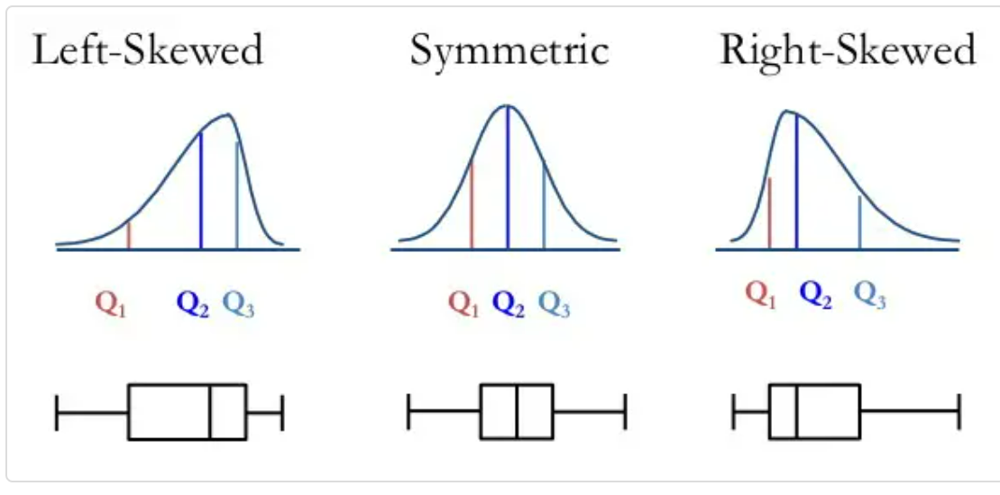

Box plots visually show the distribution of numerical data and skewness through displaying the data quartiles (or percentiles) and averages.

1. When the median is closer to the bottom of the box, and if the whisker is shorter on the lower end of the box, then the distribution is positively skewed (skewed right).

2. When the median is closer to the top of the box, and if the whisker is shorter on the upper end of the box, then the distribution is negatively skewed (skewed left).

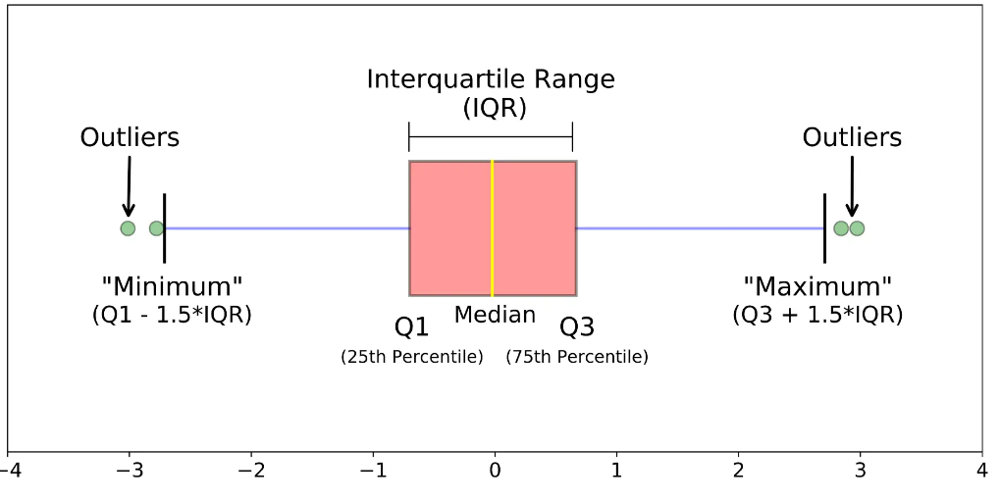

1. If the skewness is between -0.5 and 0.5, the data is fairly symmetrical. If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed. If the skewness is less than -1 or greater than 1, the data are highly skewed.

2. When the value of the skewness is negative, the tail of the distribution is longer towards the left hand side of the curve. and vice-versa

### Univariate/Bivariate distributions

In [661]:
def plot_comparison(data, col, title):
    fig, ax = plt.subplots(3, 1, sharex=True, figsize=[18,18])
    sns.histplot(data=train_df, x=col, kde=True, ax=ax[0], color = 'cornflowerblue')
    ax[0].set_title('Histogram + KDE')
    sns.boxenplot(x=col, ax=ax[1], color = 'cornflowerblue')
    ax[1].set_title('Boxplot')
    sns.violinplot(x=col, saturation=1, ax=ax[2], color = 'cornflowerblue', bw=.15, cut=0)
    ax[2].set_title('Violin plot')
    fig.suptitle(title, fontsize=16)
    plt.show()

Age
Skew : -0.07
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


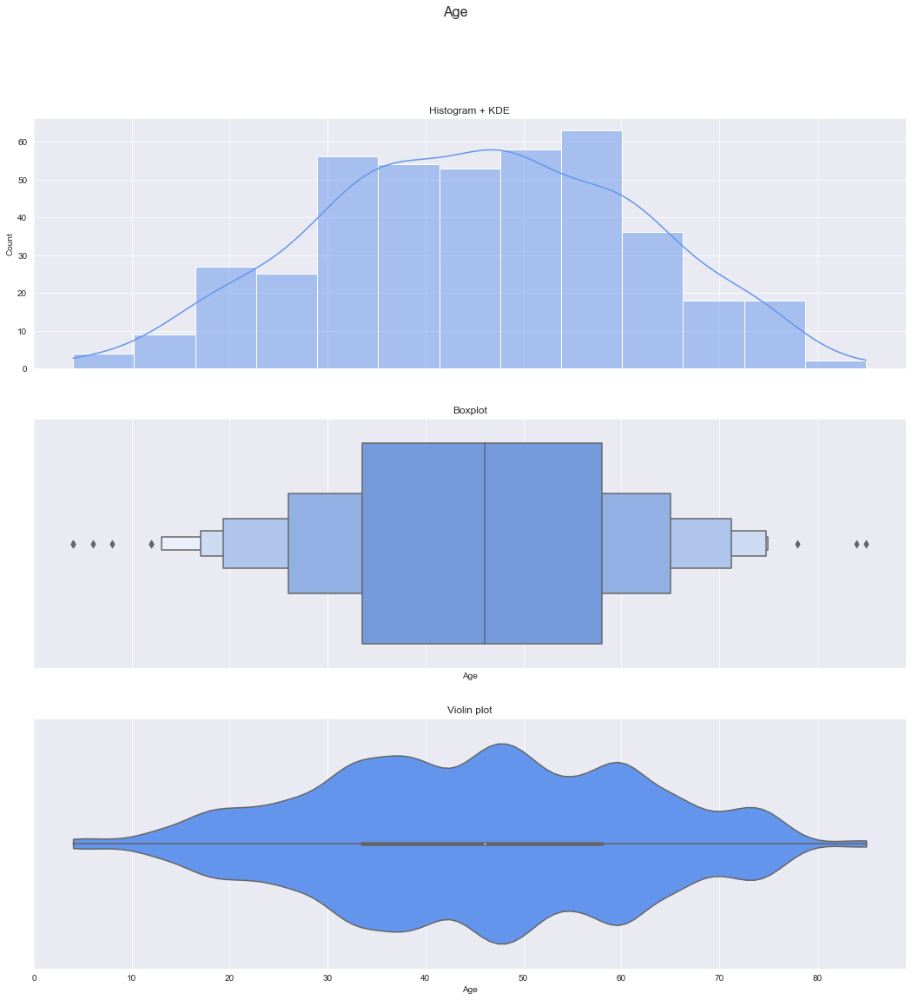

Total_Bilirubin
Skew : 5.16
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


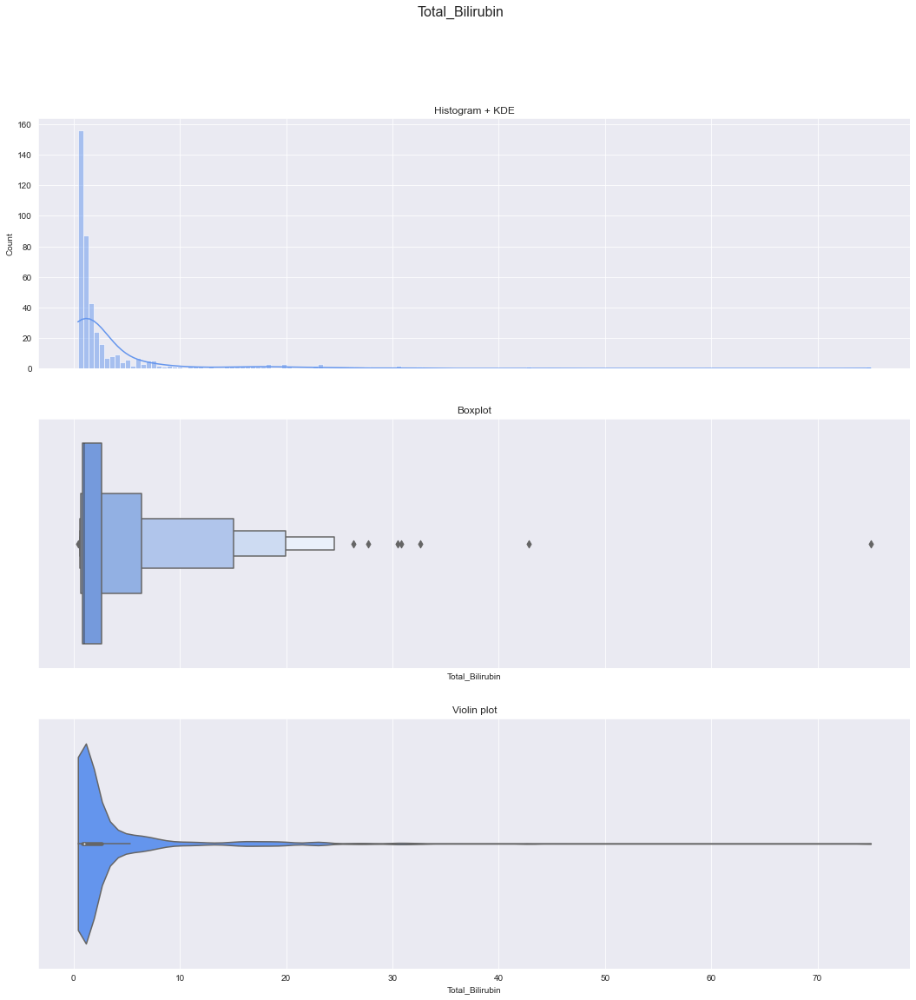

Direct_Bilirubin
Skew : 3.26
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


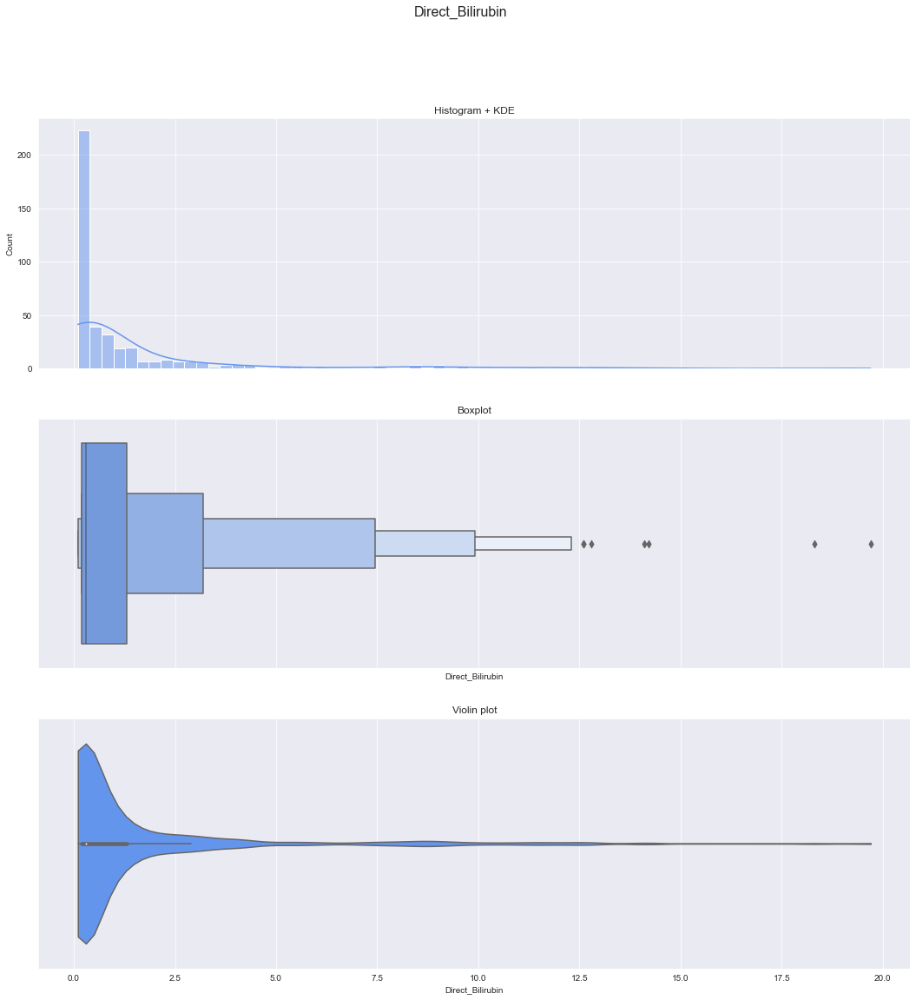

Alkaline_Phosphotase
Skew : 3.85
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


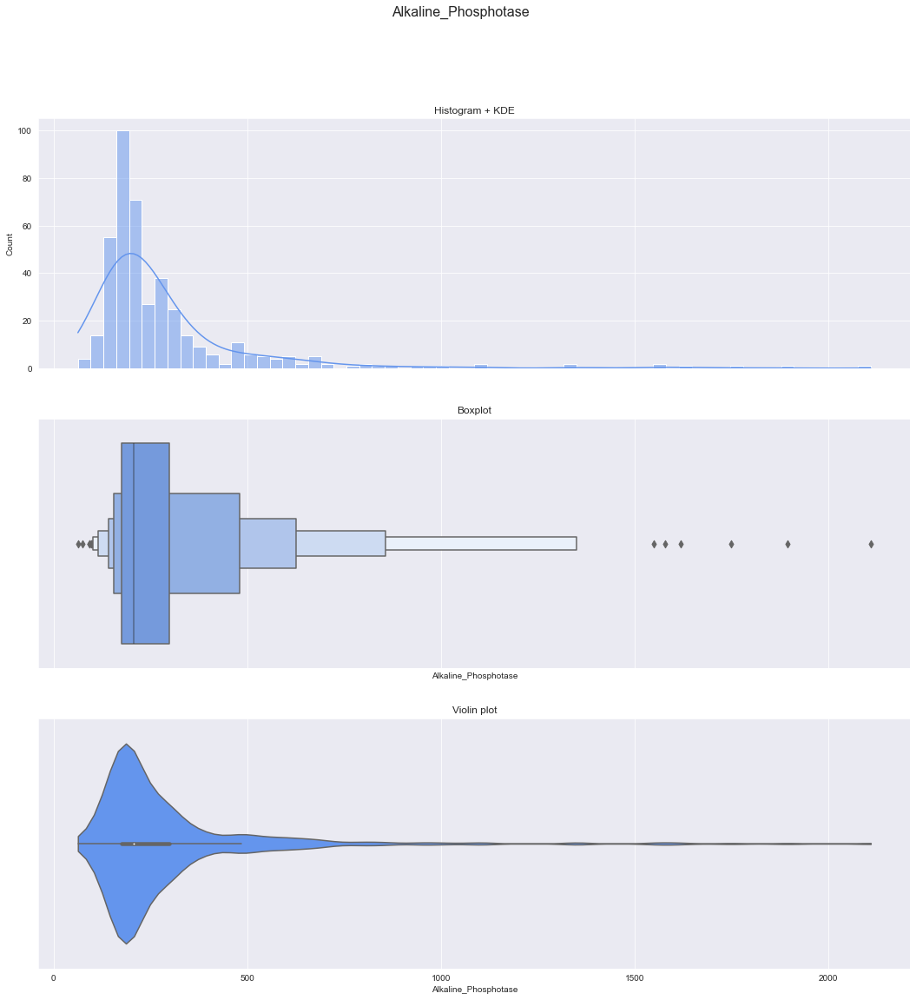

Alamine_Aminotransferase
Skew : 6.17
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


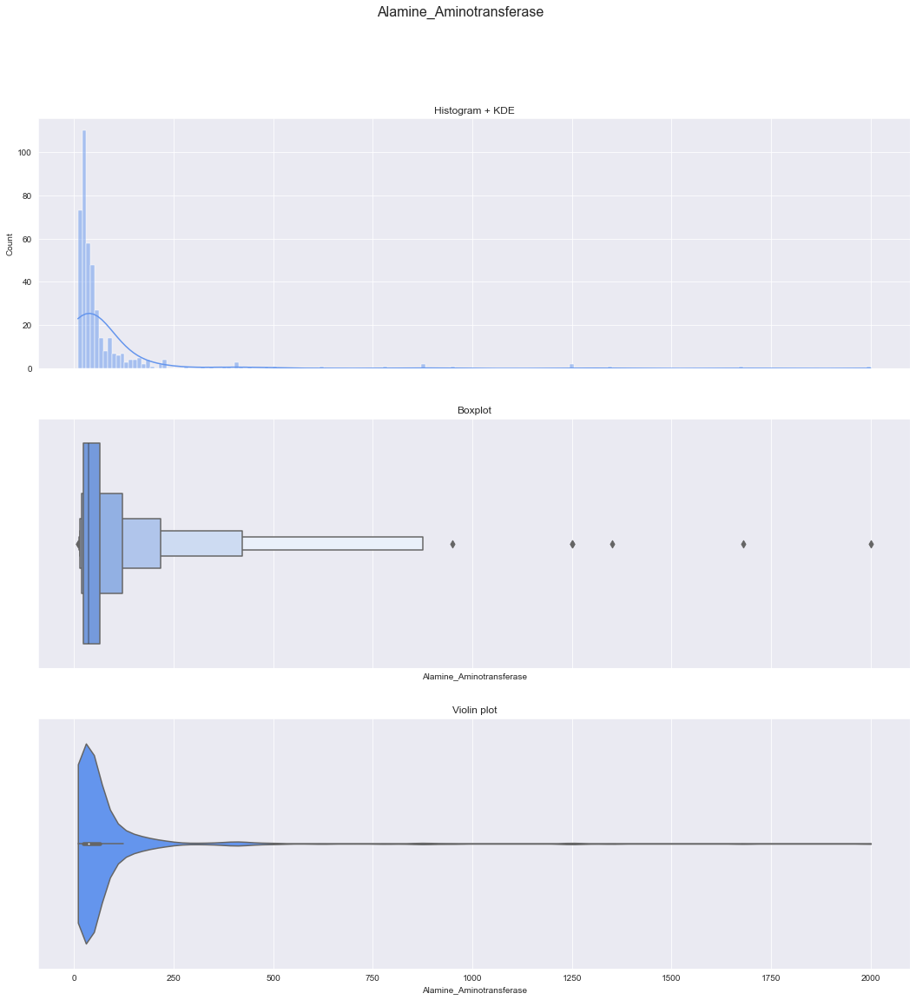

Aspartate_Aminotransferase
Skew : 9.79
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


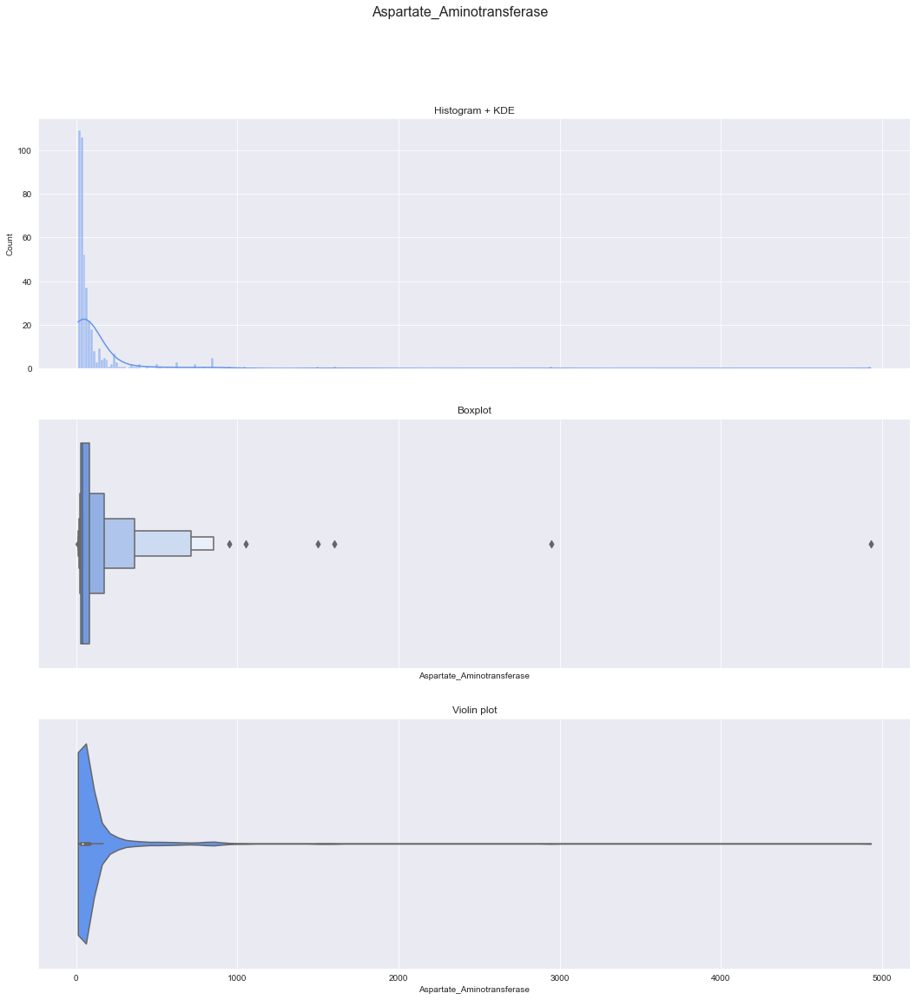

Total_Protiens
Skew : -0.35
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


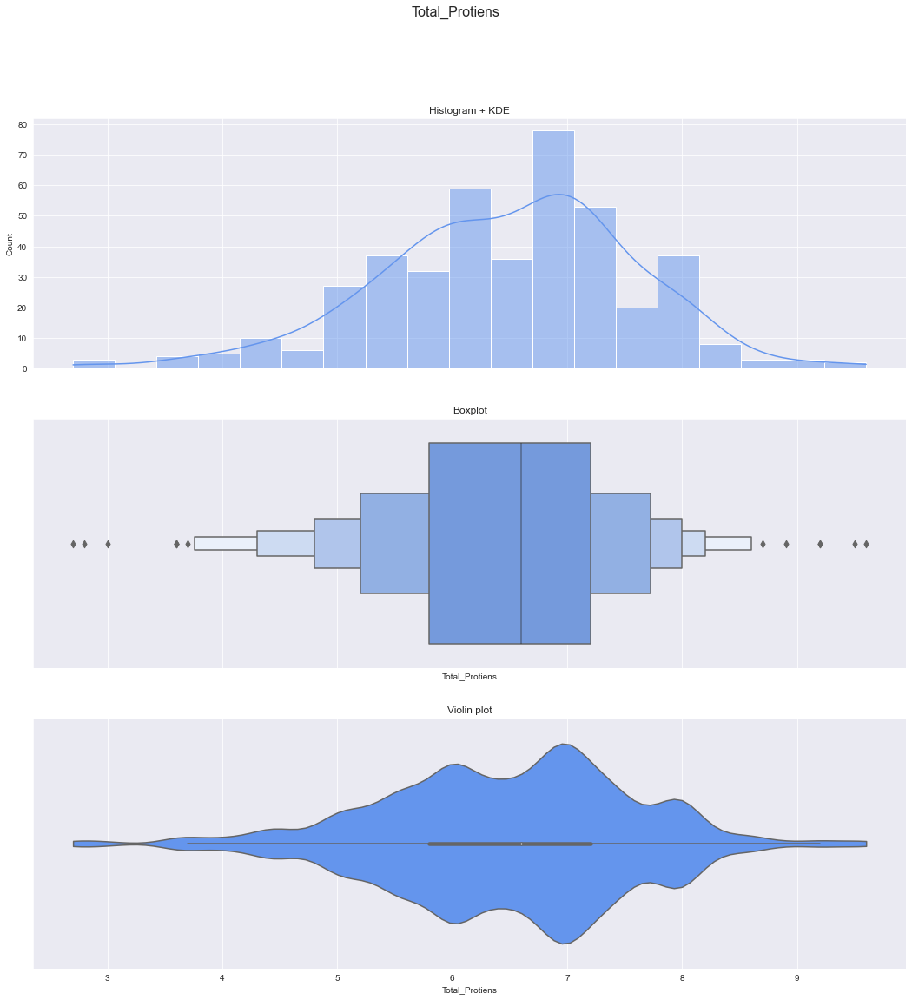

Albumin
Skew : -0.02
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


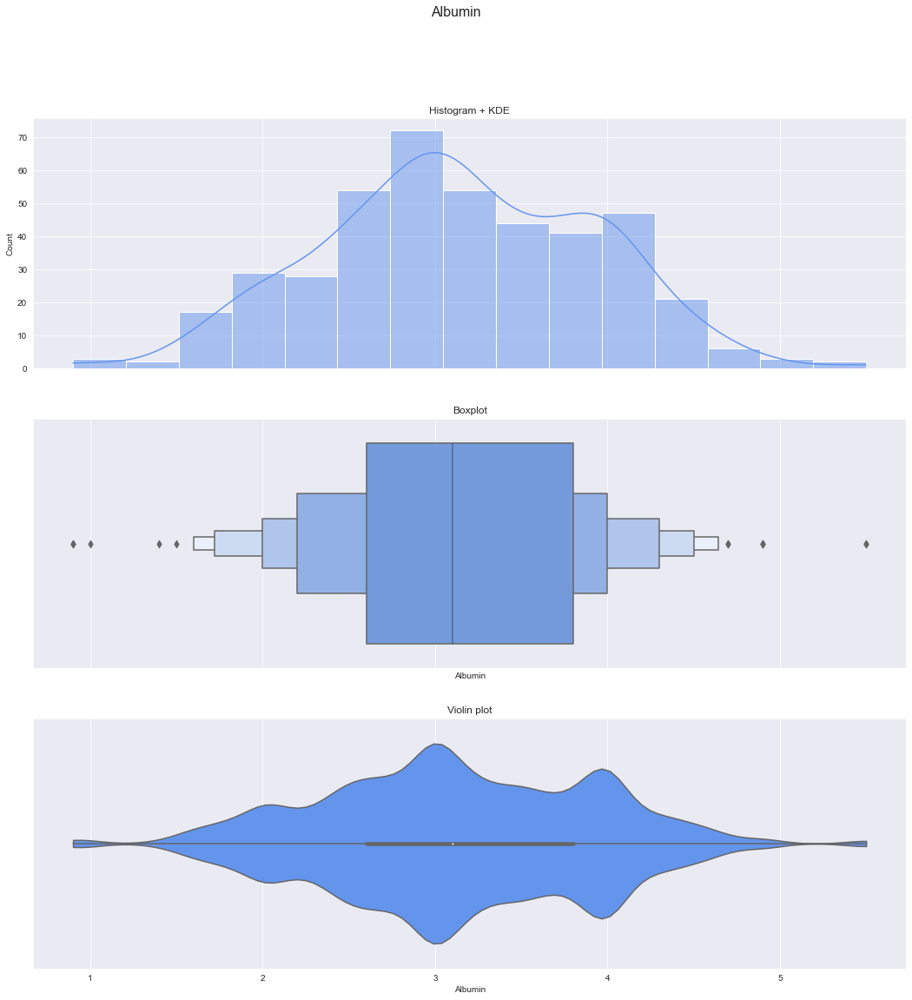

Albumin_and_Globulin_Ratio
Skew : 0.42
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 3
% of nulls : 0.71


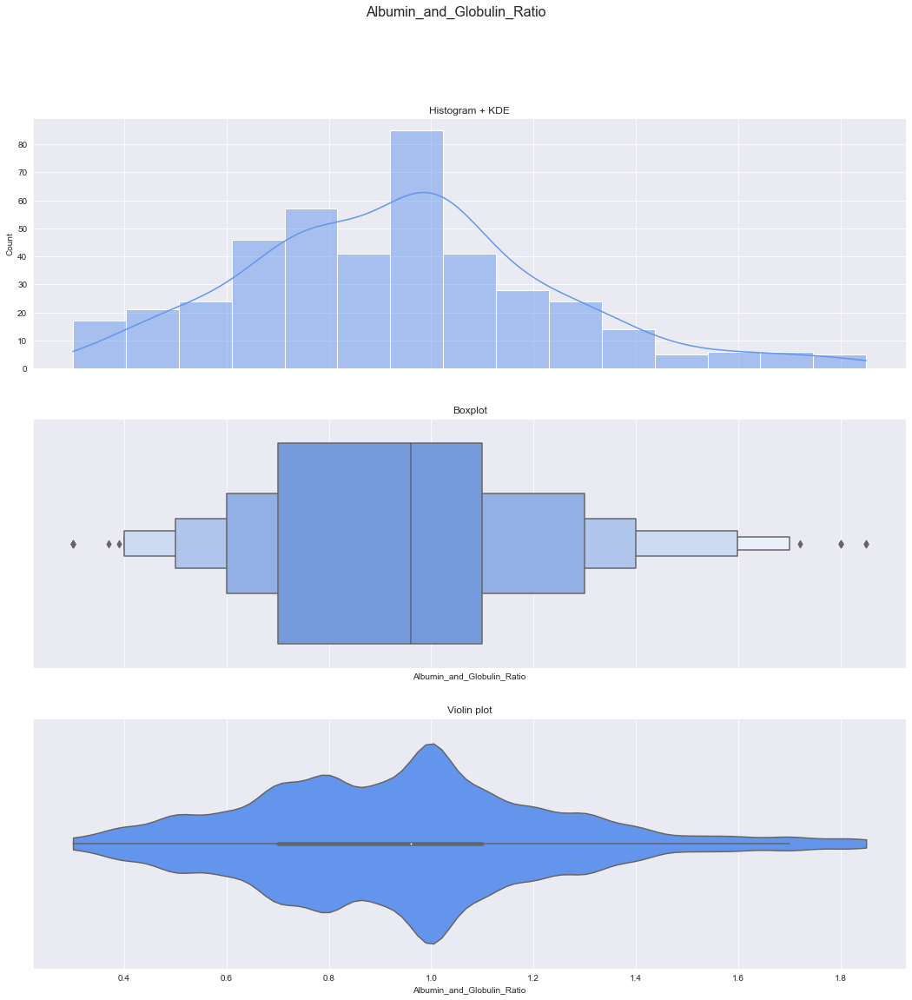

In [662]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

Age
no.of nulls : 0
% of nulls : 0.0
Skew : -0.07


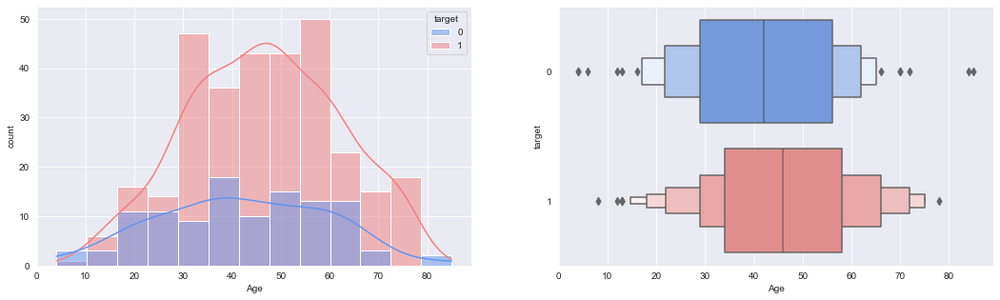

Total_Bilirubin
no.of nulls : 0
% of nulls : 0.0
Skew : 5.16


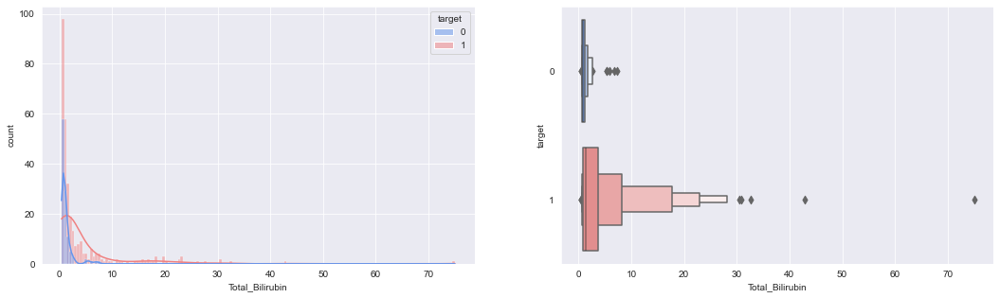

Direct_Bilirubin
no.of nulls : 0
% of nulls : 0.0
Skew : 3.26


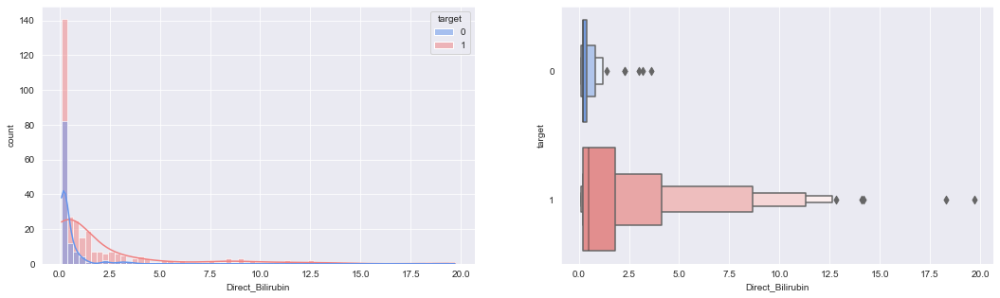

Alkaline_Phosphotase
no.of nulls : 0
% of nulls : 0.0
Skew : 3.85


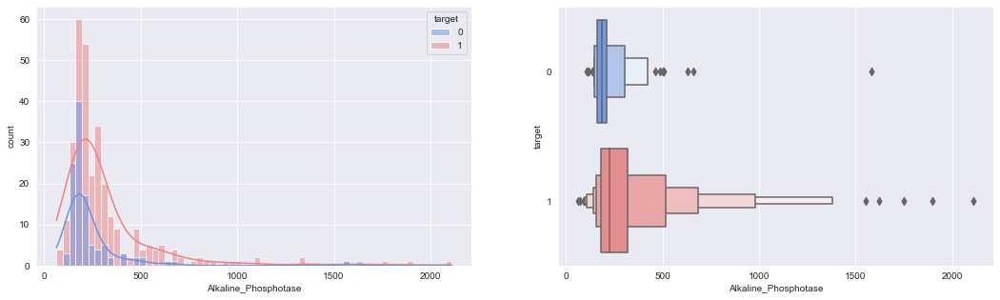

Alamine_Aminotransferase
no.of nulls : 0
% of nulls : 0.0
Skew : 6.17


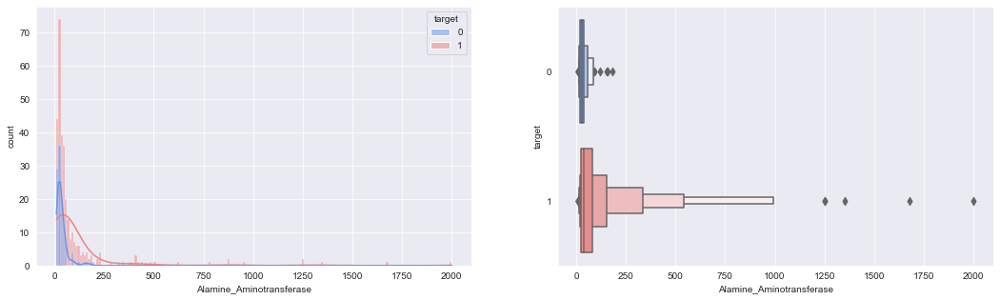

Aspartate_Aminotransferase
no.of nulls : 0
% of nulls : 0.0
Skew : 9.79


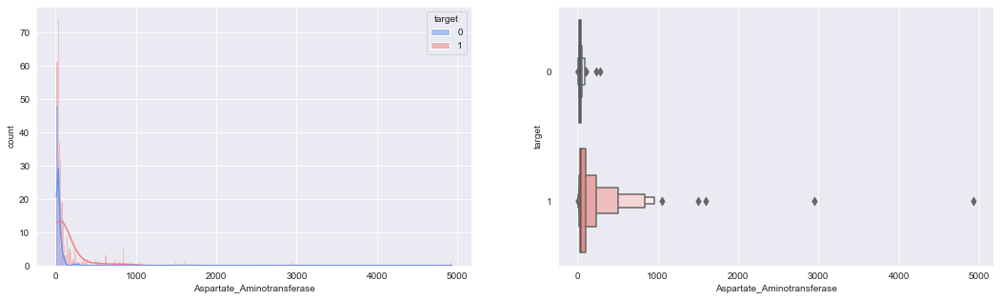

Total_Protiens
no.of nulls : 0
% of nulls : 0.0
Skew : -0.35


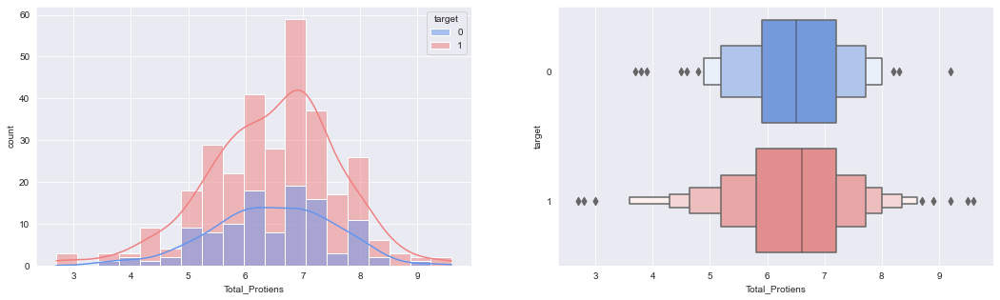

Albumin
no.of nulls : 0
% of nulls : 0.0
Skew : -0.02


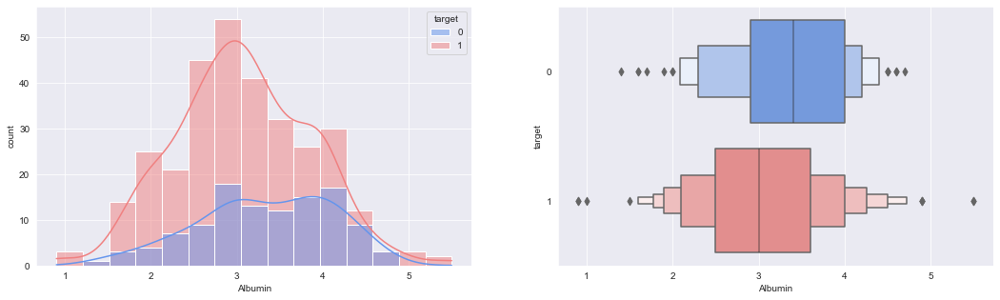

Albumin_and_Globulin_Ratio
no.of nulls : 3
% of nulls : 0.71
Skew : 0.42


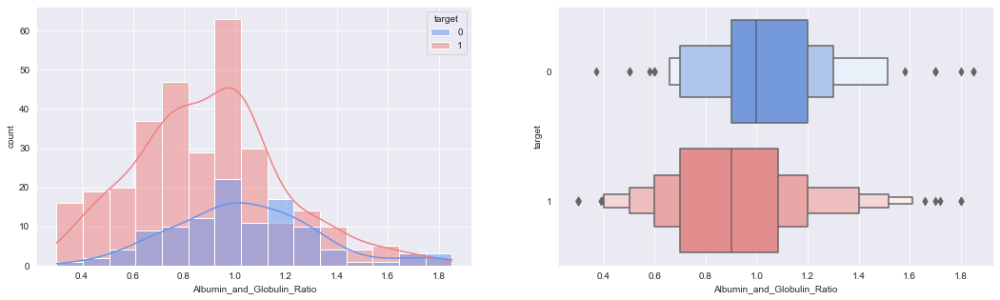

In [663]:
for col in continuous_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxenplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'])
    plt.show()

Age
Skew : -0.07


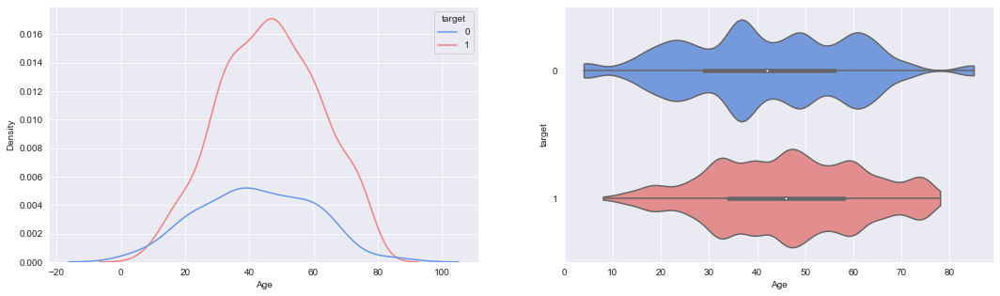

Total_Bilirubin
Skew : 5.16


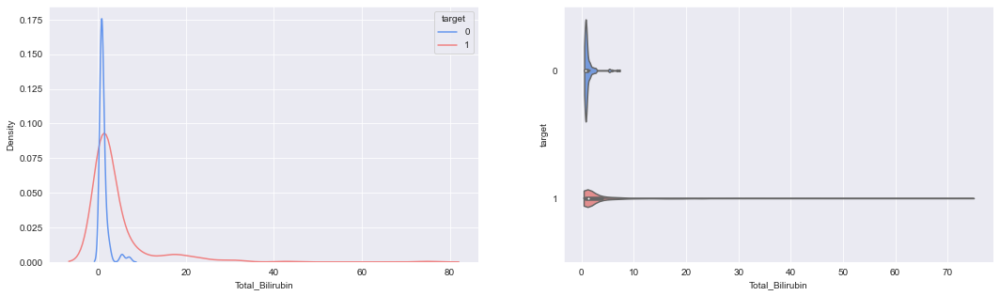

Direct_Bilirubin
Skew : 3.26


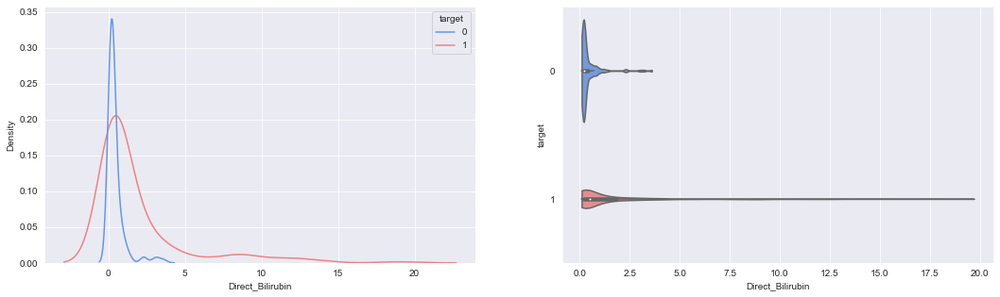

Alkaline_Phosphotase
Skew : 3.85


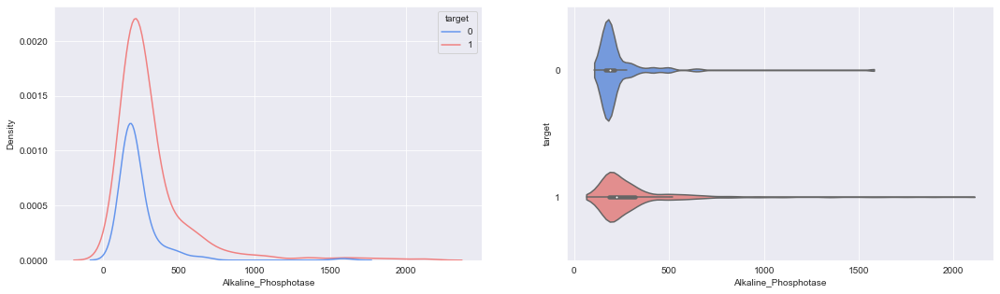

Alamine_Aminotransferase
Skew : 6.17


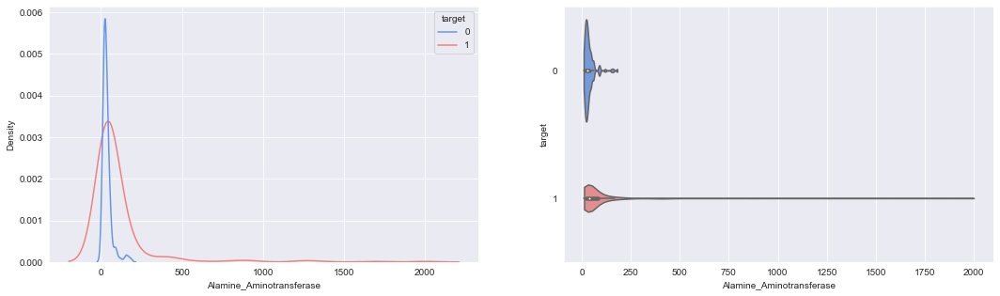

Aspartate_Aminotransferase
Skew : 9.79


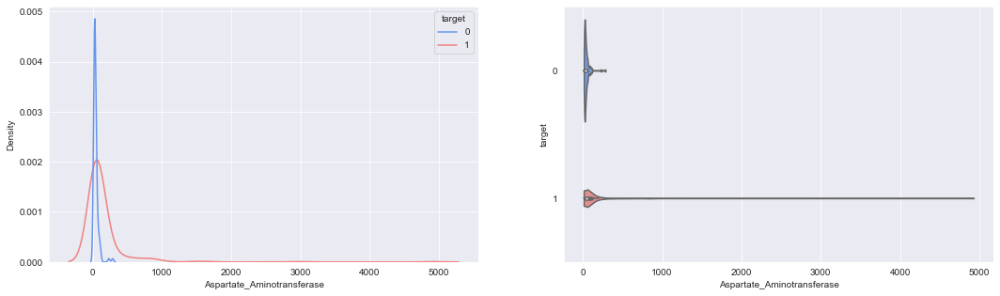

Total_Protiens
Skew : -0.35


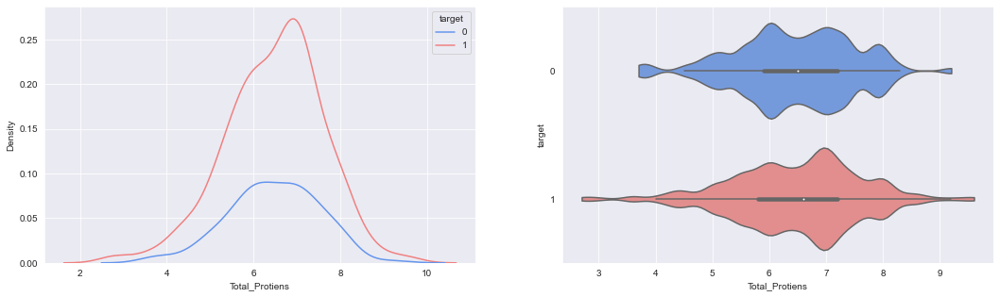

Albumin
Skew : -0.02


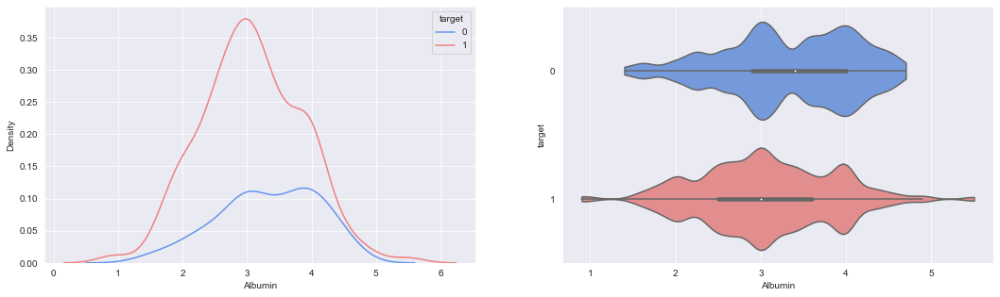

Albumin_and_Globulin_Ratio
Skew : 0.42


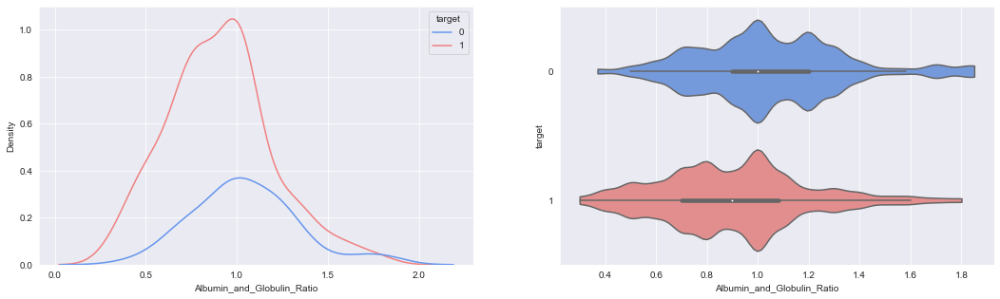

In [664]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.kdeplot(data=train_df, x=col,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.subplot(1, 2, 2)
    #sns.violinplot(x=train_df[col],saturation=1)
    sns.violinplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'], bw=.15,cut=0)
    plt.show()

#### If you want to check whether feature is guassian or normal distributed
#### Q-Q plot

In [665]:
import scipy.stats as stat
import pylab 

Age
Skew : -0.07
0.006801422649800015


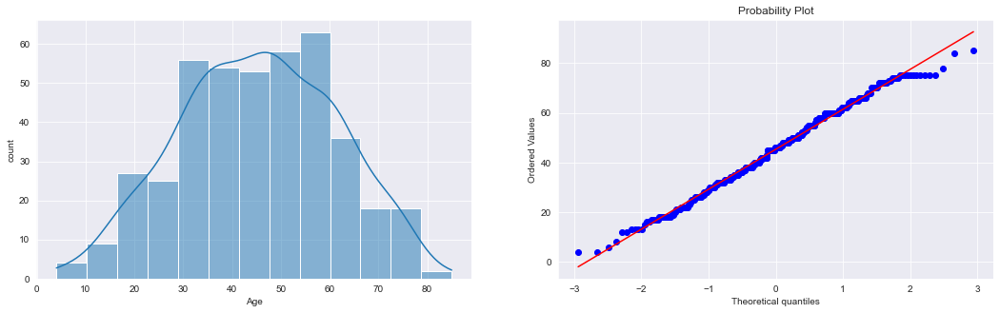

Total_Bilirubin
Skew : 5.16
1.7798830160791214e-104


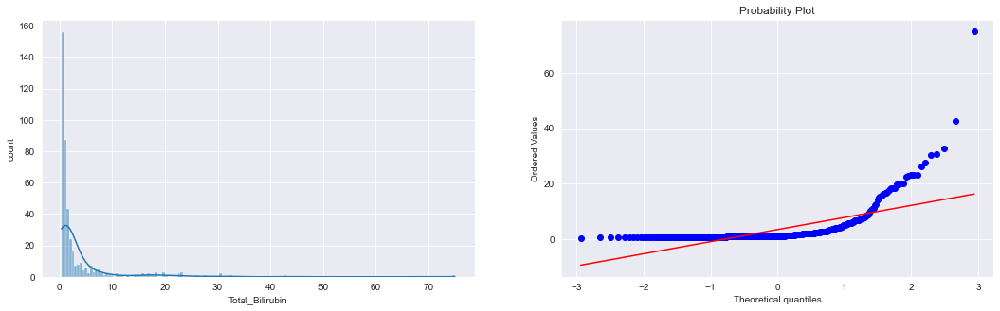

Direct_Bilirubin
Skew : 3.26
1.8974231476061013e-68


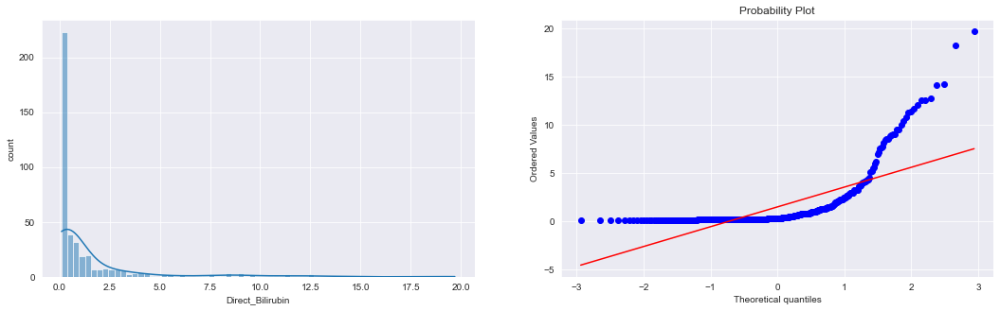

Alkaline_Phosphotase
Skew : 3.85
3.6576822641039216e-81


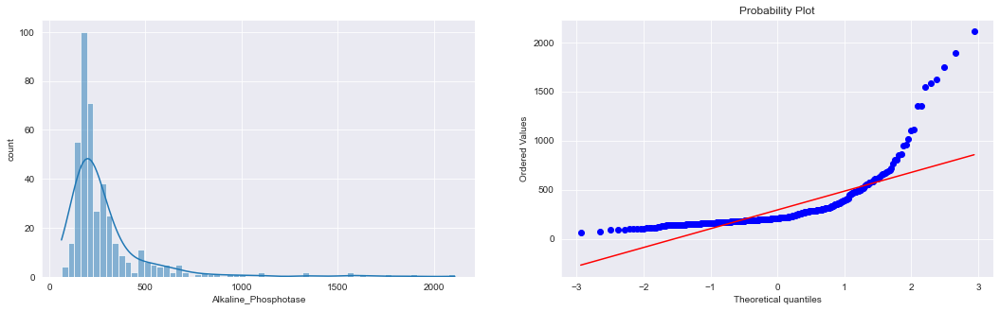

Alamine_Aminotransferase
Skew : 6.17
7.264951228502228e-116


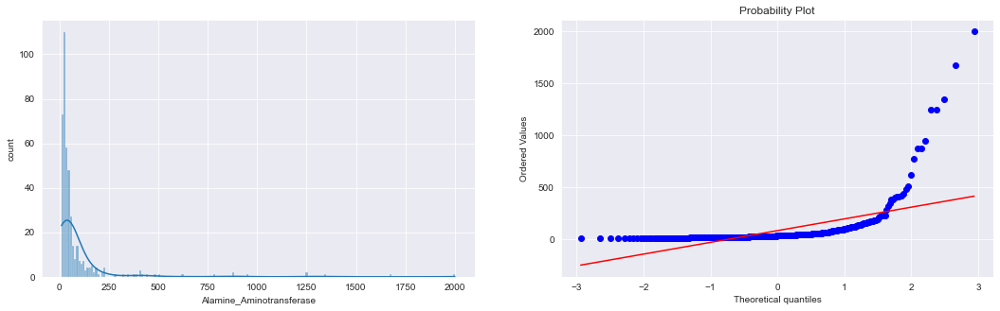

Aspartate_Aminotransferase
Skew : 9.79
4.317402708465218e-155


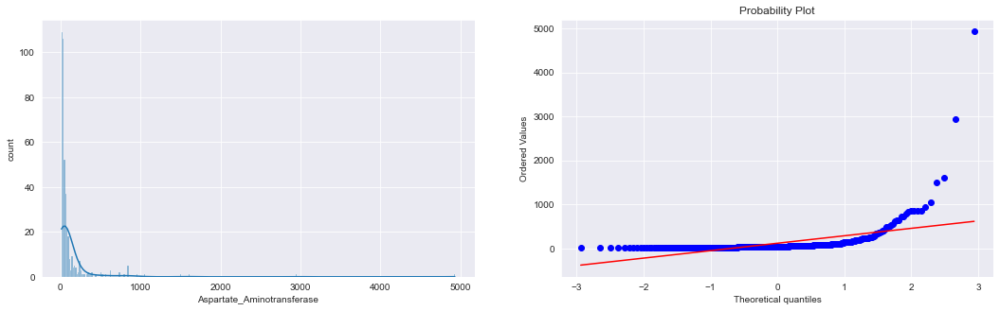

Total_Protiens
Skew : -0.35
0.0029669907055533155


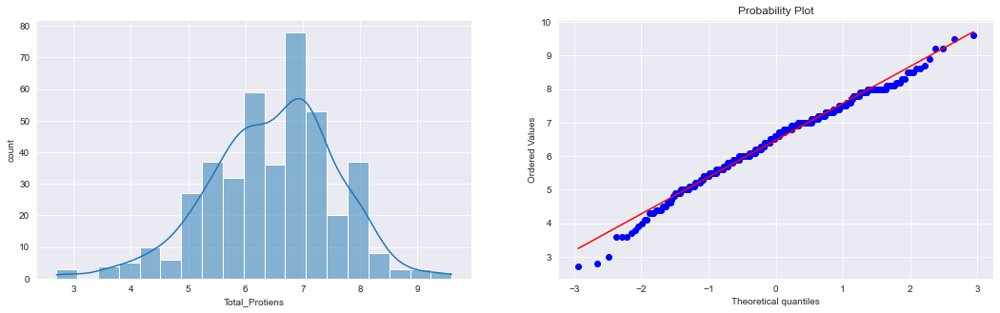

Albumin
Skew : -0.02
0.5450414367773975


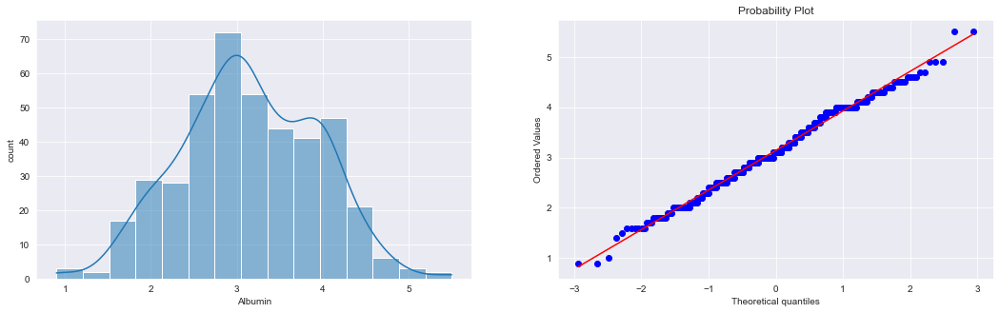

Albumin_and_Globulin_Ratio
Skew : 0.42
nan


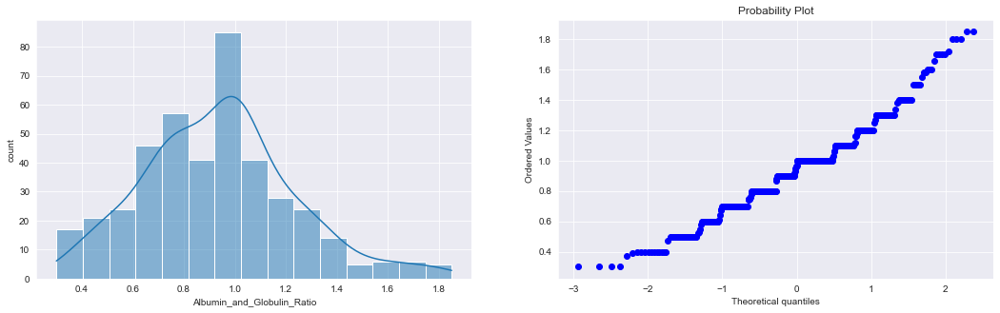

In [666]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    _, p = stat.normaltest(train_df[col].to_numpy())
    print(p)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    stat.probplot(train_df[col],dist='norm',plot=pylab)
    plt.show()

### Observations :

1. From above we can see the continuous features distributions.

In [667]:
train_df.columns

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'target'],
      dtype='object')

### Visualizing bivariate/multivariate distributions

Text(0, 0.5, 'No.of Liver disease people')

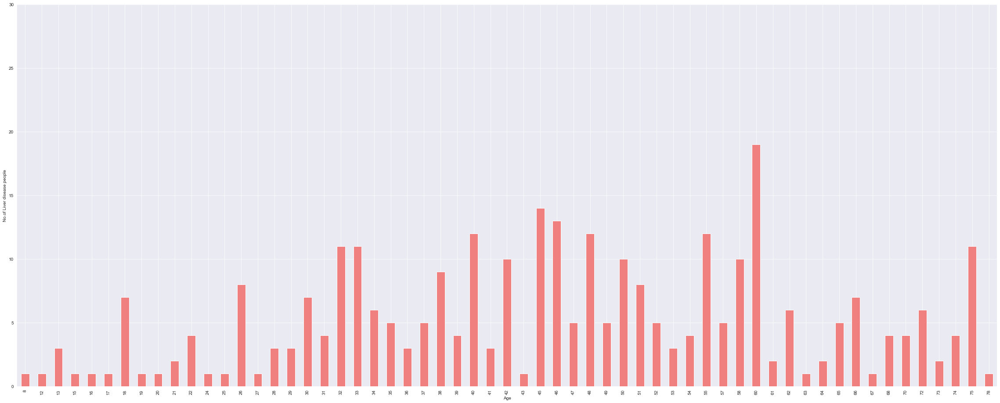

In [668]:
plt.figure(figsize = (40,16))
train_df.loc[train_df['target']==1]['Age'].value_counts().sort_index().plot.bar(color = 'lightcoral')

plt.ylim(0, 30)

plt.xlabel('Age')
plt.ylabel('No.of Liver disease people')

# Double click on the plot/graph to zoom in/zoom out

Text(0, 0.5, 'No.of Healthy people')

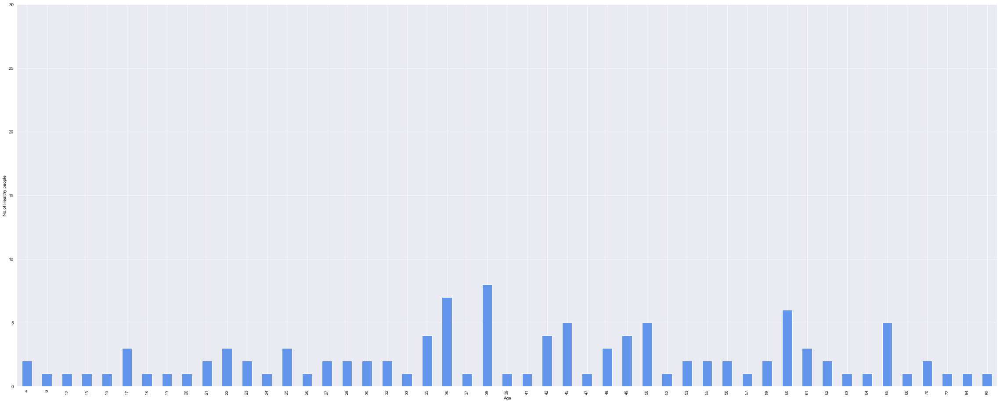

In [669]:
plt.figure(figsize = (40,16))
train_df.loc[train_df['target']==0]['Age'].value_counts().sort_index().plot.bar(color = 'cornflowerblue')

plt.ylim(0, 30)

plt.xlabel('Age')
plt.ylabel('No.of Healthy people')

# Double click on the plot/graph to zoom in

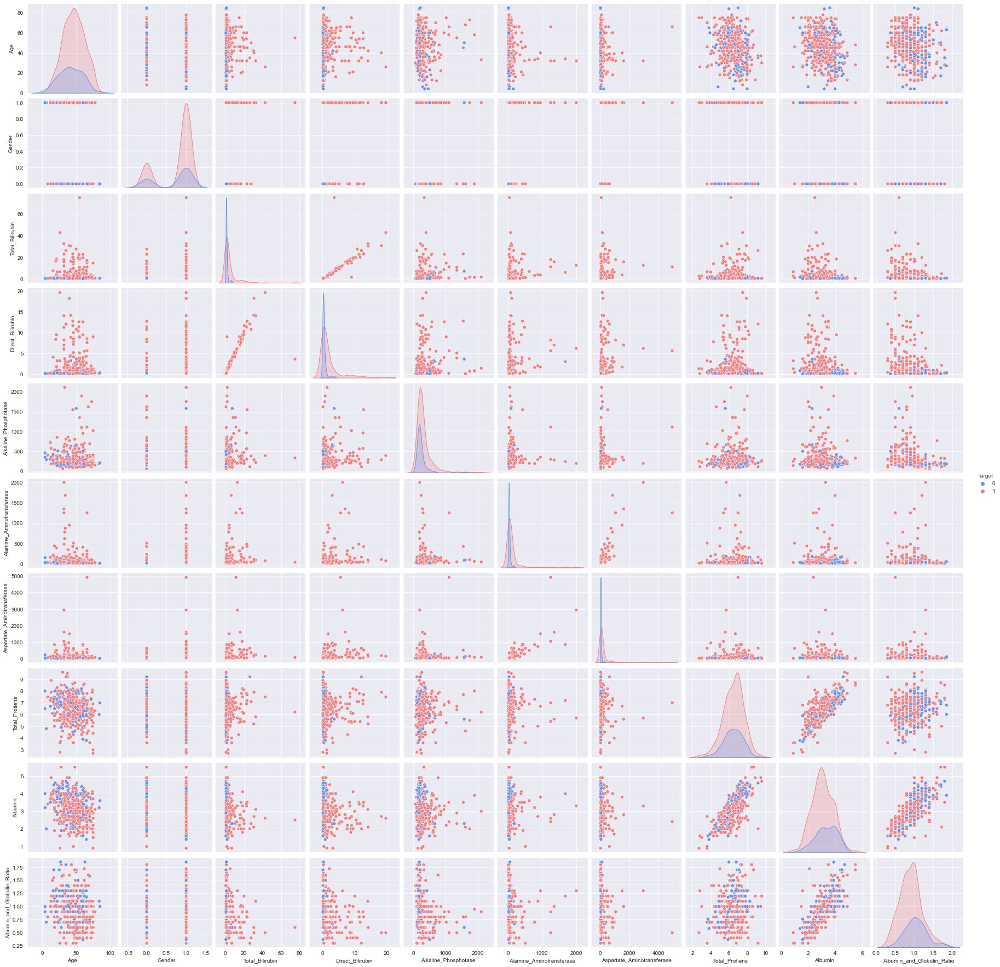

In [670]:
sns.pairplot(train_df, hue='target',palette=['cornflowerblue','lightcoral'])

# Its not clear to observe graphs closely we will plot indvidual plots for some features

In [671]:
continuous_features

['Age',
 'Total_Bilirubin',
 'Direct_Bilirubin',
 'Alkaline_Phosphotase',
 'Alamine_Aminotransferase',
 'Aspartate_Aminotransferase',
 'Total_Protiens',
 'Albumin',
 'Albumin_and_Globulin_Ratio']

Age


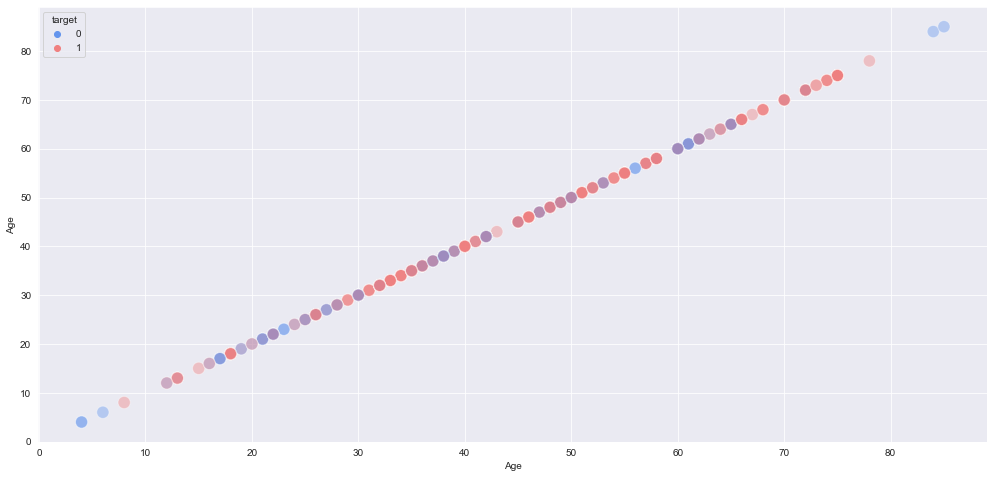

Total_Bilirubin


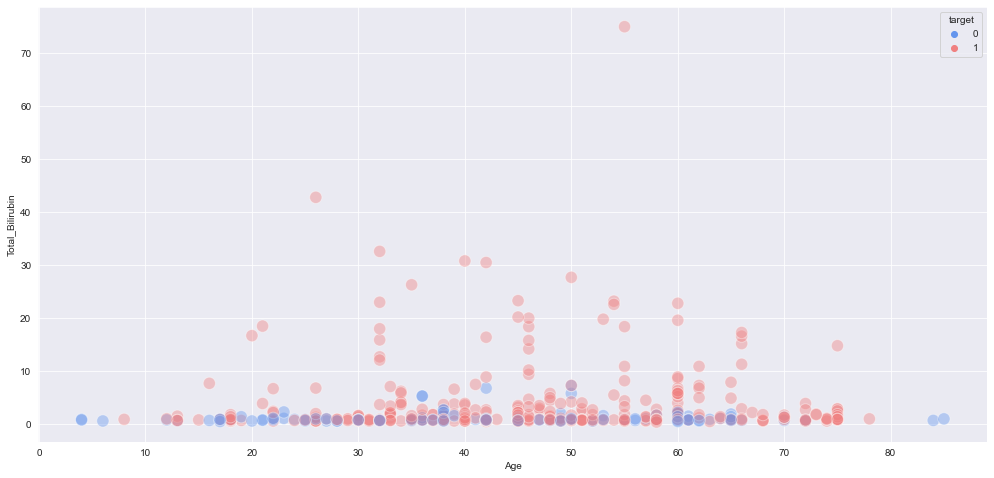

Direct_Bilirubin


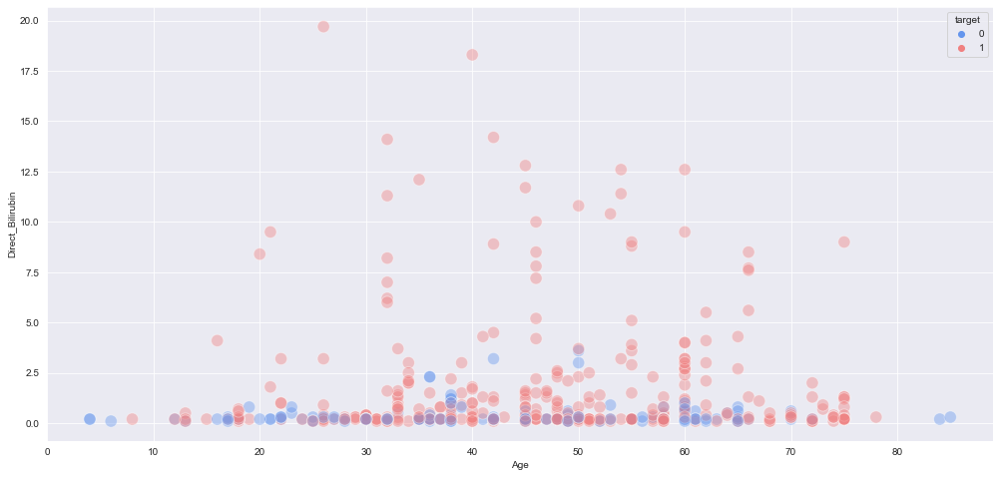

Alkaline_Phosphotase


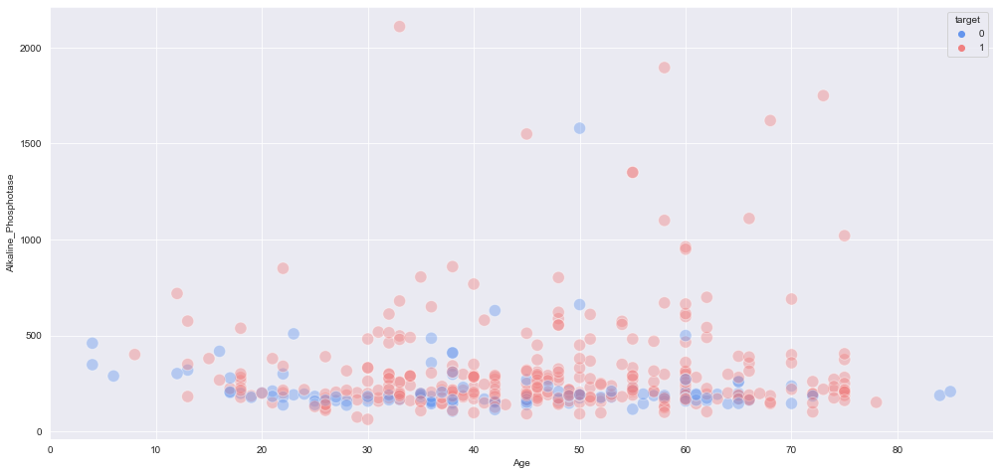

Alamine_Aminotransferase


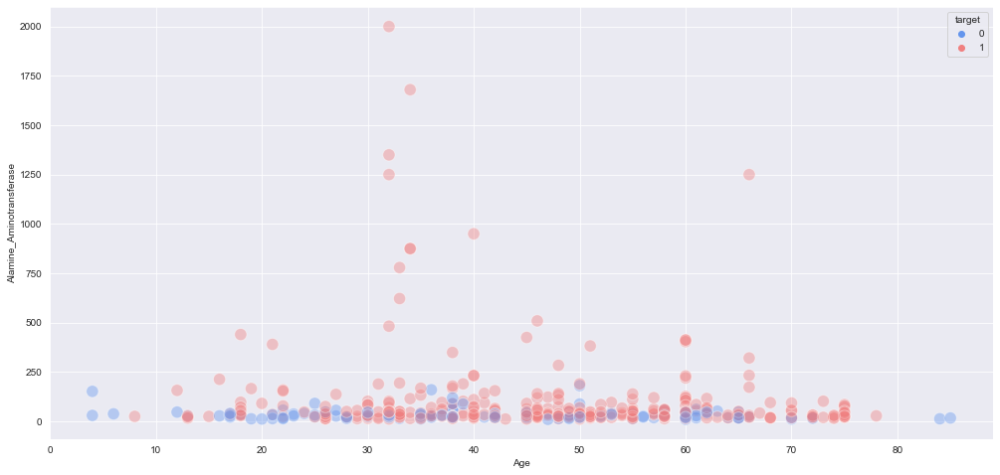

Aspartate_Aminotransferase


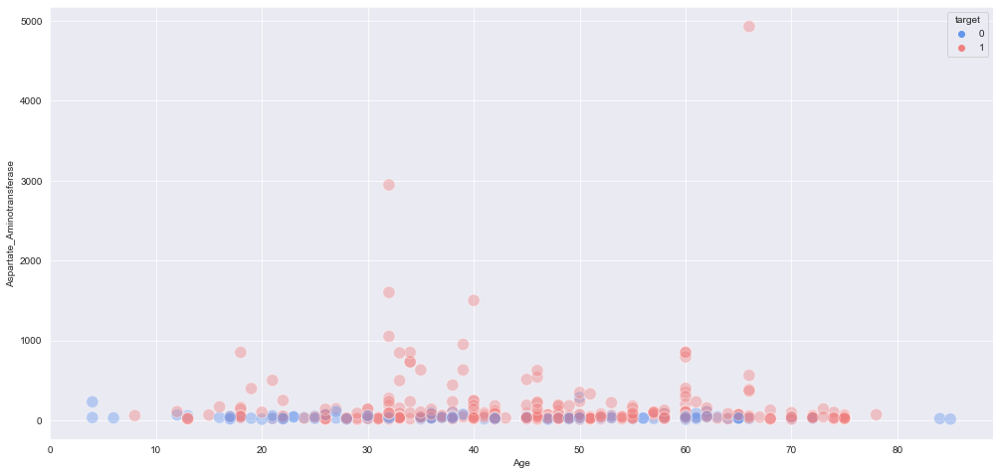

Total_Protiens


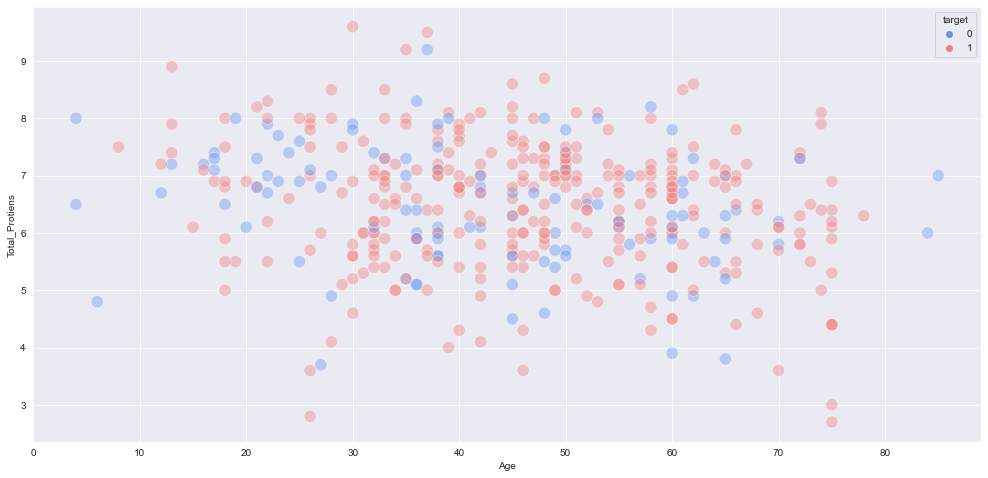

Albumin


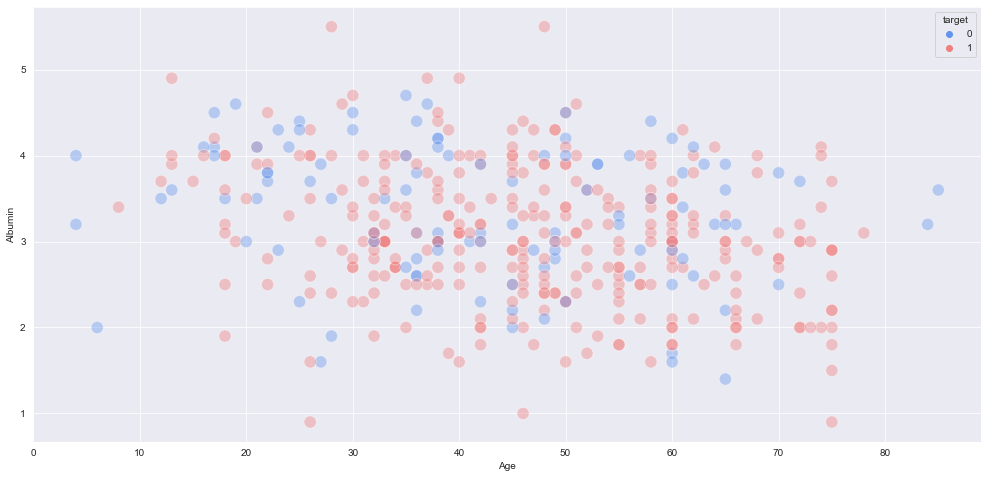

Albumin_and_Globulin_Ratio


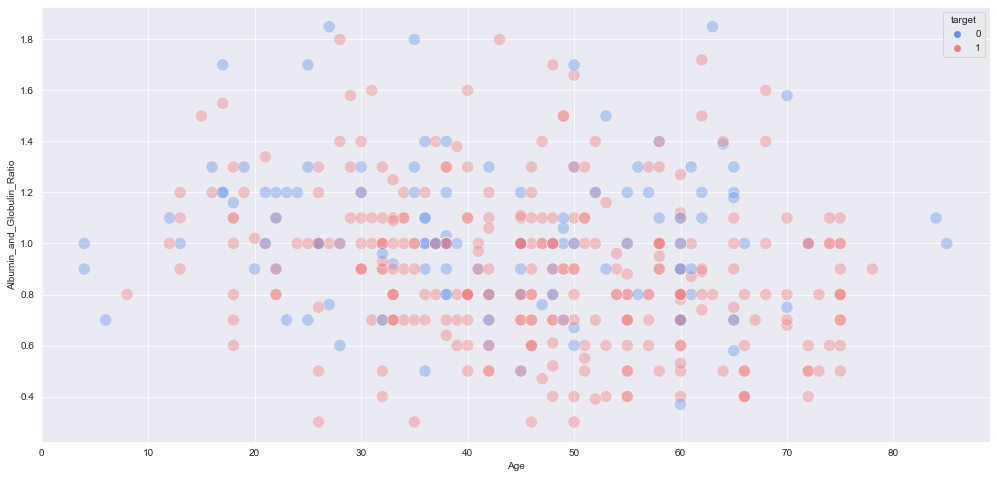

In [672]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Age',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Age')
    plt.ylabel(col)
    plt.show()

Age


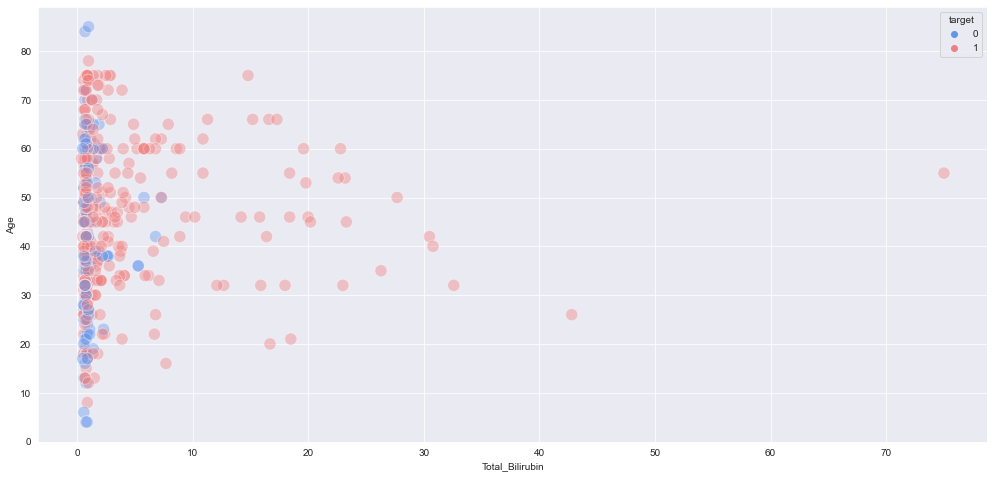

Total_Bilirubin


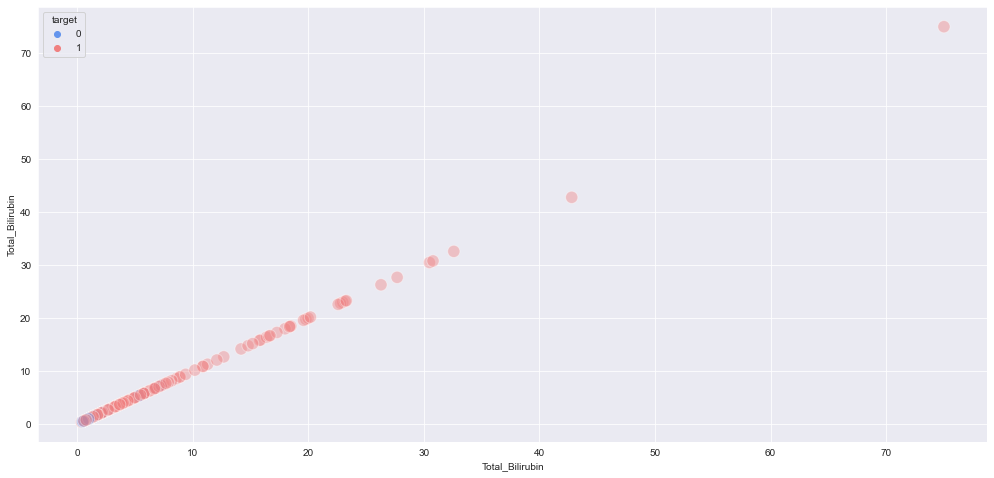

Direct_Bilirubin


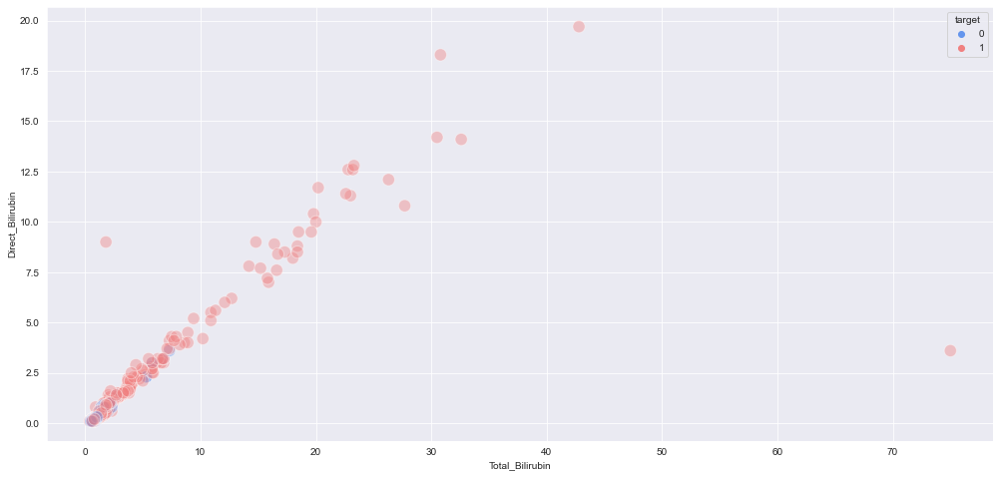

Alkaline_Phosphotase


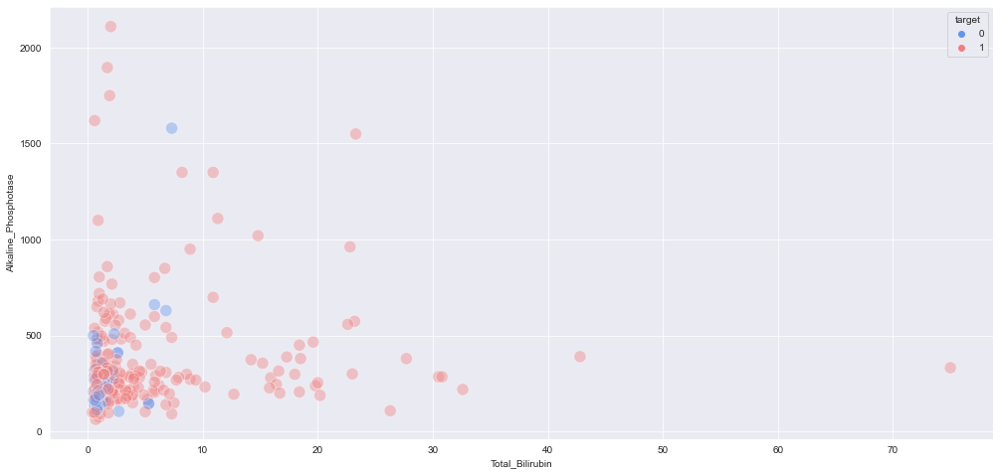

Alamine_Aminotransferase


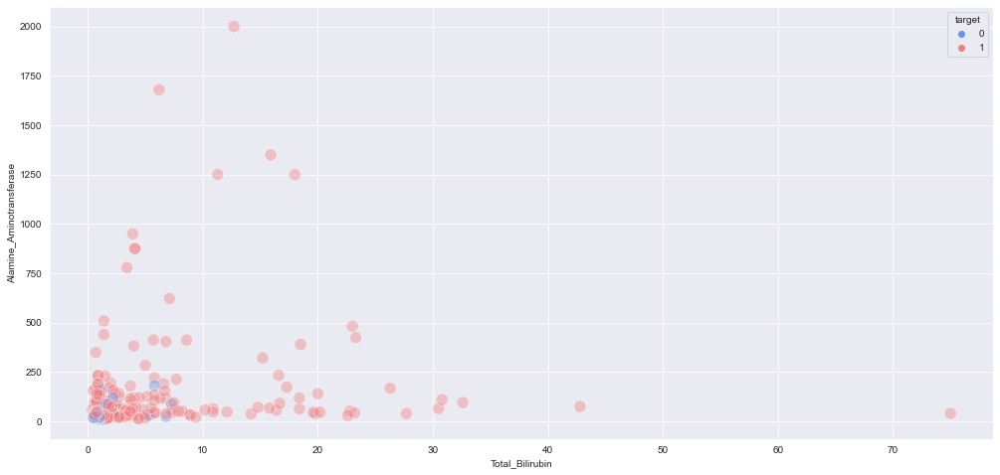

Aspartate_Aminotransferase


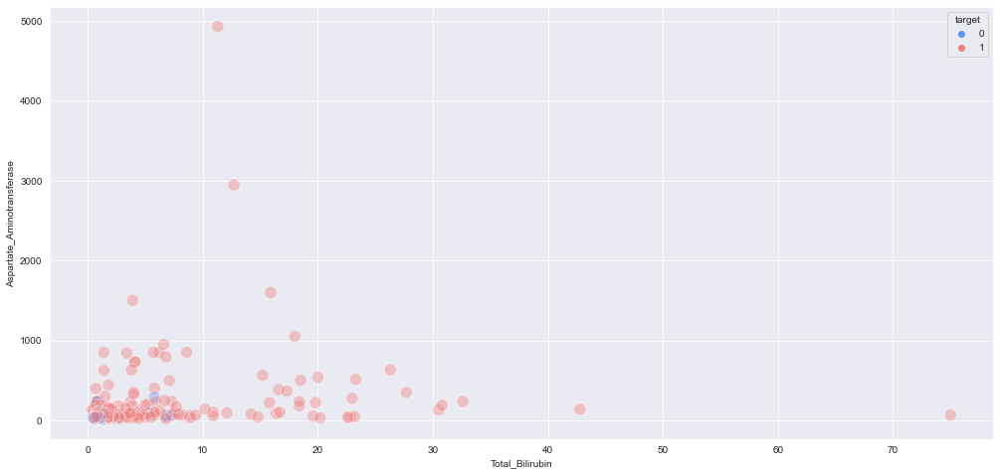

Total_Protiens


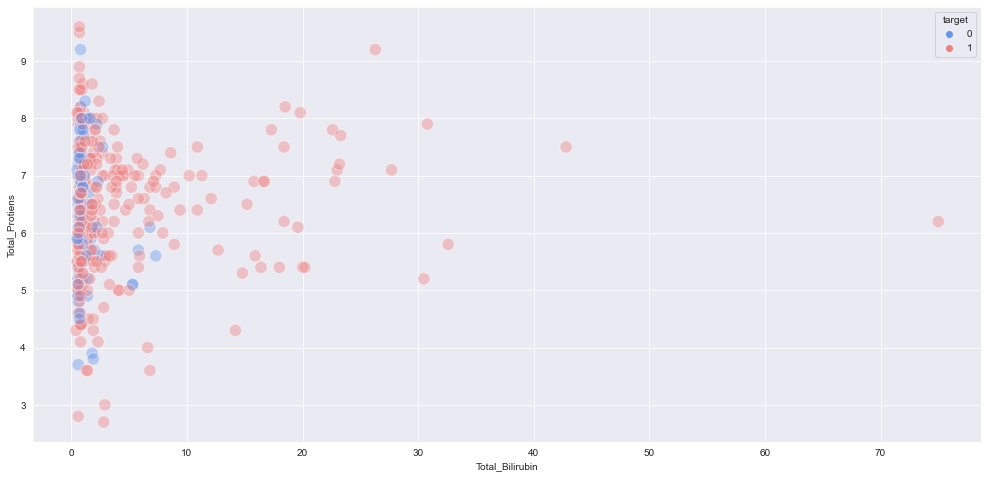

Albumin


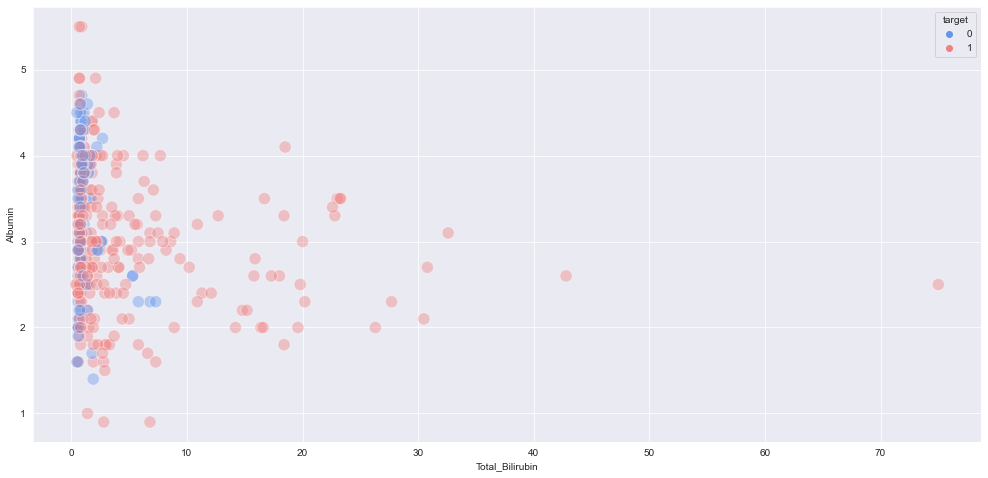

Albumin_and_Globulin_Ratio


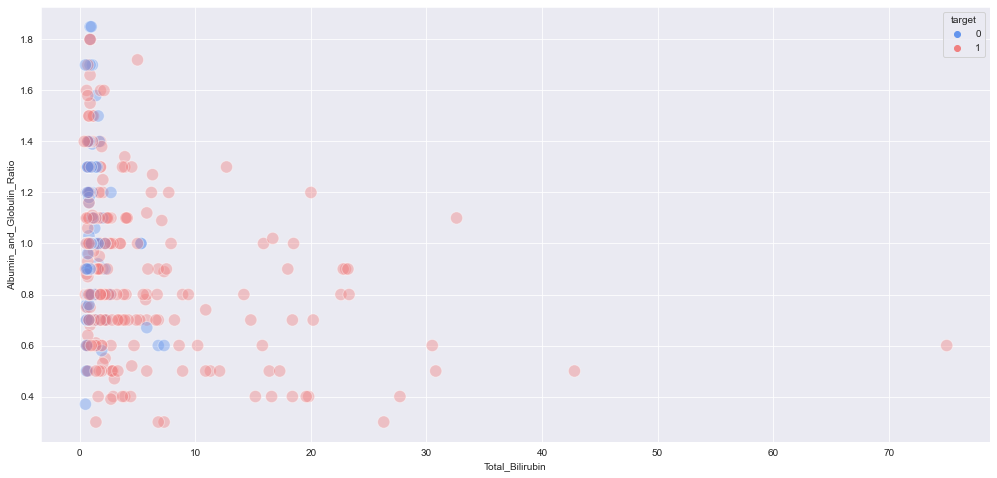

In [673]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Total_Bilirubin',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Total_Bilirubin')
    plt.ylabel(col)
    plt.show()

Age


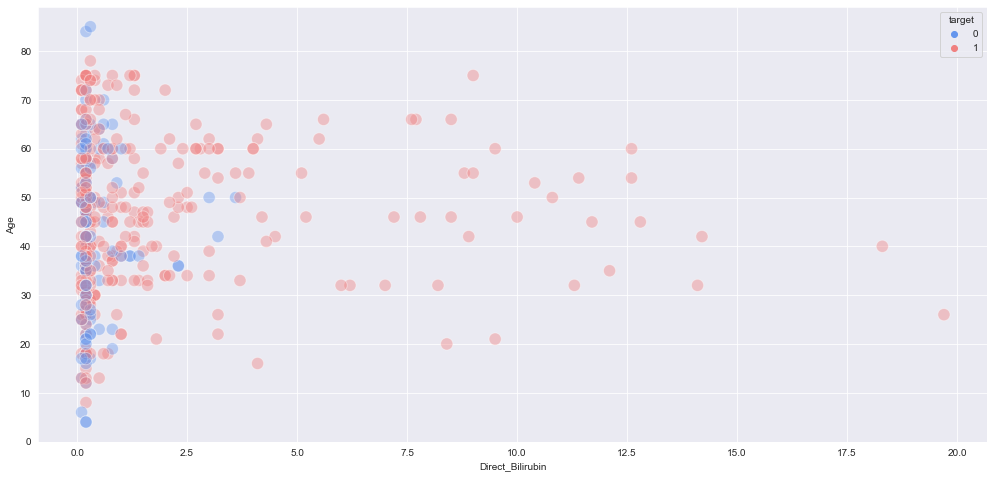

Total_Bilirubin


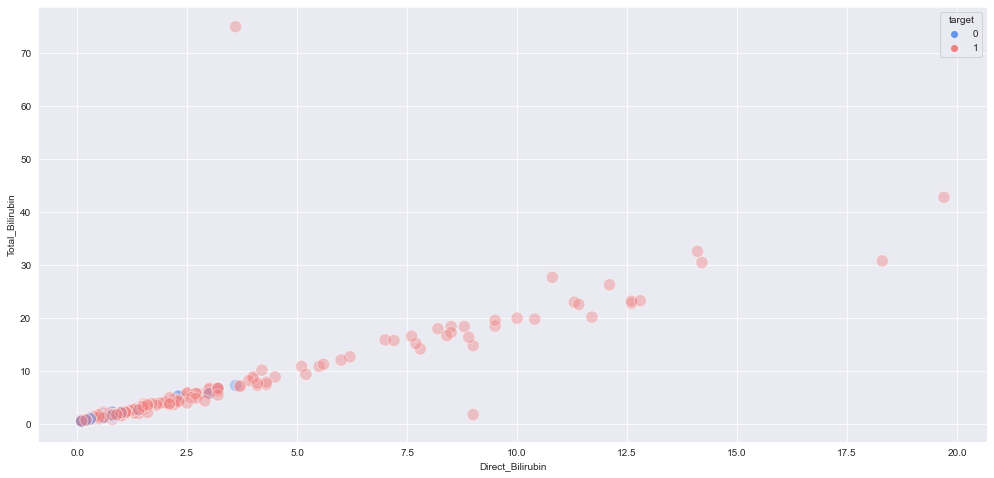

Direct_Bilirubin


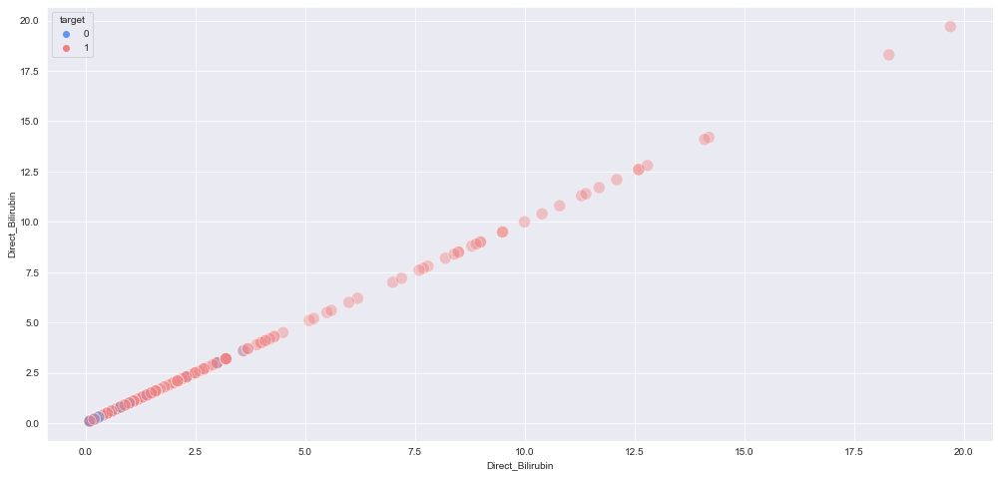

Alkaline_Phosphotase


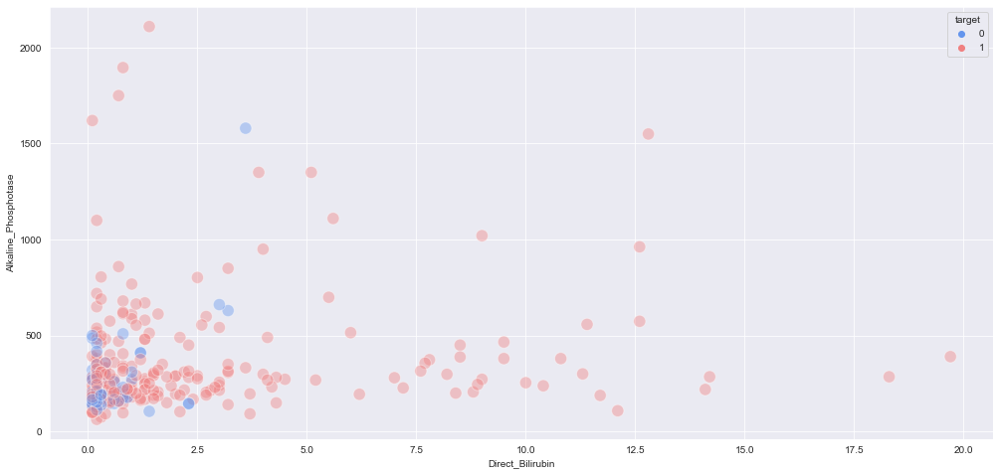

Alamine_Aminotransferase


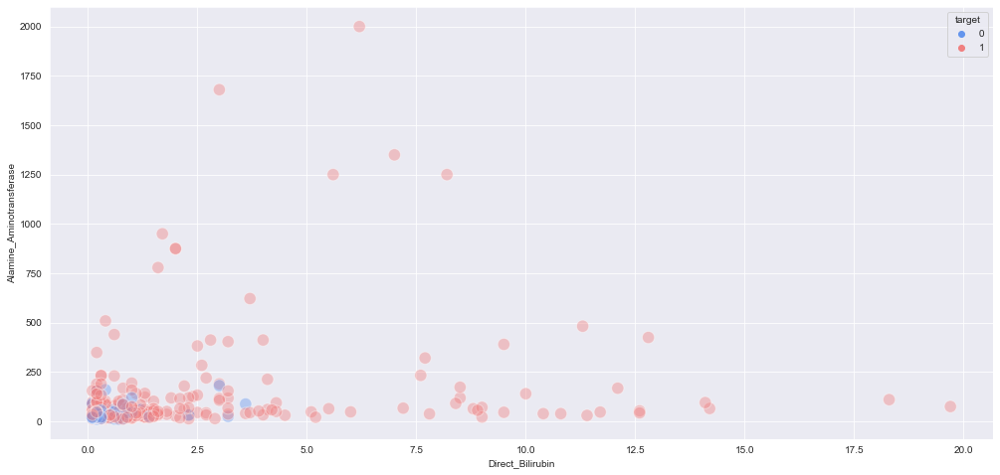

Aspartate_Aminotransferase


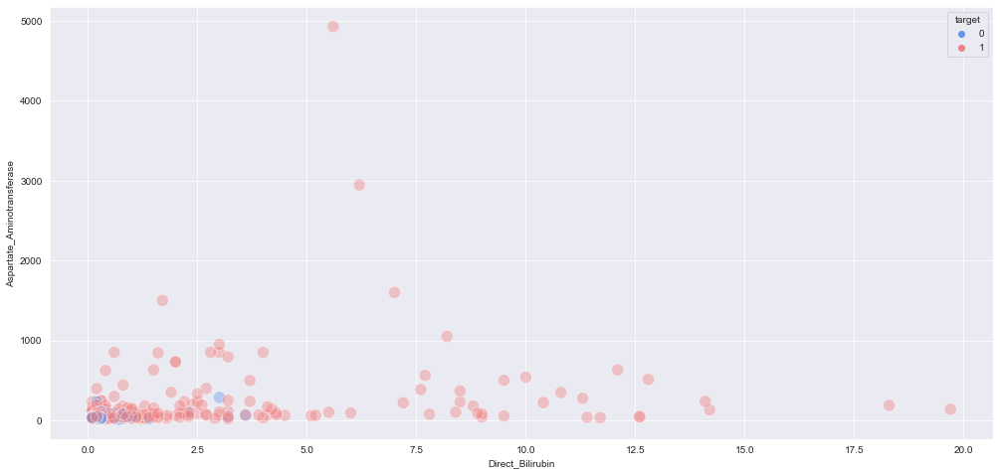

Total_Protiens


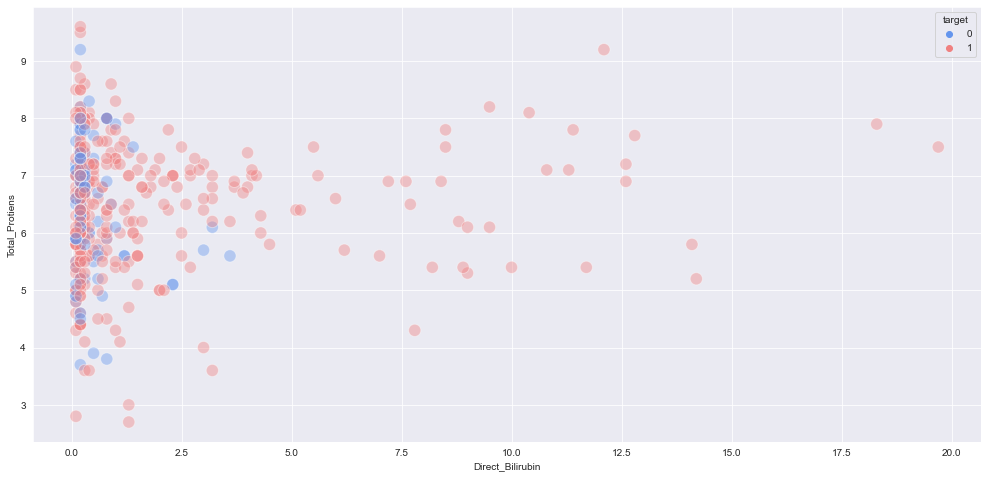

Albumin


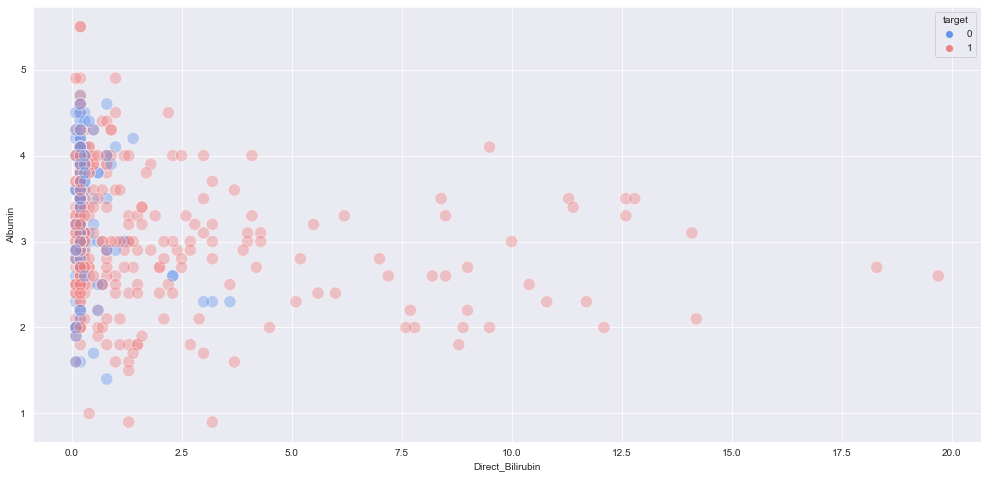

Albumin_and_Globulin_Ratio


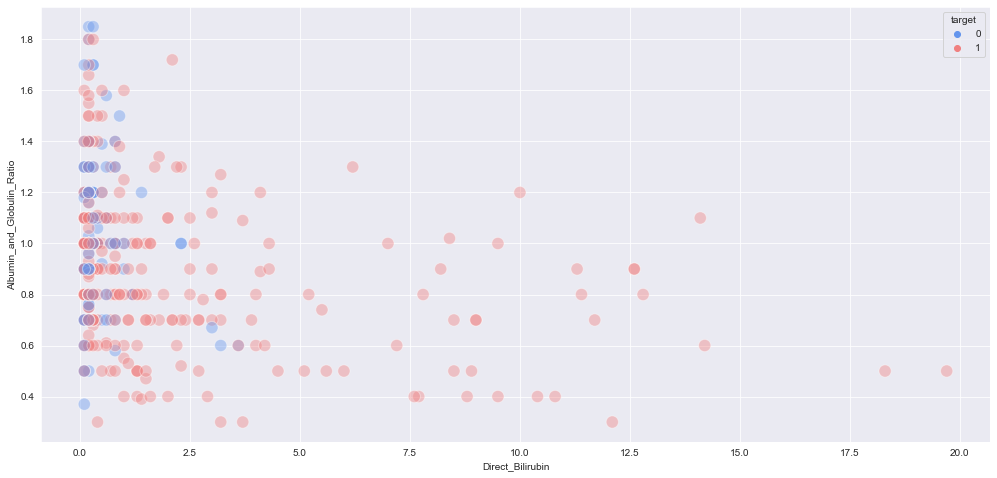

In [674]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Direct_Bilirubin',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Direct_Bilirubin')
    plt.ylabel(col)
    plt.show()

Age


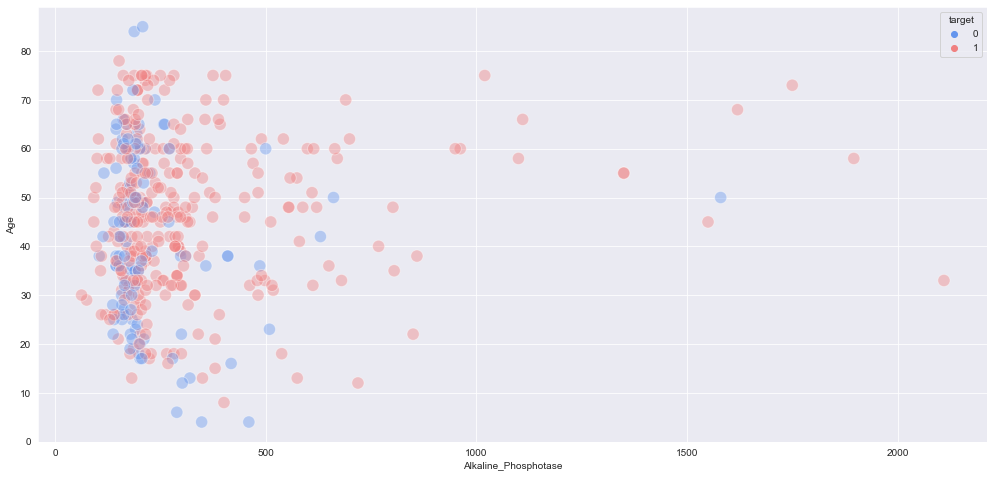

Total_Bilirubin


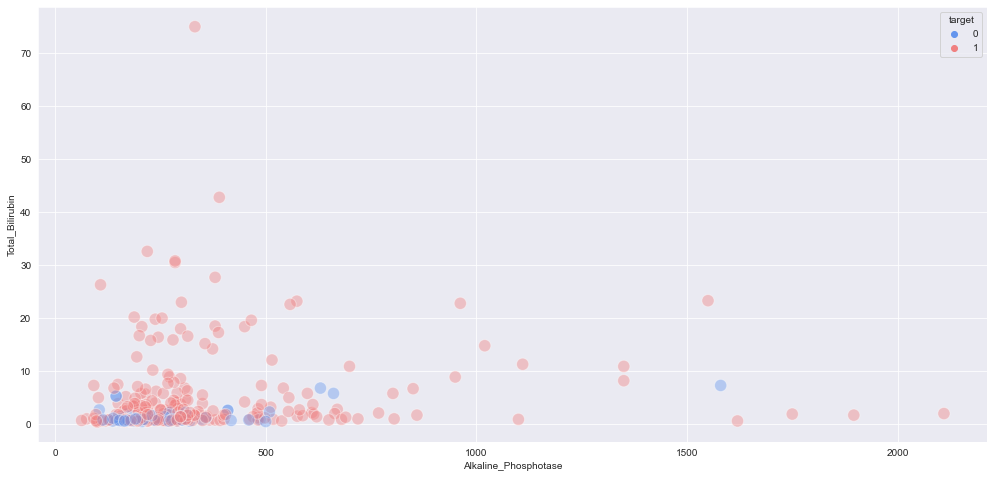

Direct_Bilirubin


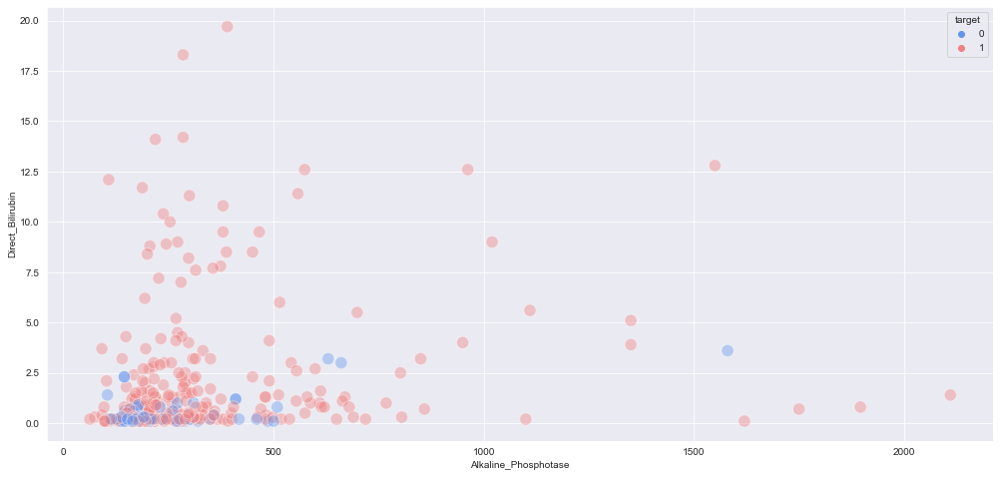

Alkaline_Phosphotase


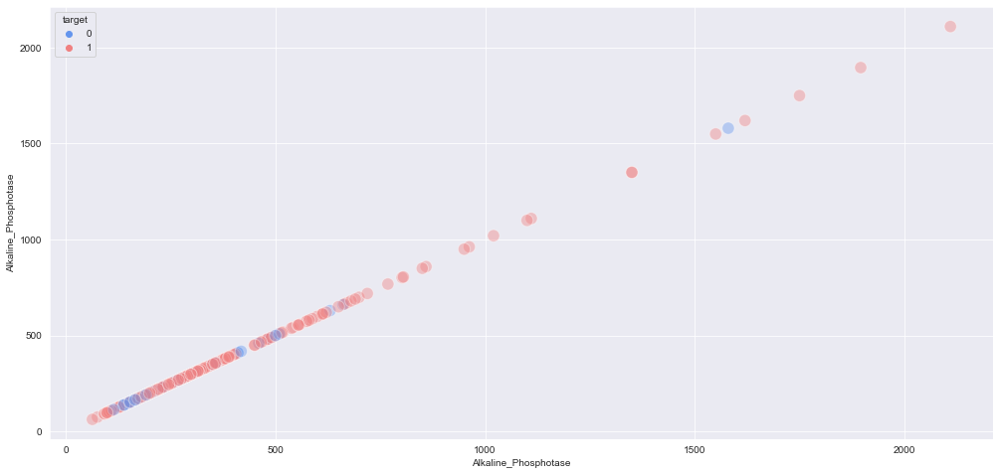

Alamine_Aminotransferase


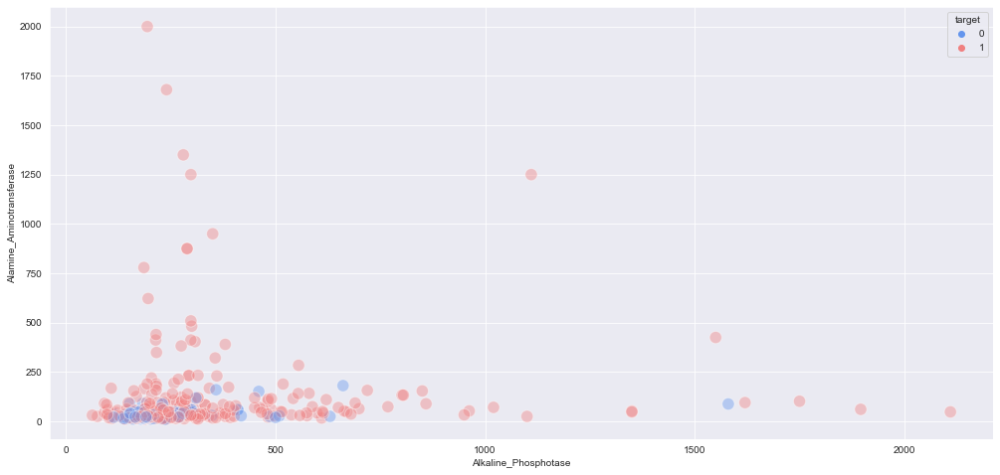

Aspartate_Aminotransferase


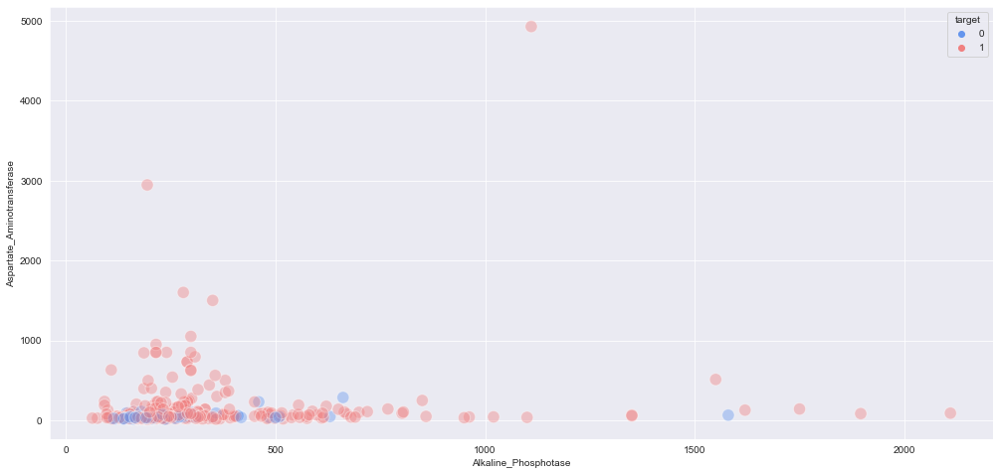

Total_Protiens


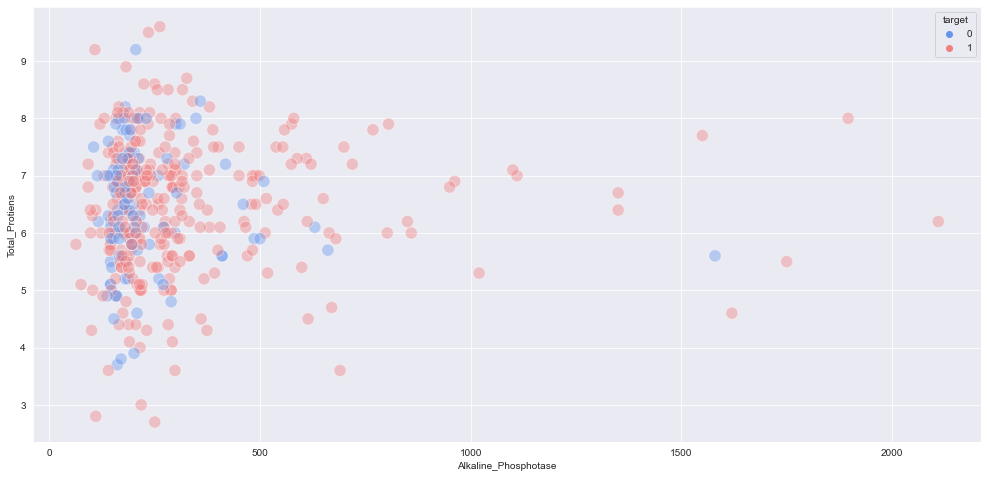

Albumin


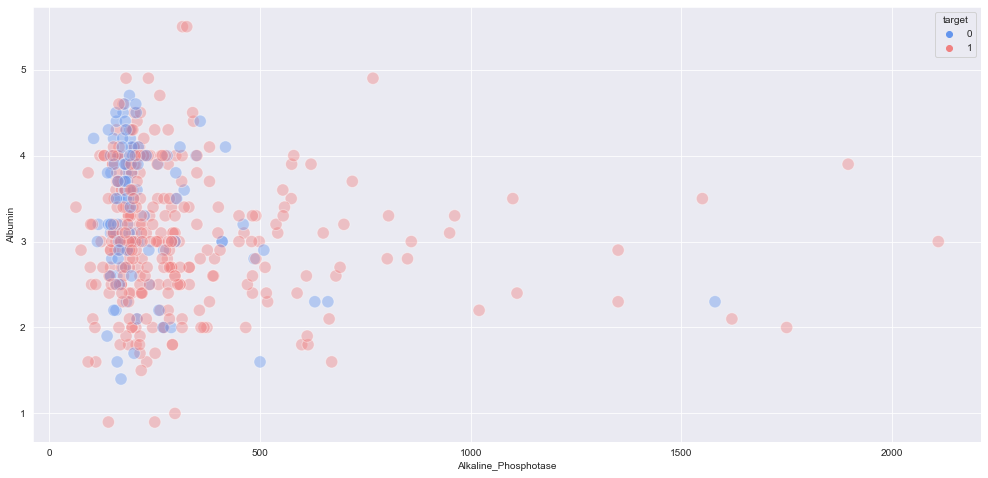

Albumin_and_Globulin_Ratio


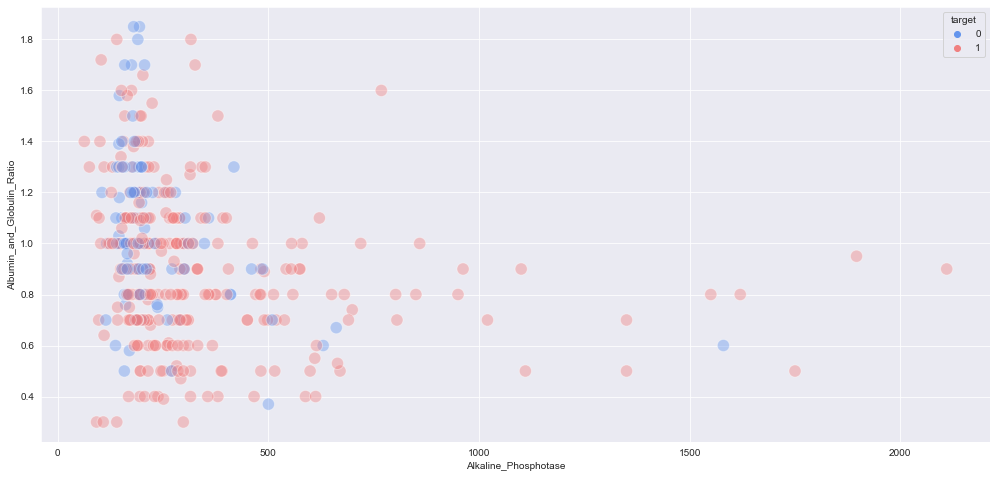

In [675]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Alkaline_Phosphotase',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Alkaline_Phosphotase')
    plt.ylabel(col)
    plt.show()

Age


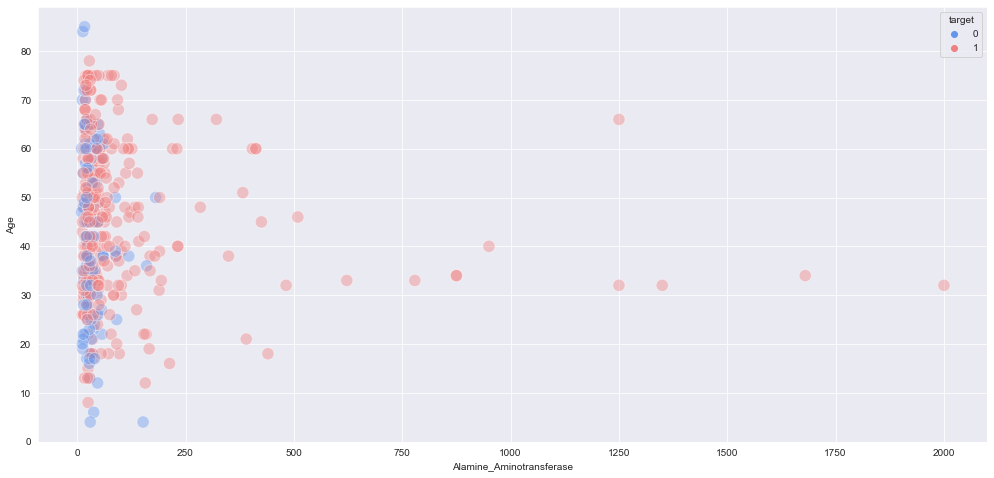

Total_Bilirubin


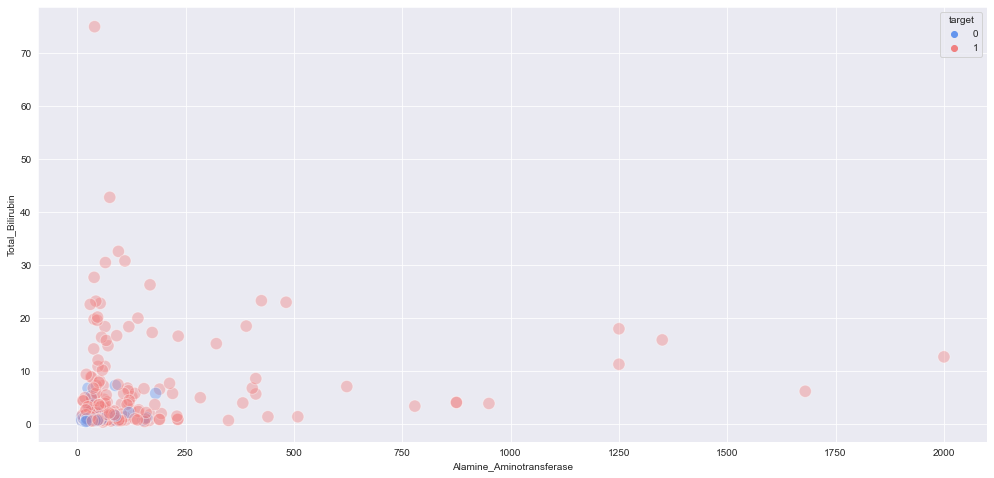

Direct_Bilirubin


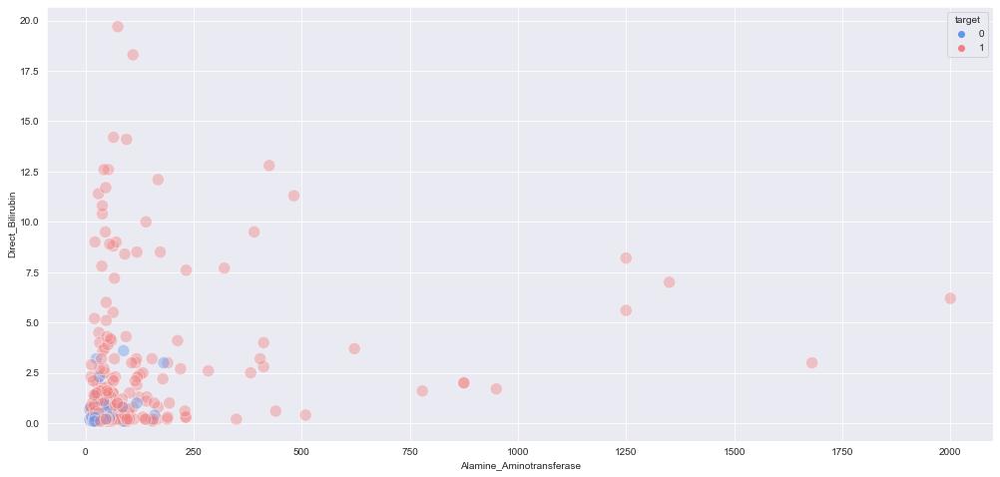

Alkaline_Phosphotase


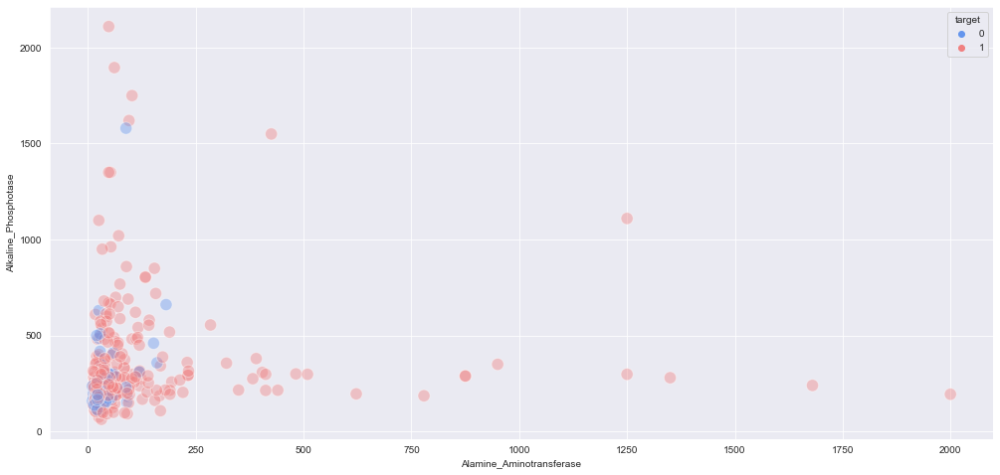

Alamine_Aminotransferase


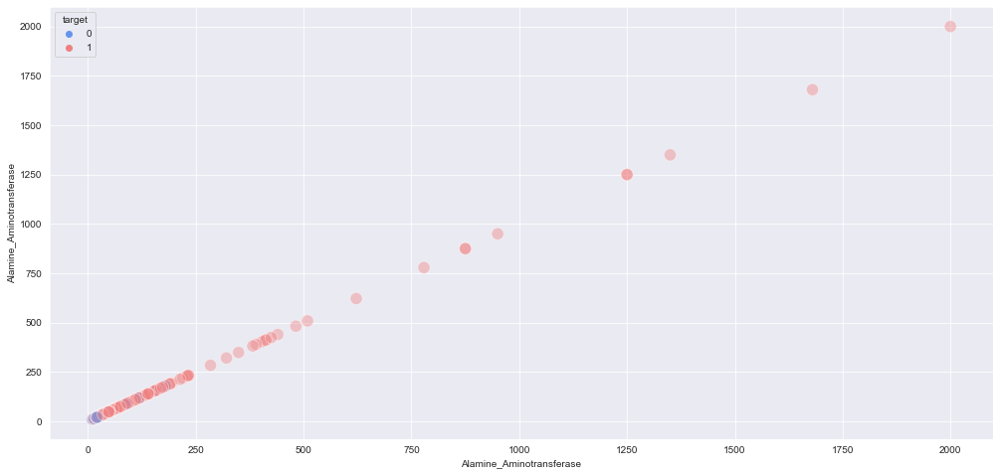

Aspartate_Aminotransferase


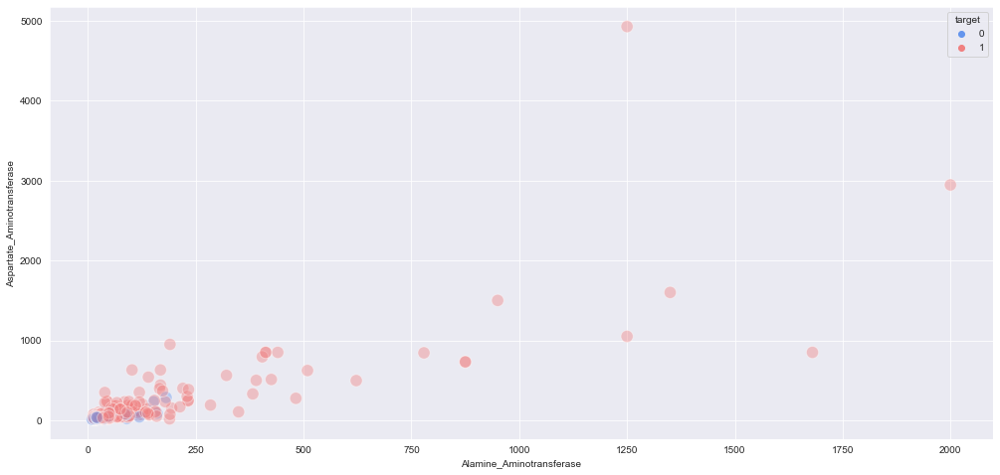

Total_Protiens


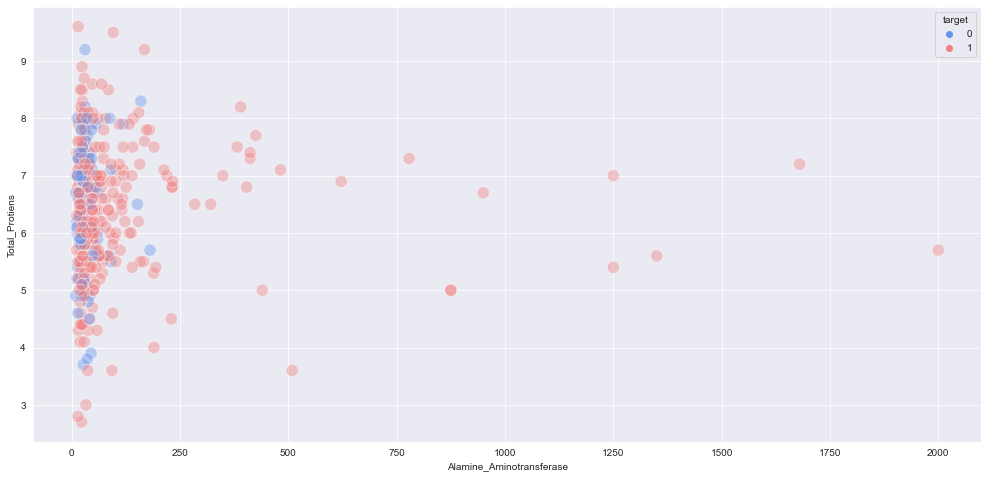

Albumin


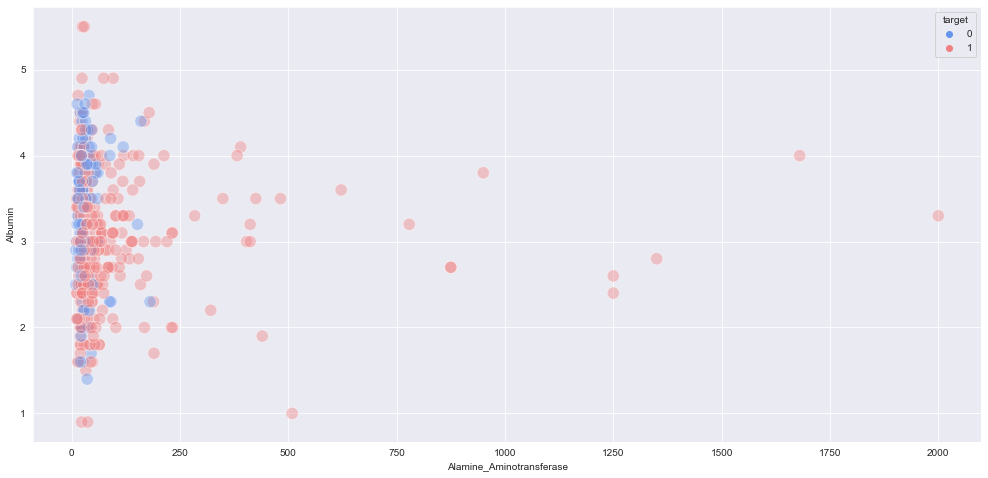

Albumin_and_Globulin_Ratio


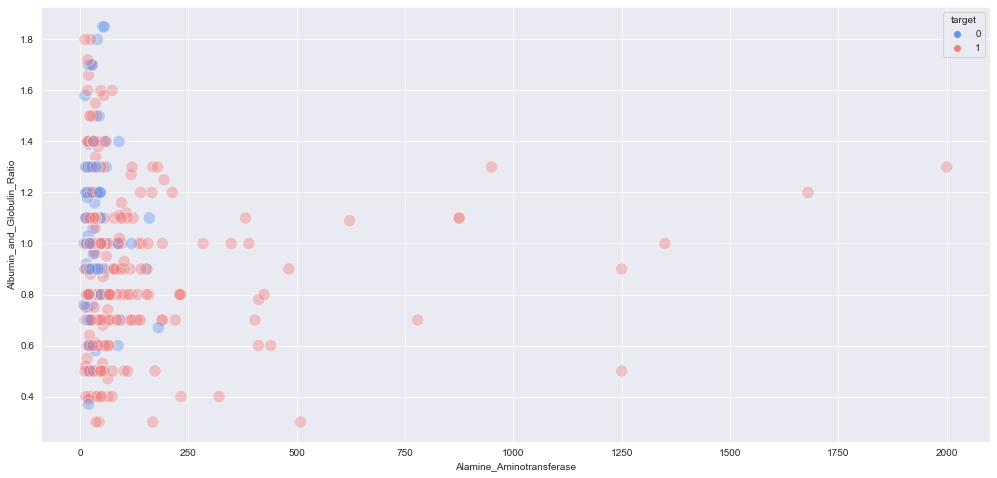

In [676]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Alamine_Aminotransferase',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Alamine_Aminotransferase')
    plt.ylabel(col)
    plt.show()

Age


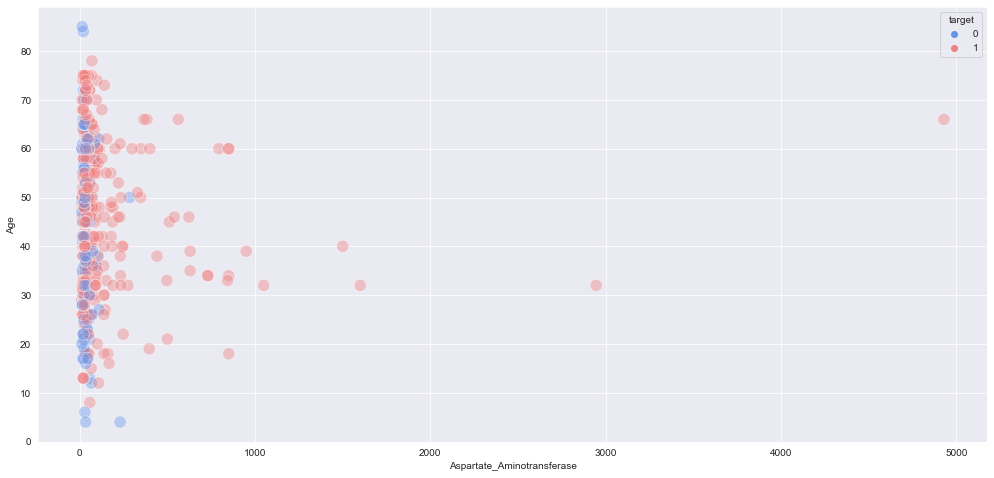

Total_Bilirubin


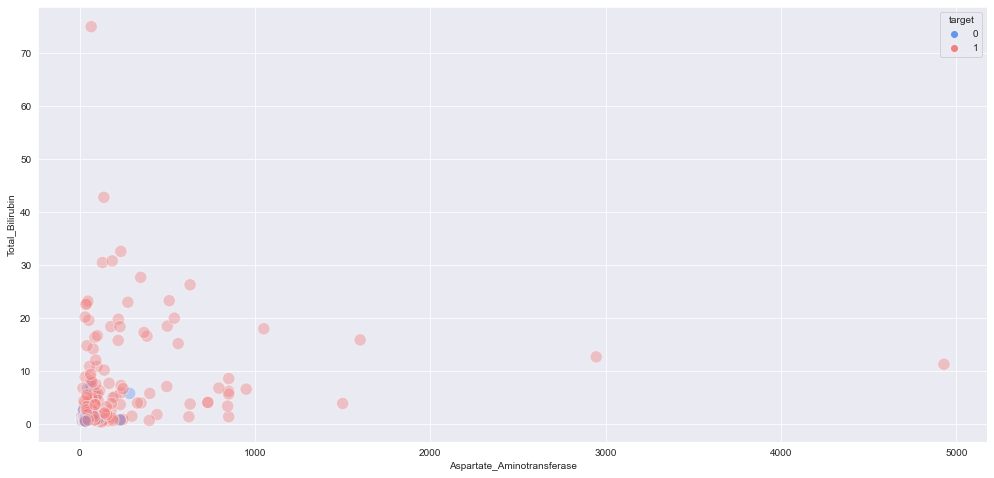

Direct_Bilirubin


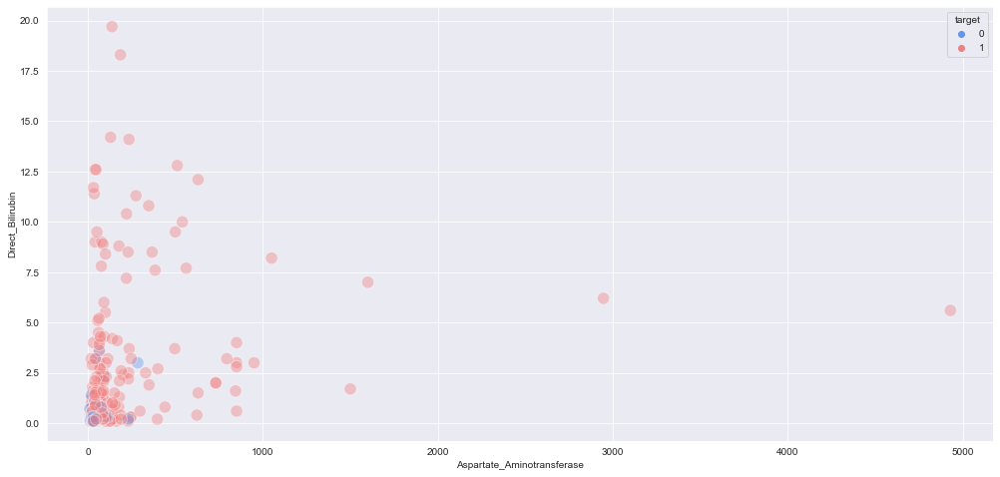

Alkaline_Phosphotase


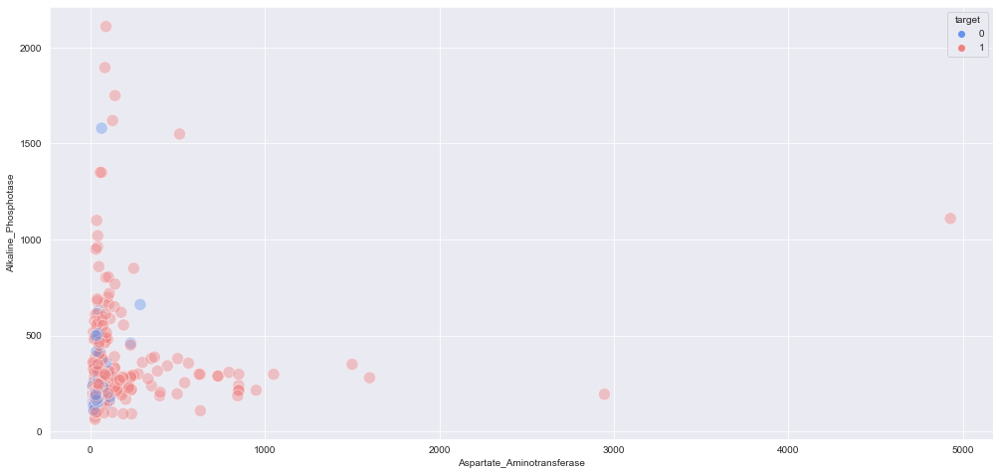

Alamine_Aminotransferase


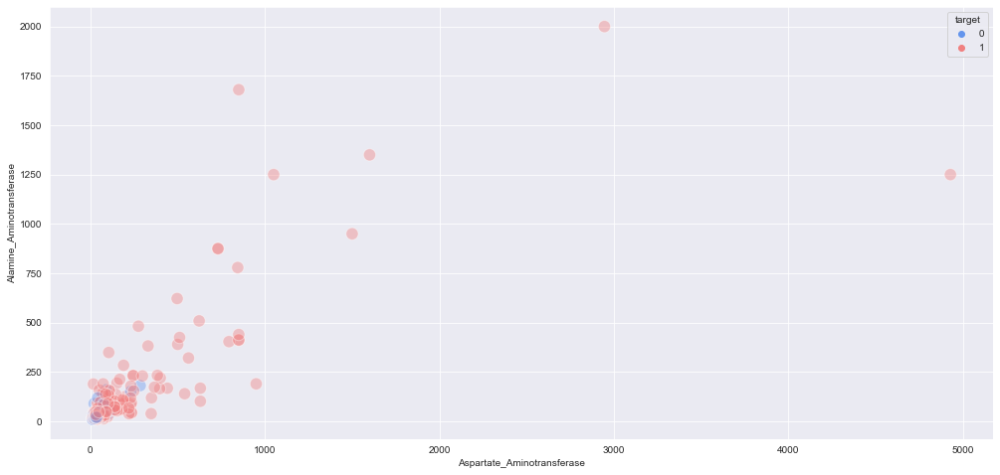

Aspartate_Aminotransferase


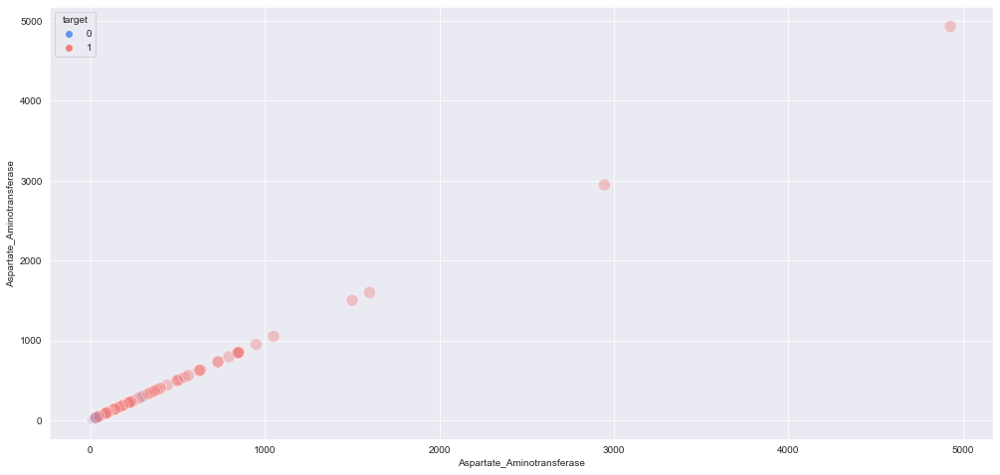

Total_Protiens


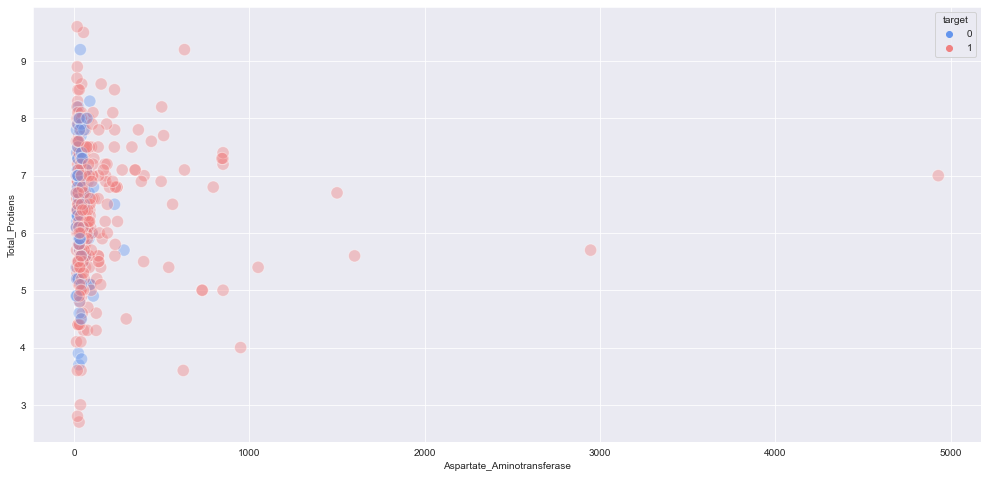

Albumin


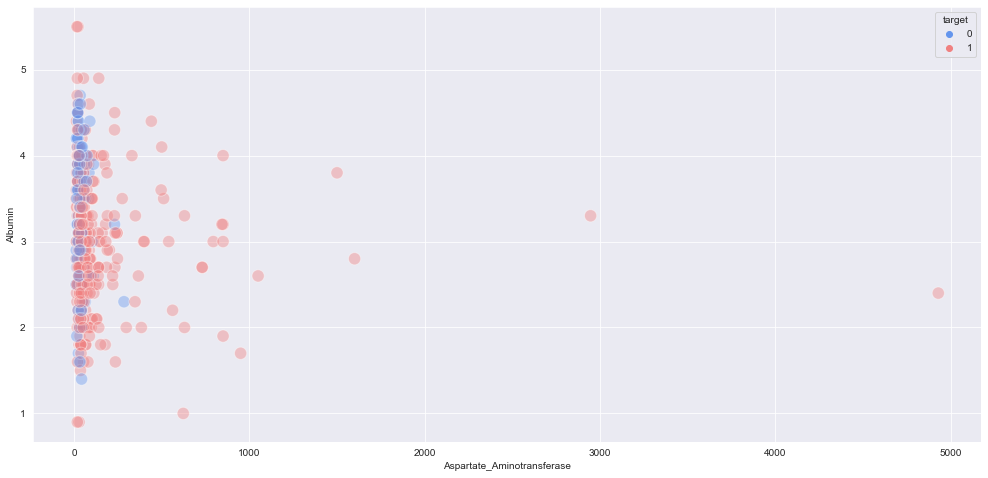

Albumin_and_Globulin_Ratio


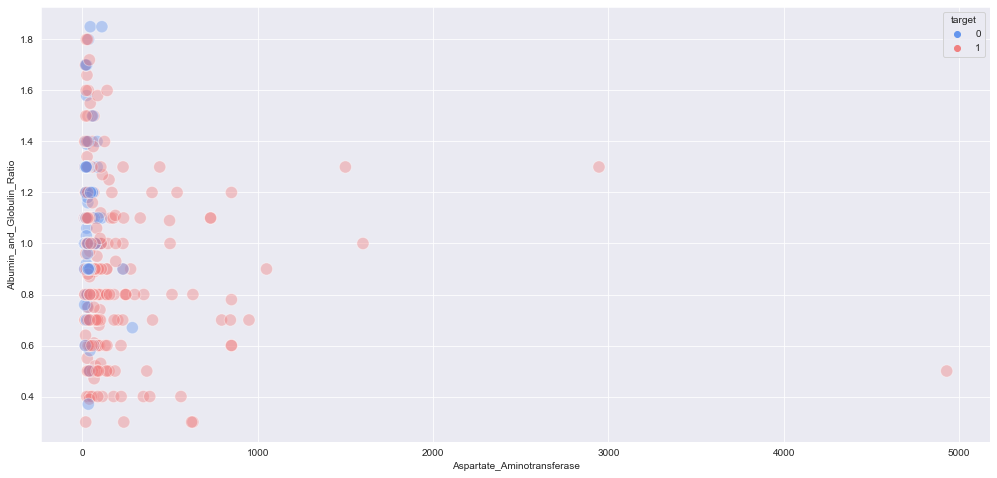

In [677]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Aspartate_Aminotransferase',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Aspartate_Aminotransferase')
    plt.ylabel(col)
    plt.show()

Age


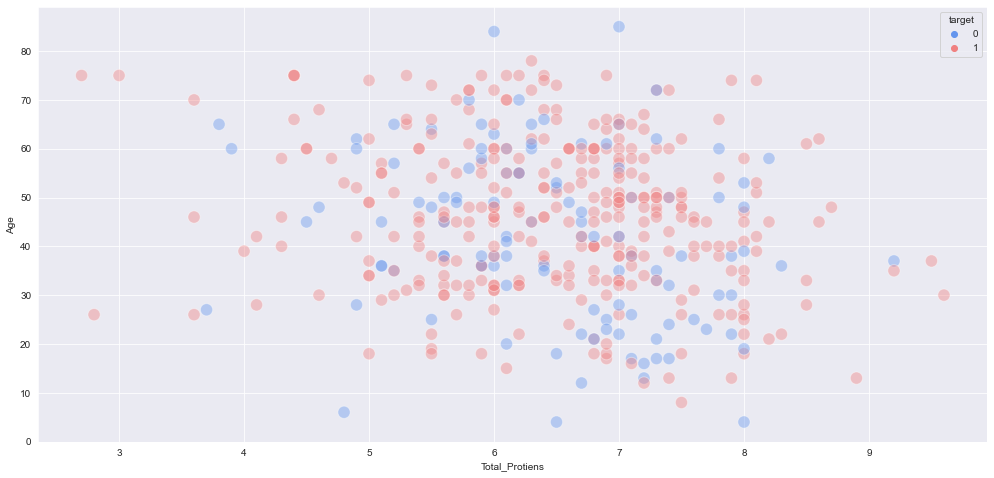

Total_Bilirubin


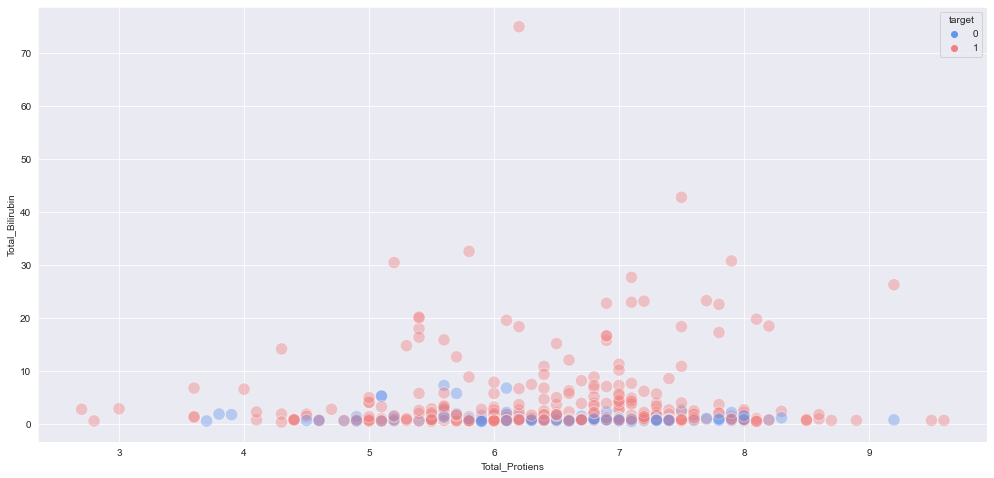

Direct_Bilirubin


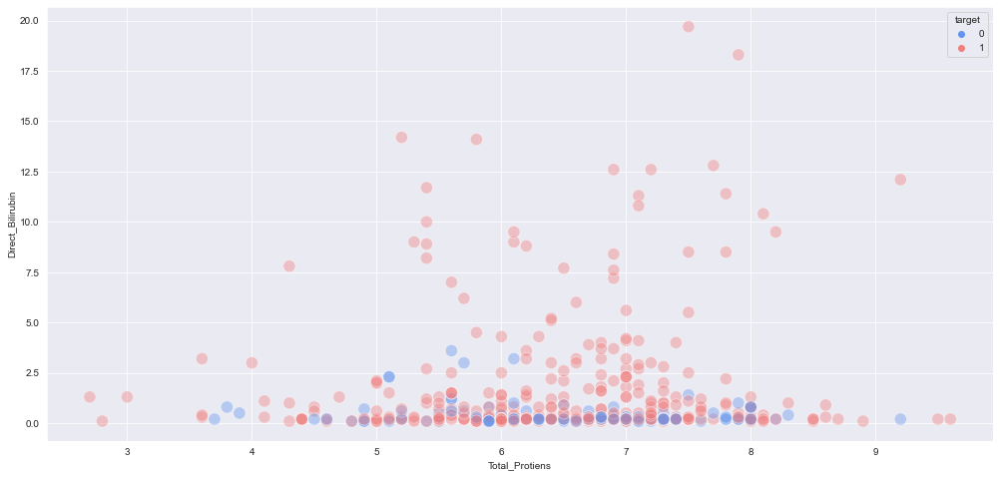

Alkaline_Phosphotase


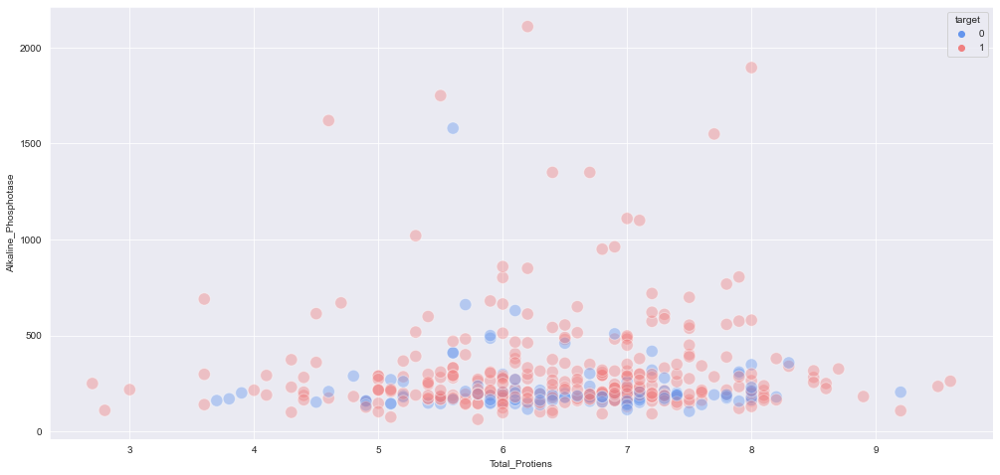

Alamine_Aminotransferase


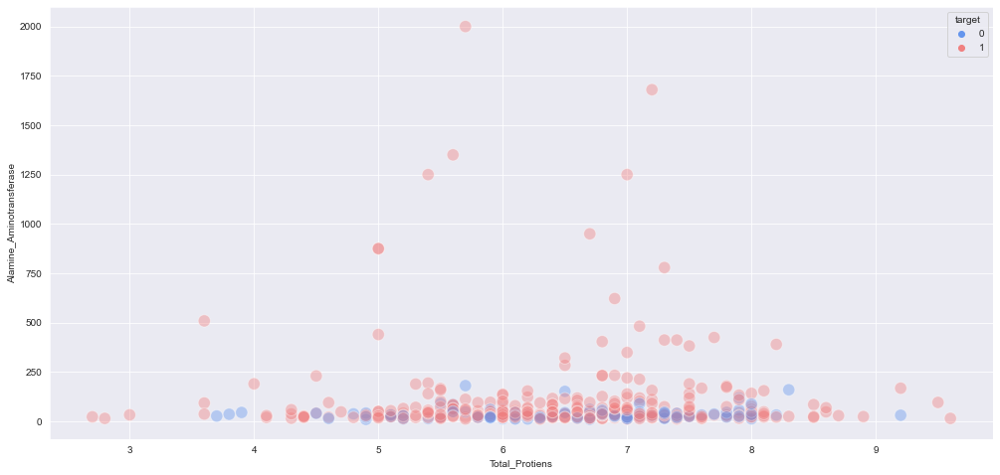

Aspartate_Aminotransferase


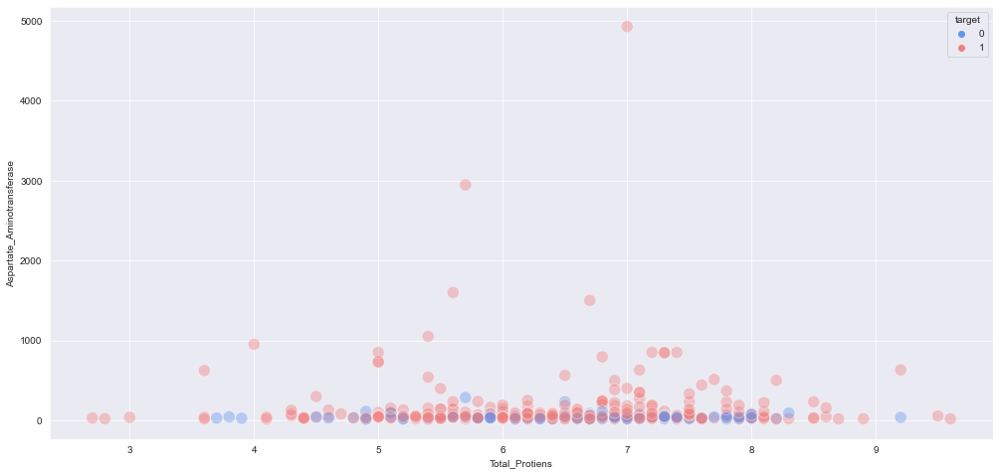

Total_Protiens


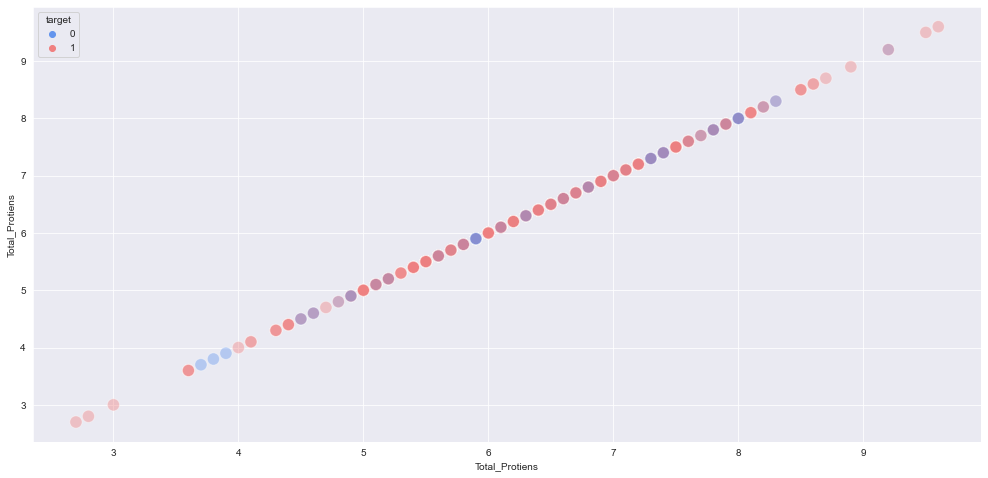

Albumin


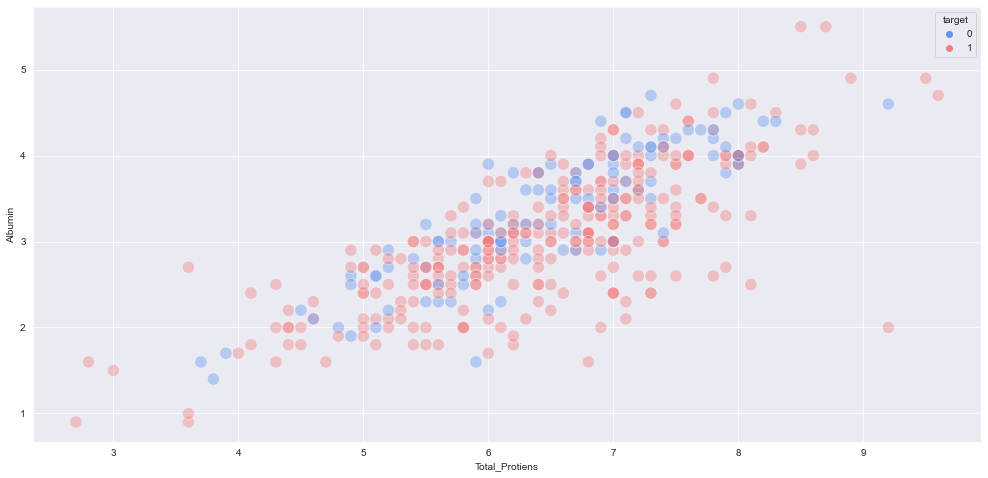

Albumin_and_Globulin_Ratio


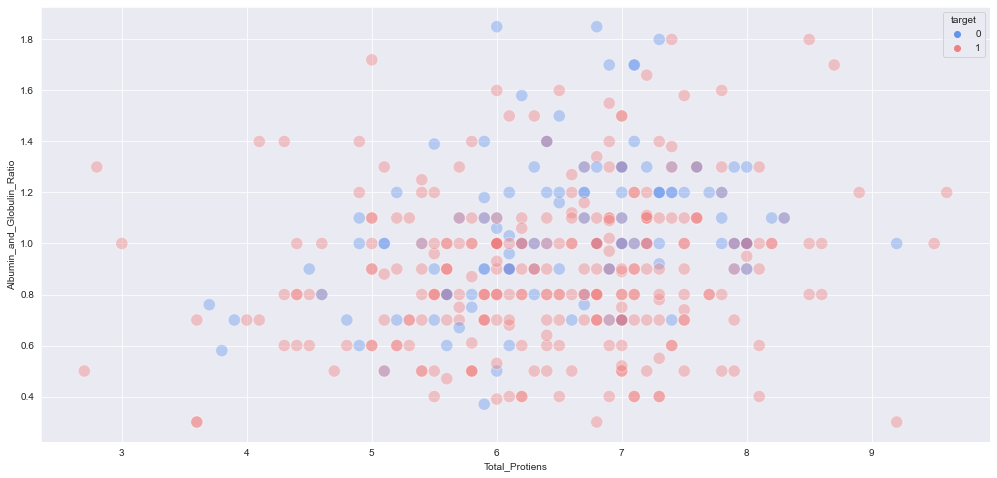

In [678]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Total_Protiens',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Total_Protiens')
    plt.ylabel(col)
    plt.show()

Age


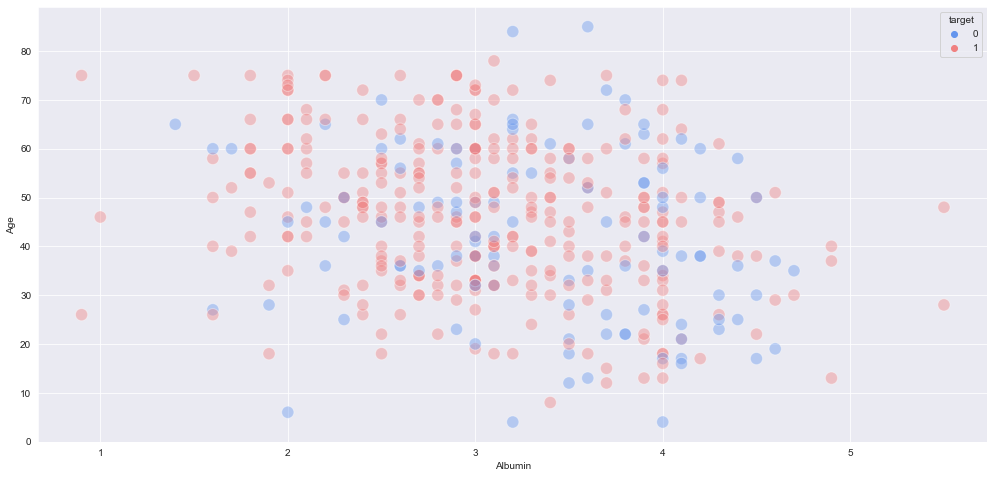

Total_Bilirubin


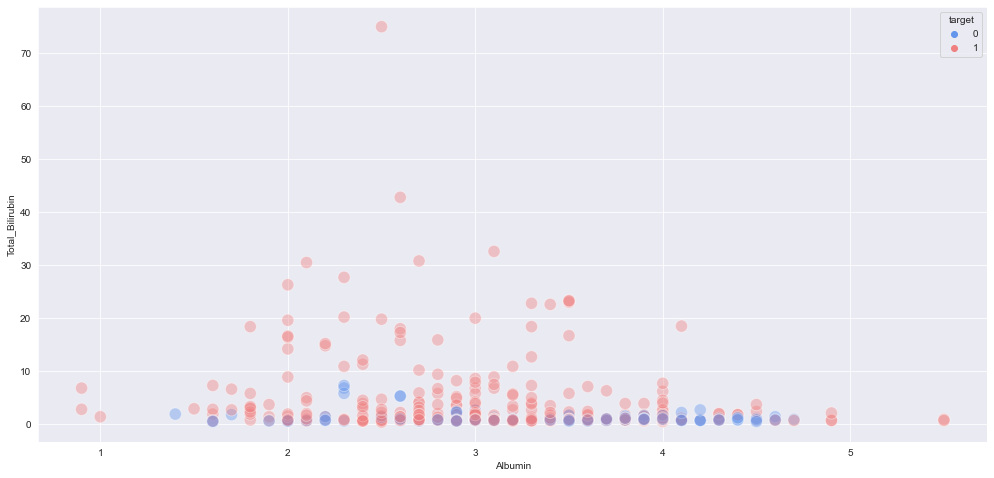

Direct_Bilirubin


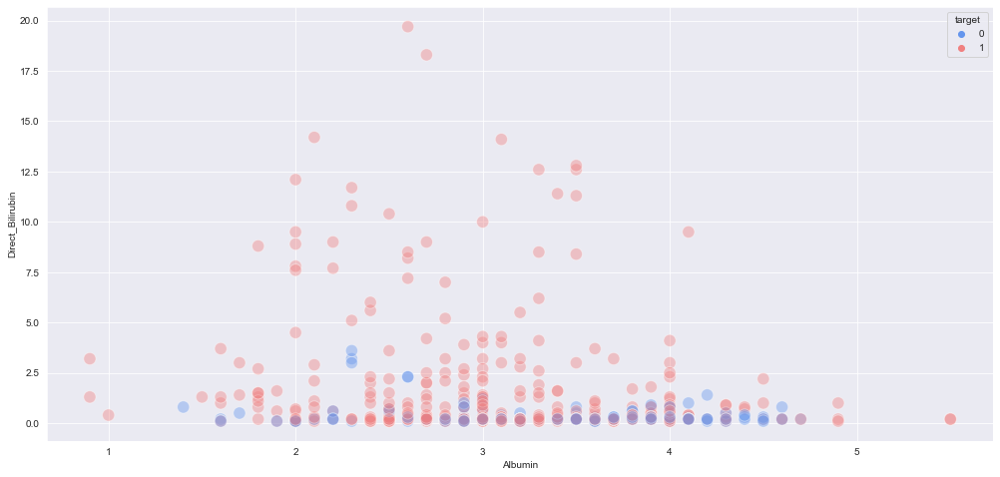

Alkaline_Phosphotase


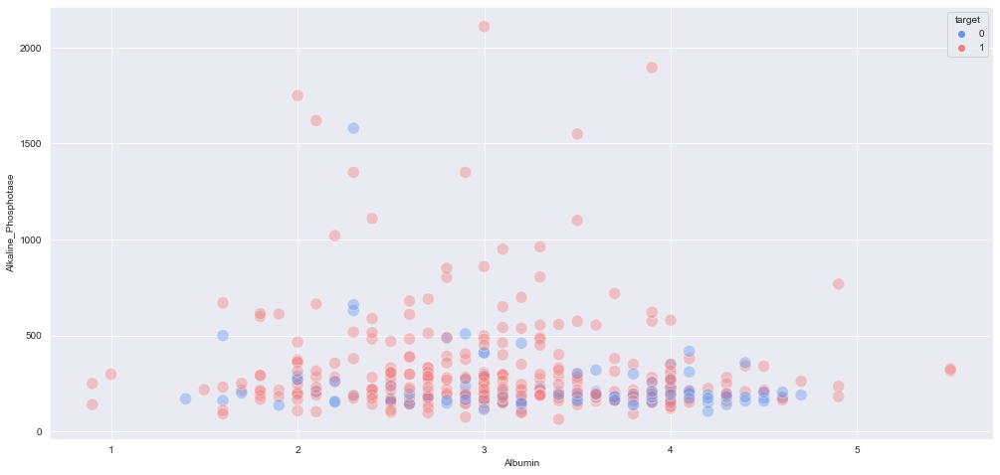

Alamine_Aminotransferase


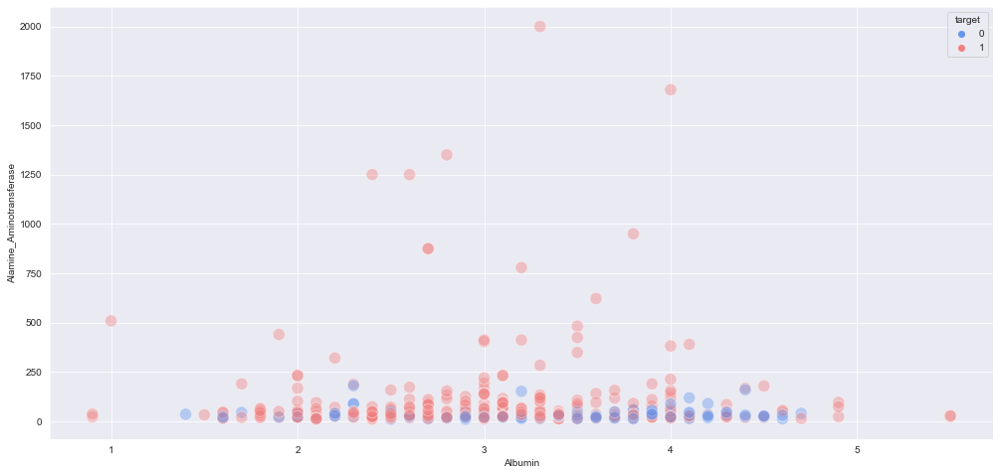

Aspartate_Aminotransferase


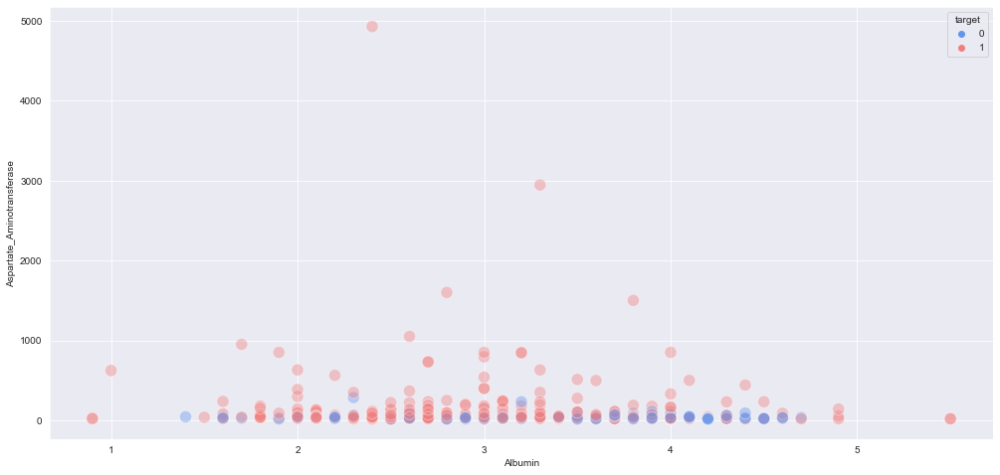

Total_Protiens


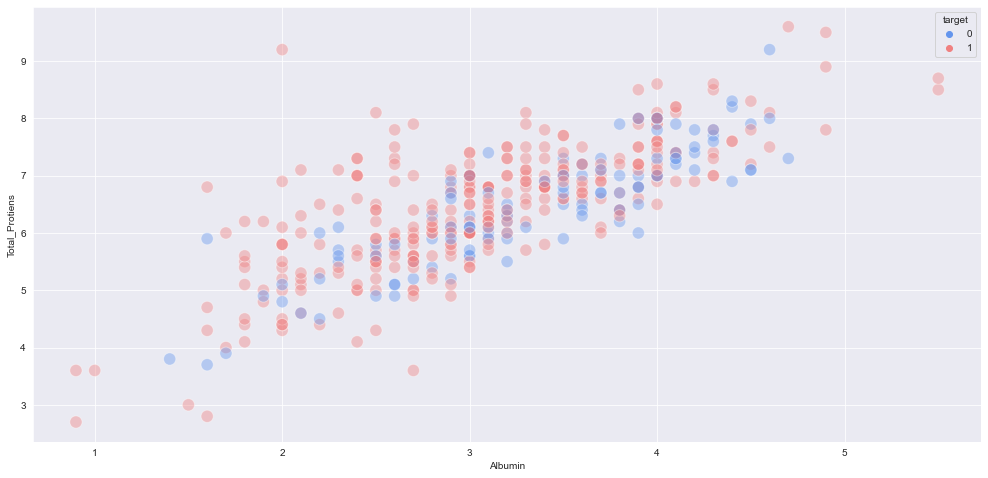

Albumin


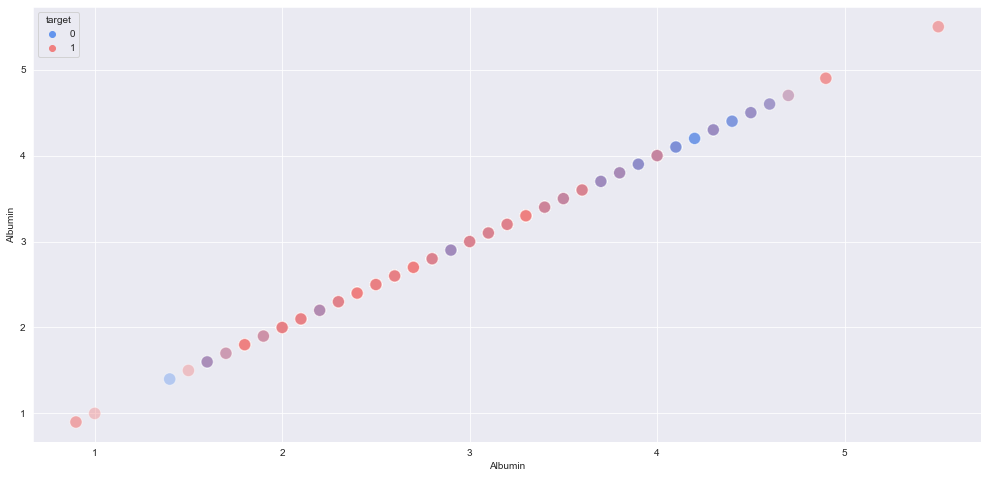

Albumin_and_Globulin_Ratio


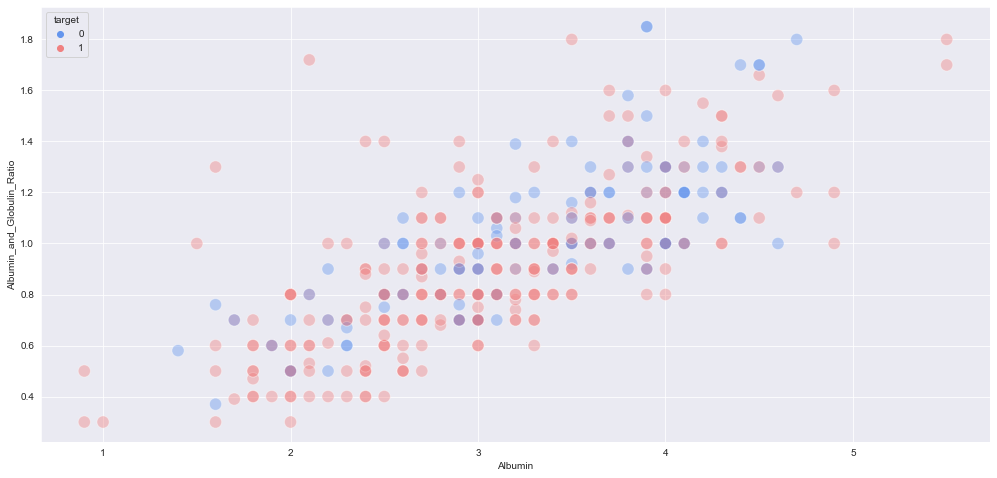

In [679]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Albumin',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Albumin')
    plt.ylabel(col)
    plt.show()

Age


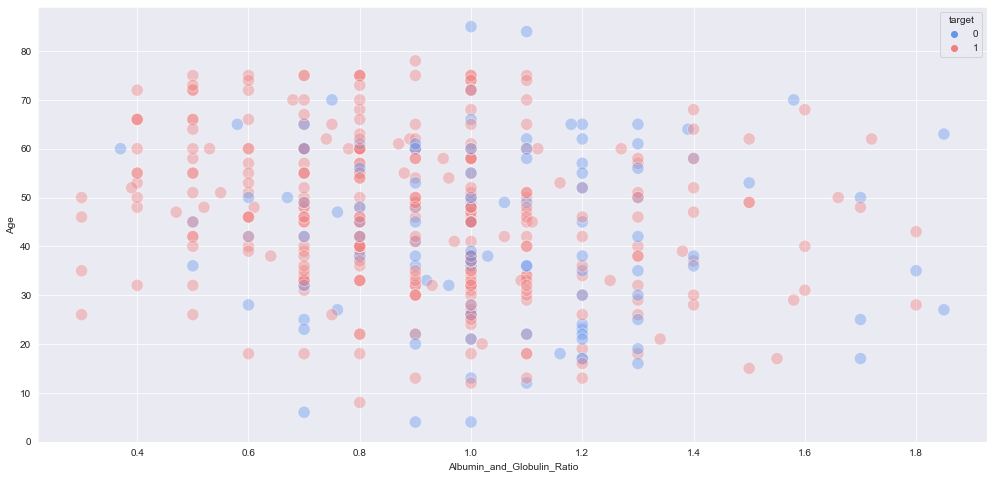

Total_Bilirubin


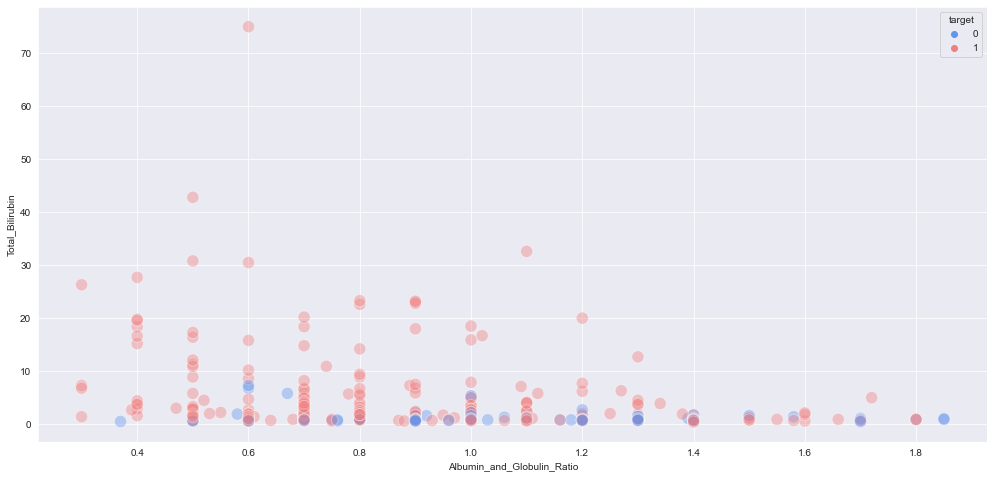

Direct_Bilirubin


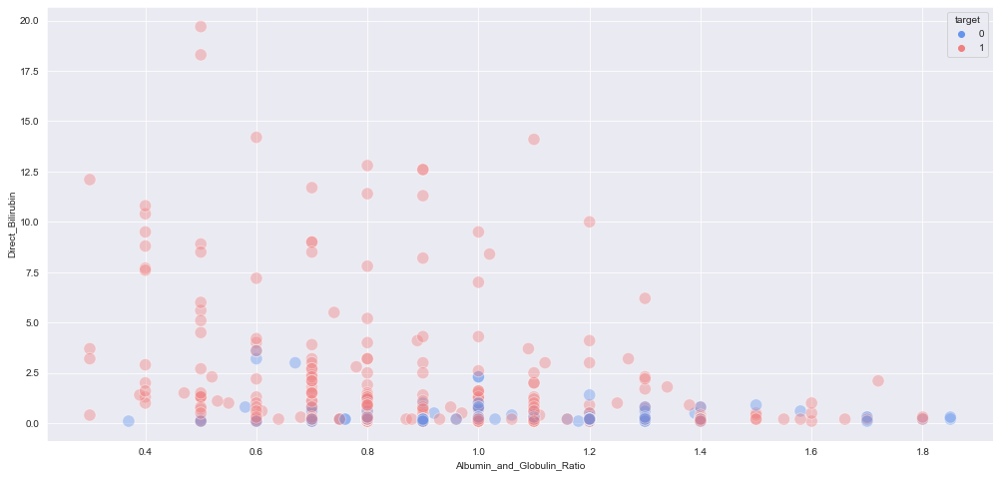

Alkaline_Phosphotase


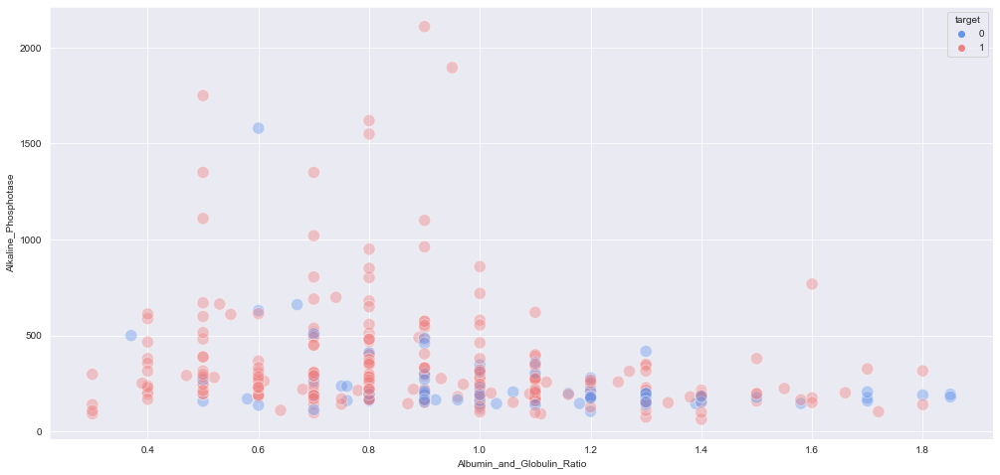

Alamine_Aminotransferase


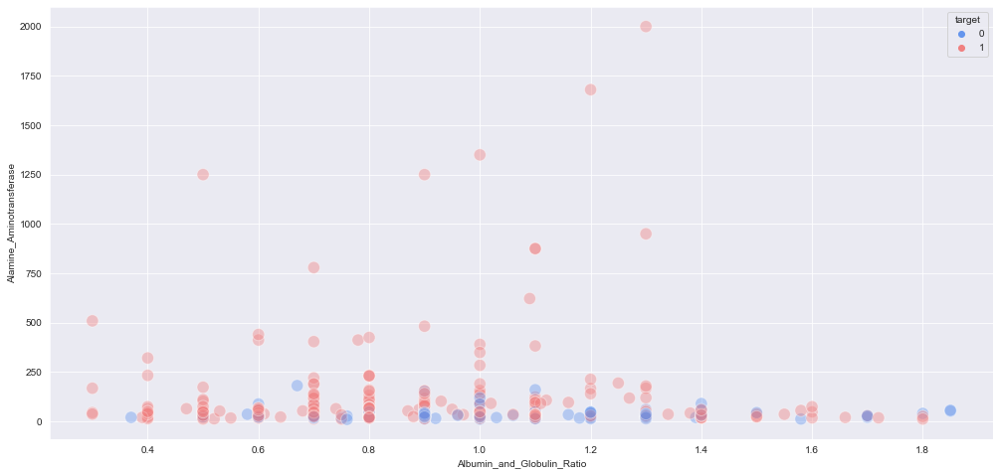

Aspartate_Aminotransferase


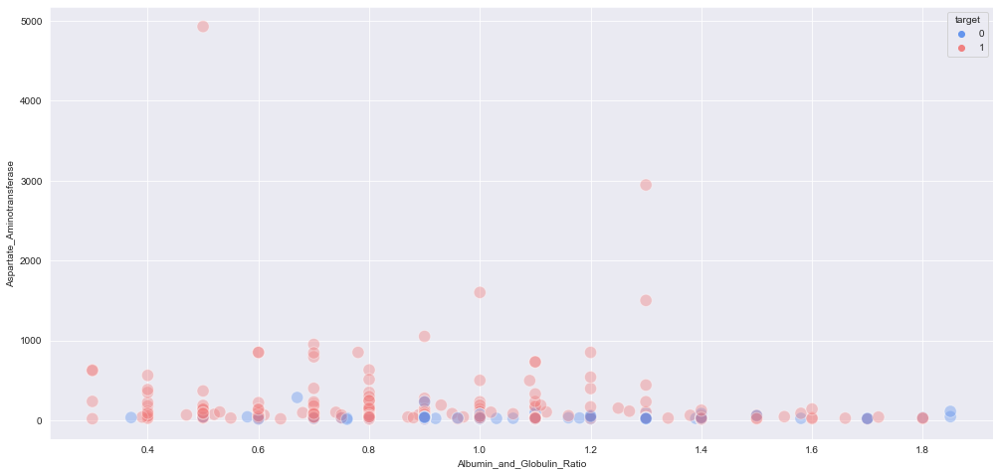

Total_Protiens


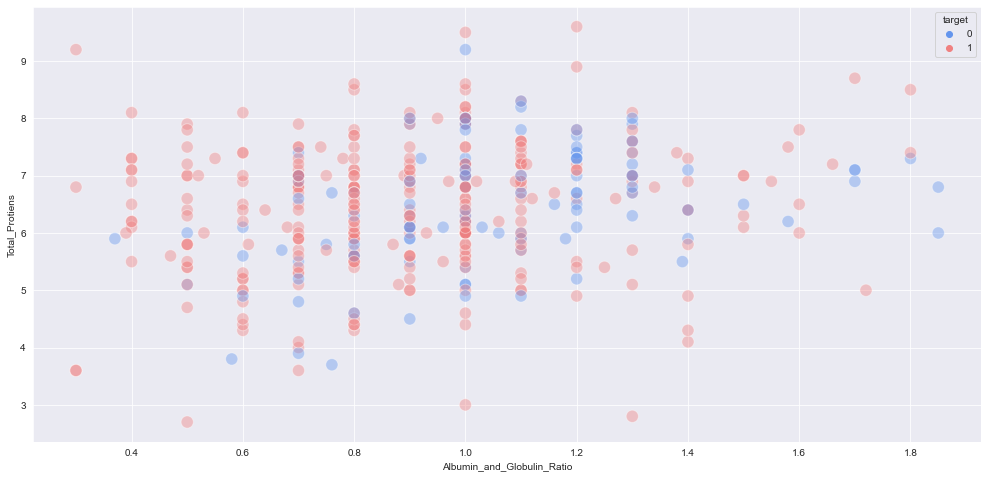

Albumin


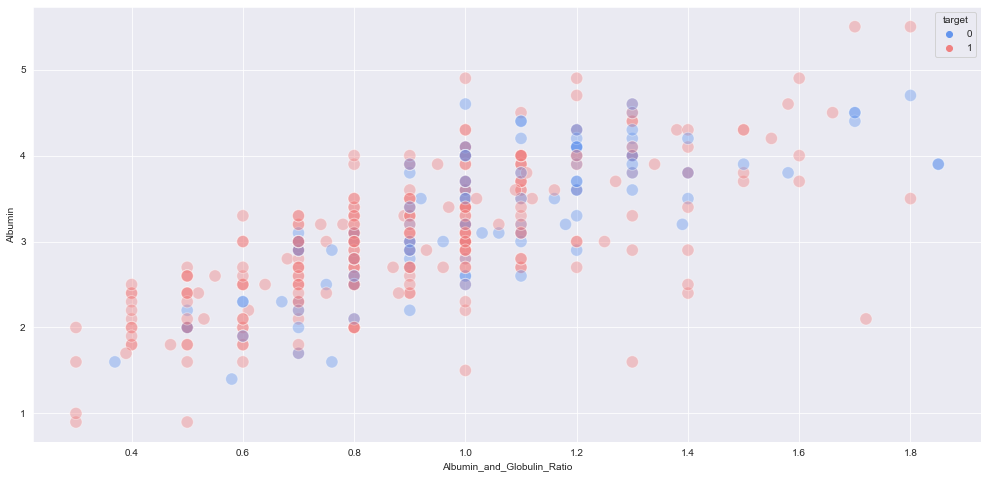

Albumin_and_Globulin_Ratio


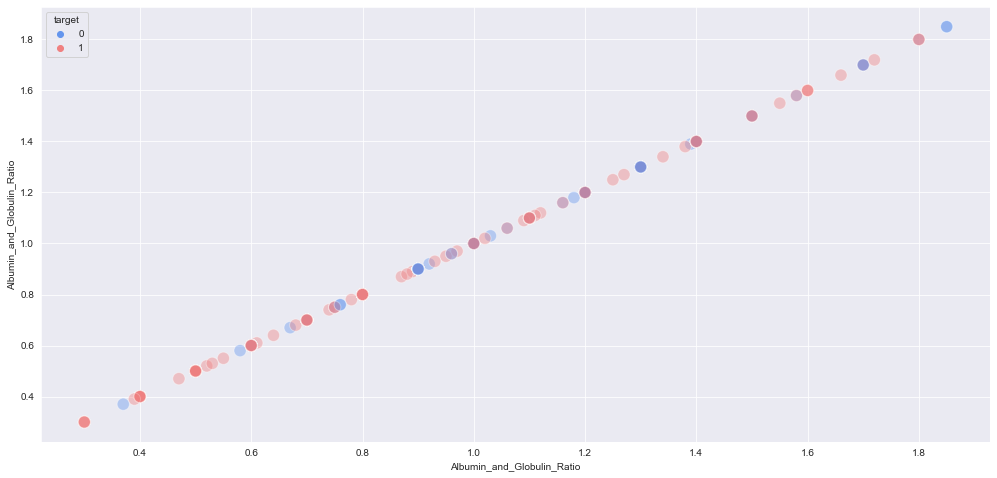

In [680]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Albumin_and_Globulin_Ratio',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Albumin_and_Globulin_Ratio')
    plt.ylabel(col)
    plt.show()

In [681]:
train_df.columns

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'target'],
      dtype='object')

In [682]:
fig = px.scatter_3d(train_df, x="Total_Bilirubin", y="Direct_Bilirubin", z="Alkaline_Phosphotase", color="target")
fig.show()

### Discrete_features

### Univariate/Bivariate analysis

In [683]:
train_df[discrete_features].nunique().sort_values(ascending=False)

Gender    2
target    2
dtype: int64

In [684]:
discrete_features

['Gender', 'target']

In [685]:
discrete_features = ['Gender']

discrete_features

['Gender']

Gender


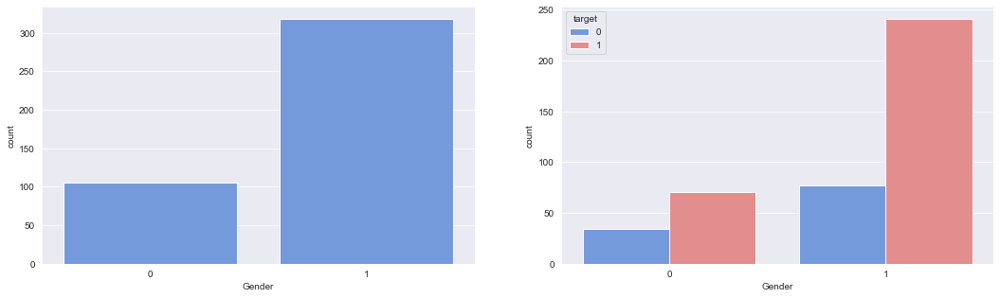

In [686]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=train_df, x=col,color='cornflowerblue',order=train_df[col].value_counts().sort_index().index)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=train_df, x=col, hue="target",palette=['cornflowerblue','lightcoral'],order=train_df[col].value_counts().sort_index().index)
    plt.show()

Gender


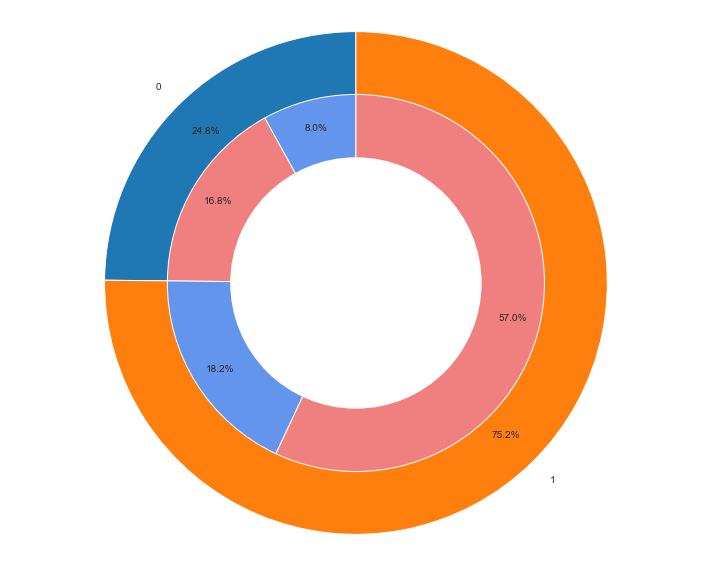

In [687]:
print('Gender')
labels = train_df['Gender'].value_counts().sort_index().index
sizes = train_df['Gender'].value_counts().sort_index().values
labels_gender = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['Gender','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

### Observation :

1. From above we can clearly observe that the chances of getting Liver disease is more for males compared to females

In [688]:
discrete_features

['Gender']

In [689]:
continuous_features

['Age',
 'Total_Bilirubin',
 'Direct_Bilirubin',
 'Alkaline_Phosphotase',
 'Alamine_Aminotransferase',
 'Aspartate_Aminotransferase',
 'Total_Protiens',
 'Albumin',
 'Albumin_and_Globulin_Ratio']

In [690]:
from num2words import num2words

In [691]:
data = train_df.copy()

In [692]:
data

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40,1
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50,1
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,1


In [693]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 423 entries, 0 to 422
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         423 non-null    int64  
 1   Gender                      423 non-null    int64  
 2   Total_Bilirubin             423 non-null    float64
 3   Direct_Bilirubin            423 non-null    float64
 4   Alkaline_Phosphotase        423 non-null    int64  
 5   Alamine_Aminotransferase    423 non-null    int64  
 6   Aspartate_Aminotransferase  423 non-null    int64  
 7   Total_Protiens              423 non-null    float64
 8   Albumin                     423 non-null    float64
 9   Albumin_and_Globulin_Ratio  420 non-null    float64
 10  target                      423 non-null    int64  
dtypes: float64(5), int64(6)
memory usage: 36.5 KB


In [694]:
for col in discrete_features:
    data[col] = data[col].apply(lambda x: num2words(x))

In [695]:
data

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,zero,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,one,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,one,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,one,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,one,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
418,32,one,3.7,1.6,612,50,88,6.2,1.9,0.40,1
419,32,one,12.1,6.0,515,48,92,6.6,2.4,0.50,1
420,60,one,0.5,0.1,500,20,34,5.9,1.6,0.37,0
421,40,one,0.6,0.1,98,35,31,6.0,3.2,1.10,1


In [696]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 423 entries, 0 to 422
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         423 non-null    int64  
 1   Gender                      423 non-null    object 
 2   Total_Bilirubin             423 non-null    float64
 3   Direct_Bilirubin            423 non-null    float64
 4   Alkaline_Phosphotase        423 non-null    int64  
 5   Alamine_Aminotransferase    423 non-null    int64  
 6   Aspartate_Aminotransferase  423 non-null    int64  
 7   Total_Protiens              423 non-null    float64
 8   Albumin                     423 non-null    float64
 9   Albumin_and_Globulin_Ratio  420 non-null    float64
 10  target                      423 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 36.5+ KB


In [697]:
discrete_features

['Gender']

In [698]:
train_df[discrete_features].nunique()

Gender    2
dtype: int64

In [699]:
data['Gender'].unique()

array(['zero', 'one'], dtype=object)

Age


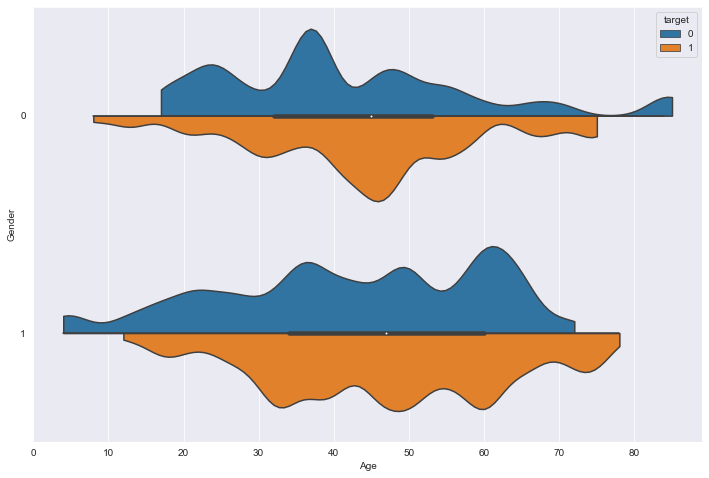

Total_Bilirubin


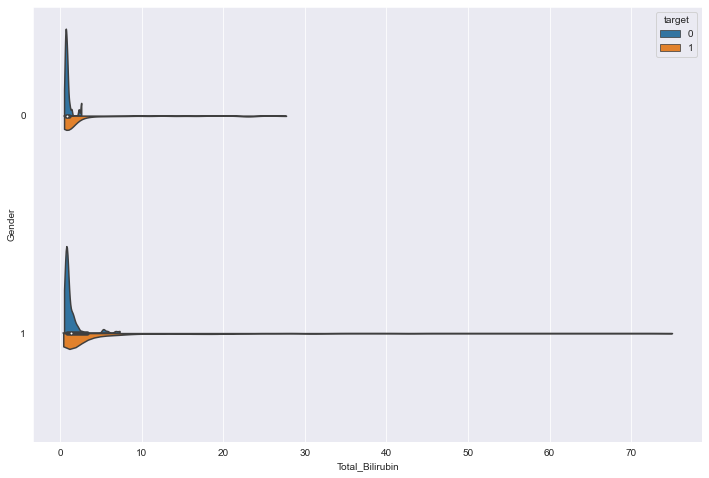

Direct_Bilirubin


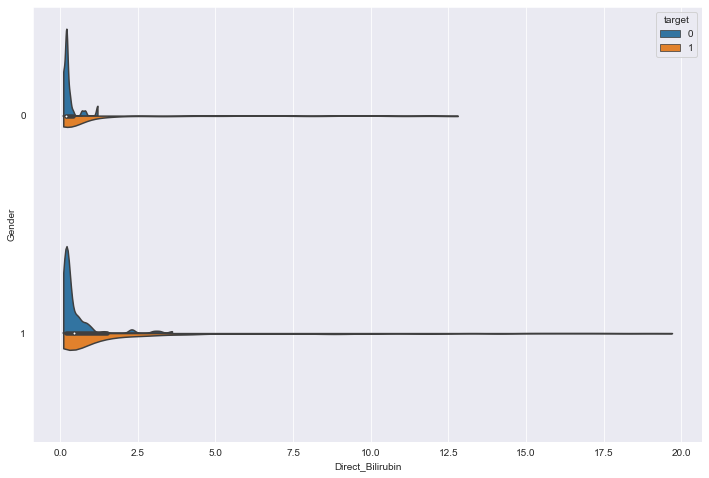

Alkaline_Phosphotase


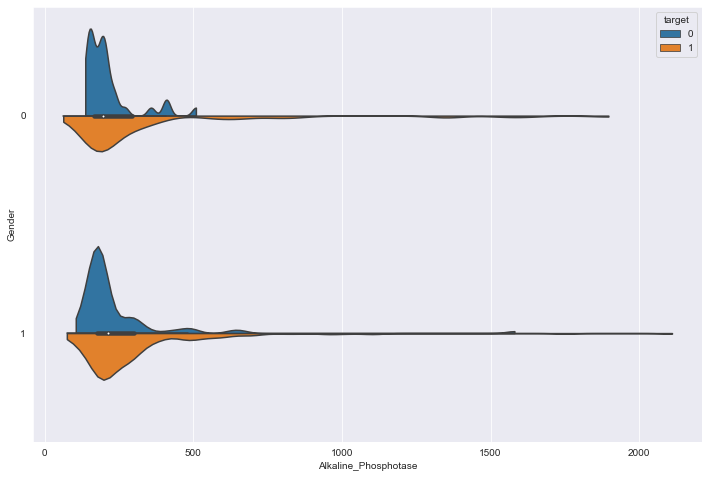

Alamine_Aminotransferase


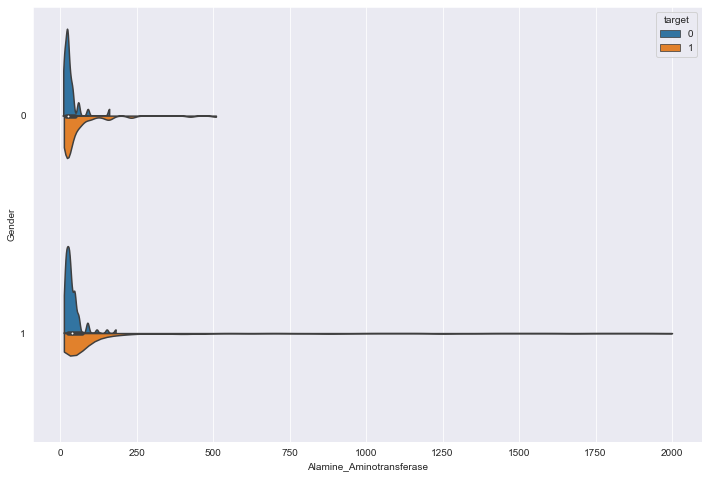

Aspartate_Aminotransferase


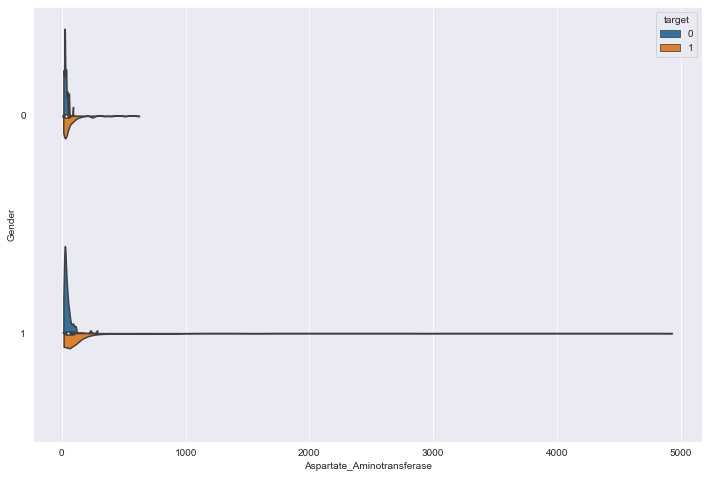

Total_Protiens


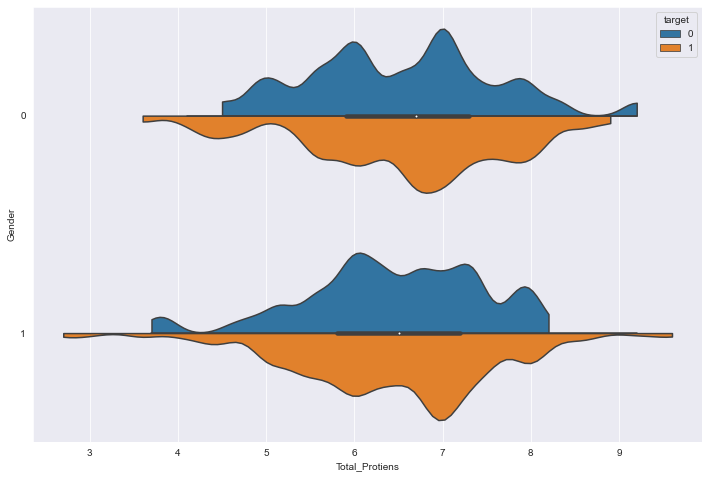

Albumin


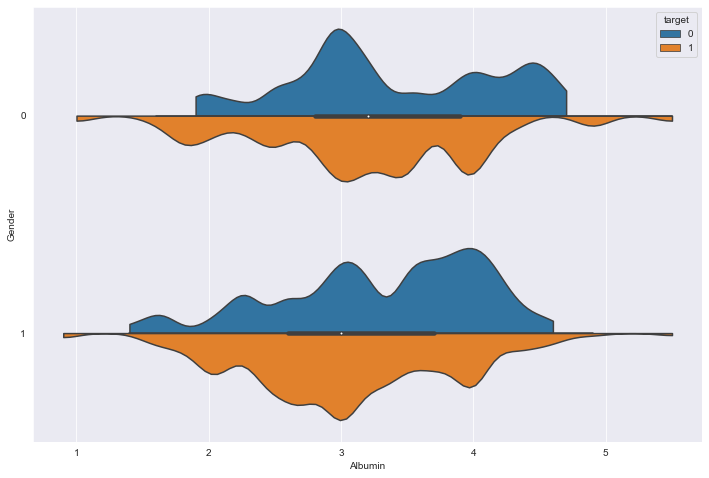

Albumin_and_Globulin_Ratio


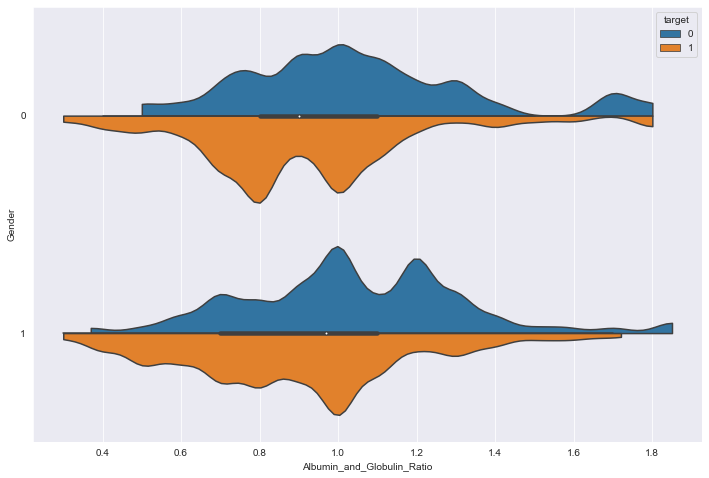

In [700]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,8))
    sns.violinplot(data=train_df, x=col, y="Gender", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Gender')
    plt.show()

In [701]:
numerical_features

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'target'],
      dtype='object')

In [702]:
categorical_features

Index([], dtype='object')

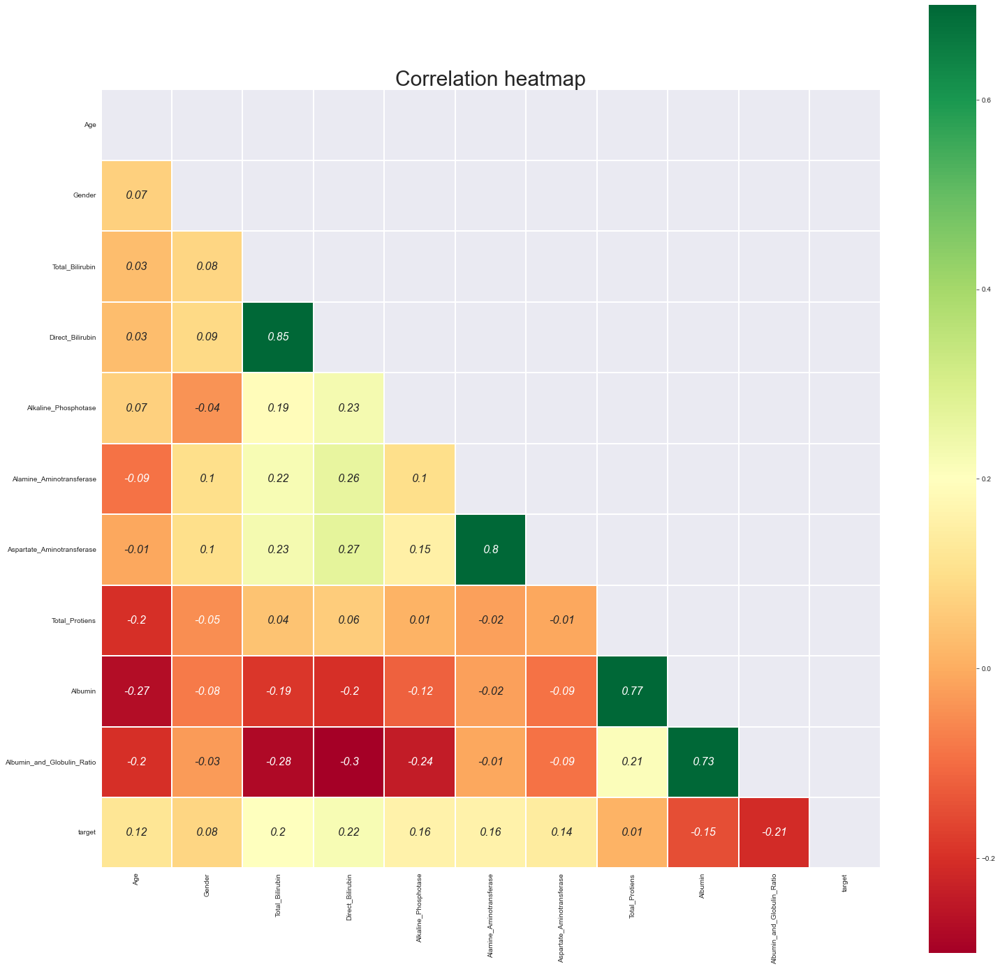

In [703]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df[numerical_features].corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df[numerical_features].corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

### Observation :

1. We can see there is slight positive correlation between ['Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase'] and 'target'
2. slights negative correlation among ['Albumin','Albumin_and_Globulin_Ratio'] and target

### Multicollinearity

4. there exists the Multicollinearity

#### We need to be very careful with this Multicollinearity when using 'Linear ML Models'

## Categorical_features

In [704]:
categorical_features

Index([], dtype='object')

In [705]:
# No categorical features

In [706]:
train_df.niiofbid()

AttributeError: 'DataFrame' object has no attribute 'niiofbid'

In [707]:
train_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40,1
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50,1
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,1


In [708]:
val_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,23,1,1.0,0.3,212,41,80,6.2,3.1,1.0,1
1,42,1,0.7,0.2,197,64,33,5.8,2.4,0.7,0
2,27,1,0.7,0.2,243,21,23,5.3,2.3,0.7,0
3,35,1,2.0,1.1,226,33,135,6.0,2.7,0.8,0
4,49,1,1.0,0.3,230,48,58,8.4,4.2,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...
75,28,0,1.0,0.3,90,18,108,6.8,3.1,0.8,0
76,38,1,1.0,0.3,216,21,24,7.3,4.4,1.5,0
77,44,0,1.9,0.6,298,378,602,6.6,3.3,1.0,1
78,50,0,1.7,0.6,430,28,32,6.8,3.5,1.0,1


In [709]:
test_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,1,0.8,0.2,162,30,90,3.8,1.4,0.50,1
1,29,1,0.8,0.2,156,12,15,6.8,3.7,1.10,0
2,60,1,2.4,1.0,1124,30,54,5.2,1.9,0.50,1
3,90,1,1.1,0.3,215,46,134,6.9,3.0,0.70,1
4,46,1,0.6,0.2,115,14,11,6.9,3.4,0.90,1
...,...,...,...,...,...,...,...,...,...,...,...
75,60,1,2.9,1.3,230,32,44,5.6,2.0,0.50,1
76,18,1,1.3,0.7,316,10,21,6.0,2.1,0.50,0
77,56,1,17.7,8.8,239,43,185,5.6,2.4,0.70,1
78,64,0,0.8,0.2,178,17,18,6.3,3.1,0.90,1


In [710]:
# writing the final df to a file

train_df.to_csv('../Data/Liver/train_df.csv',index=False)

In [711]:
# writing the final df to a file

val_df.to_csv('../Data/Liver/val_df.csv',index=False)

In [712]:
# writing the final df to a file

test_df.to_csv('../Data/Liver/test_df.csv',index=False)

# Feature Engineering

In [713]:
# Preprocessing imports
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer,QuantileTransformer,PowerTransformer
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,LabelEncoder
from sklearn.preprocessing import StandardScaler,RobustScaler,MinMaxScaler

# Models
from sklearn.linear_model import LogisticRegression,SGDClassifier,RidgeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB,MultinomialNB
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,IsolationForest,ExtraTreesClassifier,AdaBoostClassifier
from xgboost import XGBClassifier,XGBRFClassifier

# Cross-validation
from sklearn.model_selection import cross_val_score

# Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Pipeline
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer,TransformedTargetRegressor

# Metrics
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score,f1_score,precision_recall_curve

from imblearn.over_sampling import SMOTE

# Visualize Pipeline
from sklearn import set_config

# PCA - for dimensionality reduction
from sklearn.decomposition import PCA

# to calculate VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# To calculate the Verinces of each feature
from sklearn.feature_selection import VarianceThreshold

# Mutual Information for classification - For Feature Selection
from sklearn.feature_selection import mutual_info_classif

In [714]:
train_df = pd.read_csv('../Data/Liver/train_df.csv')
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [715]:
val_df = pd.read_csv('../Data/Liver/val_df.csv')
X_val = val_df.drop('target',axis=1)
y_val = val_df['target']

In [716]:
test_df = pd.read_csv('../Data/Liver/test_df.csv')
X_test = test_df.drop('target',axis=1)
y_test = test_df['target']

In [717]:
train_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40,1
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50,1
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,1


In [718]:
val_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,23,1,1.0,0.3,212,41,80,6.2,3.1,1.0,1
1,42,1,0.7,0.2,197,64,33,5.8,2.4,0.7,0
2,27,1,0.7,0.2,243,21,23,5.3,2.3,0.7,0
3,35,1,2.0,1.1,226,33,135,6.0,2.7,0.8,0
4,49,1,1.0,0.3,230,48,58,8.4,4.2,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...
75,28,0,1.0,0.3,90,18,108,6.8,3.1,0.8,0
76,38,1,1.0,0.3,216,21,24,7.3,4.4,1.5,0
77,44,0,1.9,0.6,298,378,602,6.6,3.3,1.0,1
78,50,0,1.7,0.6,430,28,32,6.8,3.5,1.0,1


In [719]:
test_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,1,0.8,0.2,162,30,90,3.8,1.4,0.50,1
1,29,1,0.8,0.2,156,12,15,6.8,3.7,1.10,0
2,60,1,2.4,1.0,1124,30,54,5.2,1.9,0.50,1
3,90,1,1.1,0.3,215,46,134,6.9,3.0,0.70,1
4,46,1,0.6,0.2,115,14,11,6.9,3.4,0.90,1
...,...,...,...,...,...,...,...,...,...,...,...
75,60,1,2.9,1.3,230,32,44,5.6,2.0,0.50,1
76,18,1,1.3,0.7,316,10,21,6.0,2.1,0.50,0
77,56,1,17.7,8.8,239,43,185,5.6,2.4,0.70,1
78,64,0,0.8,0.2,178,17,18,6.3,3.1,0.90,1


In [720]:
train_df['target'].value_counts(normalize=True)

1    0.737589
0    0.262411
Name: target, dtype: float64

In [721]:
numerical_features

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'target'],
      dtype='object')

In [722]:
numerical_features = ['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio']
numerical_features

['Age',
 'Gender',
 'Total_Bilirubin',
 'Direct_Bilirubin',
 'Alkaline_Phosphotase',
 'Alamine_Aminotransferase',
 'Aspartate_Aminotransferase',
 'Total_Protiens',
 'Albumin',
 'Albumin_and_Globulin_Ratio']

In [723]:
len(numerical_features)

10

In [724]:
len(categorical_features)

0

### Building preprocessing pipeline

In [725]:
numerical_features

['Age',
 'Gender',
 'Total_Bilirubin',
 'Direct_Bilirubin',
 'Alkaline_Phosphotase',
 'Alamine_Aminotransferase',
 'Aspartate_Aminotransferase',
 'Total_Protiens',
 'Albumin',
 'Albumin_and_Globulin_Ratio']

In [726]:
categorical_features

Index([], dtype='object')

In [727]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False,min_frequency=0.01,max_categories=15))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",StandardScaler())])

In [728]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Age', 'Gender',
                                                   'Total_Bilirubin',
                                                   'Direct_Bilirubin',
                                                   'Alkaline_Phosphotase',
                                                   'Alamine_Aminotransferase...
                                                   'Total_Protiens', 'Albumin',
                                                   'Albumin_and_Globulin_Ratio']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  Index([], dtype='object'))])),
                ('scaler', StandardScaler())])

In [729]:
X_train

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40
...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10


In [730]:
y_train

0      1
1      1
2      1
3      1
4      1
      ..
418    1
419    1
420    0
421    1
422    1
Name: target, Length: 423, dtype: int64

In [731]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [732]:
X_train_FE

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,1.107900,-1.740279,-0.976668,-2.519903,-0.423727,-1.344496,-1.391813,0.172897,0.219265,-0.117239,-0.084515
1,0.965753,0.574620,1.375701,0.957432,1.618286,0.638395,0.808109,0.957138,0.130220,-0.569557,-0.084515
2,0.965753,0.574620,1.205014,0.893550,1.158251,0.576858,0.496143,0.411315,0.219265,-0.222228,-0.084515
3,0.645567,0.574620,-0.005115,0.268249,-0.506761,-1.670444,-1.162848,0.172897,0.304627,0.238671,-0.084515
4,1.513384,0.574620,0.845558,0.666881,-0.239786,-0.379802,0.376537,0.765636,-0.874329,-1.710359,-0.084515
...,...,...,...,...,...,...,...,...,...,...,...
418,-0.760683,0.574620,0.812229,0.633431,1.418135,0.401899,0.699758,-0.251114,-1.463483,-1.710359,-0.084515
419,-0.760683,0.574620,1.414548,0.975268,1.226216,0.332960,0.752723,0.015836,-0.874329,-1.337936,-0.084515
420,0.782391,0.574620,-2.439343,-2.519903,1.188398,-0.957853,-0.265873,-0.563348,-1.932781,-2.069019,-0.084515
421,-0.256669,0.574620,-1.587288,-2.519903,-2.157611,-0.029685,-0.398587,-0.445706,0.130220,0.600725,-0.084515


In [733]:
y_train.value_counts()

1    312
0    111
Name: target, dtype: int64

In [734]:
X_val

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,23,1,1.0,0.3,212,41,80,6.2,3.1,1.0
1,42,1,0.7,0.2,197,64,33,5.8,2.4,0.7
2,27,1,0.7,0.2,243,21,23,5.3,2.3,0.7
3,35,1,2.0,1.1,226,33,135,6.0,2.7,0.8
4,49,1,1.0,0.3,230,48,58,8.4,4.2,1.0
...,...,...,...,...,...,...,...,...,...,...
75,28,0,1.0,0.3,90,18,108,6.8,3.1,0.8
76,38,1,1.0,0.3,216,21,24,7.3,4.4,1.5
77,44,0,1.9,0.6,298,378,602,6.6,3.3,1.0
78,50,0,1.7,0.6,430,28,32,6.8,3.5,1.0


In [735]:
y_val

0     1
1     0
2     0
3     0
4     1
     ..
75    0
76    0
77    1
78    1
79    1
Name: target, Length: 80, dtype: int64

In [736]:
X_val_FE = pd.DataFrame(final_pipe.transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [737]:
X_val_FE

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,-1.025498,0.5,-0.169928,-0.089458,-0.063163,0.177562,0.368205,-0.193059,-0.081357,0.102169,-0.112509
1,-0.086546,0.5,-0.945878,-0.476471,-0.271667,0.665754,-0.258817,-0.456285,-0.590563,-0.629264,-0.112509
2,-0.712495,0.5,-0.945878,-0.476471,0.166952,-0.634562,-0.802699,-0.941384,-0.641774,-0.629264,-0.112509
3,-0.303899,0.5,0.283237,0.300391,0.038633,-0.040267,0.741583,-0.397668,-0.395549,-0.369234,-0.112509
4,0.113779,0.5,-0.169928,-0.089458,0.089660,0.311100,0.140289,1.792516,1.051178,0.102169,-0.112509
...,...,...,...,...,...,...,...,...,...,...,...
75,-0.643427,-2.0,-0.169928,-0.089458,-4.166396,-0.918626,0.564264,0.205281,-0.081357,-0.369234,-0.112509
76,-0.241923,0.5,-0.169928,-0.089458,-0.012239,-0.634562,-0.722731,0.631702,1.396316,1.105555,-0.112509
77,0.019113,-2.0,0.229524,0.171609,0.549036,1.565674,1.791379,0.037722,0.142161,0.102169,-0.112509
78,0.210836,-2.0,0.189924,0.171609,0.869009,-0.247635,-0.299328,0.205281,0.262933,0.102169,-0.112509


In [738]:
X_test

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,65,1,0.8,0.2,162,30,90,3.8,1.4,0.50
1,29,1,0.8,0.2,156,12,15,6.8,3.7,1.10
2,60,1,2.4,1.0,1124,30,54,5.2,1.9,0.50
3,90,1,1.1,0.3,215,46,134,6.9,3.0,0.70
4,46,1,0.6,0.2,115,14,11,6.9,3.4,0.90
...,...,...,...,...,...,...,...,...,...,...
75,60,1,2.9,1.3,230,32,44,5.6,2.0,0.50
76,18,1,1.3,0.7,316,10,21,6.0,2.1,0.50
77,56,1,17.7,8.8,239,43,185,5.6,2.4,0.70
78,64,0,0.8,0.2,178,17,18,6.3,3.1,0.90


In [739]:
y_test

0     1
1     0
2     1
3     1
4     1
     ..
75    1
76    0
77    1
78    1
79    1
Name: target, Length: 80, dtype: int64

In [740]:
X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

In [741]:
X_test_FE

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,0.914368,0.5,-0.521100,-0.476471,-0.689546,-0.168693,0.470288,-4.168593,-3.816195,-1.059261,-0.112509
1,-0.632436,0.5,-0.521100,-0.476471,-0.891295,-2.001889,-1.487904,0.205281,0.458348,0.407829,-0.112509
2,0.639011,0.5,0.352263,0.278429,4.167347,-0.168693,0.088921,-1.051398,-1.033954,-1.059261,-0.112509
3,3.816285,0.5,-0.041315,-0.089458,-0.037682,0.270292,0.737689,0.271778,-0.128969,-0.629264,-0.112509
4,0.084019,0.5,-1.573110,-0.476471,-1.514141,-1.666522,-2.187296,0.271778,0.201953,-0.158128,-0.112509
...,...,...,...,...,...,...,...,...,...,...,...
75,0.639011,0.5,0.468735,0.379580,0.089660,-0.053012,-0.051091,-0.598454,-0.943906,-1.059261,-0.112509
76,-1.217521,0.5,0.086319,0.224494,0.614765,-4.172427,-0.915591,-0.397668,-0.819617,-1.059261,-0.112509
77,0.434623,0.5,1.343927,1.090589,0.146219,0.216938,1.143023,-0.598454,-0.590563,-0.629264,-0.112509
78,0.773423,-2.0,-0.521100,-0.476471,-0.572445,-1.053584,-1.081156,-0.102468,-0.081357,-0.158128,-0.112509


In [742]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [743]:
results = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results = results.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.48      0.19      0.27       111
           1       0.76      0.93      0.84       312

    accuracy                           0.73       423
   macro avg       0.62      0.56      0.55       423
weighted avg       0.69      0.73      0.69       423

              precision    recall  f1-score   support

           0       0.80      0.14      0.24        29
           1       0.67      0.98      0.79        51

    accuracy                           0.68        80
   macro avg       0.73      0.56      0.51        80
weighted avg       0.72      0.68      0.59        80

train_score :  0.7328605200945626
val_score :  0.675
RidgeClassifier
              precision    recall  f1-score   support

           0       0.50      0.12      0.19       111
           1       0.75      0.96      0.84       312

    accuracy                           0.74       423
   macro avg       0.63      0.54      0

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       111
           1       1.00      1.00      1.00       312

    accuracy                           1.00       423
   macro avg       1.00      1.00      1.00       423
weighted avg       1.00      1.00      1.00       423

              precision    recall  f1-score   support

           0       0.52      0.38      0.44        29
           1       0.69      0.80      0.75        51

    accuracy                           0.65        80
   macro avg       0.61      0.59      0.59        80
weighted avg       0.63      0.65      0.63        80

train_score :  1.0
val_score :  0.65


In [744]:
results.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.536272,0.732861,0.619903,0.557736,0.553718,0.675000
1,RidgeClassifier,0.527501,0.737589,0.626574,0.537725,0.516611,0.662500
2,SGDClassifier,0.506371,0.735225,0.605882,0.518711,0.477778,0.675000
3,SVC,0.438158,0.765957,0.879562,0.554054,0.529096,0.637500
4,GaussianNB,0.633564,0.723404,0.660183,0.681913,0.667070,0.700000
5,KNeighborsClassifier,0.532763,0.813239,0.771405,0.710889,0.730884,0.637500
6,DecisionTreeClassifier,0.550489,1.000000,1.000000,1.000000,1.000000,0.612500
7,RandomForestClassifier,0.603253,1.000000,1.000000,1.000000,1.000000,0.650000
8,AdaBoostClassifier,0.574913,0.855792,0.833913,0.774558,0.796739,0.650000
9,ExtraTreesClassifier,0.561053,1.000000,1.000000,1.000000,1.000000,0.637500


In [745]:
results.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
4,GaussianNB,0.633564,0.723404,0.660183,0.681913,0.66707,0.7
7,RandomForestClassifier,0.603253,1.0,1.0,1.0,1.0,0.65
8,AdaBoostClassifier,0.574913,0.855792,0.833913,0.774558,0.796739,0.65
9,ExtraTreesClassifier,0.561053,1.0,1.0,1.0,1.0,0.6375
10,GradientBoostingClassifier,0.558578,0.933806,0.945721,0.88258,0.908328,0.6875
11,XGBClassifier,0.556819,1.0,1.0,1.0,1.0,0.65
6,DecisionTreeClassifier,0.550489,1.0,1.0,1.0,1.0,0.6125
0,LogisticRegression,0.536272,0.732861,0.619903,0.557736,0.553718,0.675
5,KNeighborsClassifier,0.532763,0.813239,0.771405,0.710889,0.730884,0.6375
1,RidgeClassifier,0.527501,0.737589,0.626574,0.537725,0.516611,0.6625


In [746]:
results.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
4,GaussianNB,0.633564,0.723404,0.660183,0.681913,0.66707,0.7
10,GradientBoostingClassifier,0.558578,0.933806,0.945721,0.88258,0.908328,0.6875
0,LogisticRegression,0.536272,0.732861,0.619903,0.557736,0.553718,0.675
2,SGDClassifier,0.506371,0.735225,0.605882,0.518711,0.477778,0.675
1,RidgeClassifier,0.527501,0.737589,0.626574,0.537725,0.516611,0.6625
7,RandomForestClassifier,0.603253,1.0,1.0,1.0,1.0,0.65
8,AdaBoostClassifier,0.574913,0.855792,0.833913,0.774558,0.796739,0.65
11,XGBClassifier,0.556819,1.0,1.0,1.0,1.0,0.65
3,SVC,0.438158,0.765957,0.879562,0.554054,0.529096,0.6375
5,KNeighborsClassifier,0.532763,0.813239,0.771405,0.710889,0.730884,0.6375


In [747]:
# writing results to a file

results.to_csv('../Data/Liver/results.csv',index=False)

## Handling Imbalanced dataset

In [748]:
X_train_FE

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,1.107900,-1.740279,-0.976668,-2.519903,-0.423727,-1.344496,-1.391813,0.172897,0.219265,-0.117239,-0.084515
1,0.965753,0.574620,1.375701,0.957432,1.618286,0.638395,0.808109,0.957138,0.130220,-0.569557,-0.084515
2,0.965753,0.574620,1.205014,0.893550,1.158251,0.576858,0.496143,0.411315,0.219265,-0.222228,-0.084515
3,0.645567,0.574620,-0.005115,0.268249,-0.506761,-1.670444,-1.162848,0.172897,0.304627,0.238671,-0.084515
4,1.513384,0.574620,0.845558,0.666881,-0.239786,-0.379802,0.376537,0.765636,-0.874329,-1.710359,-0.084515
...,...,...,...,...,...,...,...,...,...,...,...
418,-0.760683,0.574620,0.812229,0.633431,1.418135,0.401899,0.699758,-0.251114,-1.463483,-1.710359,-0.084515
419,-0.760683,0.574620,1.414548,0.975268,1.226216,0.332960,0.752723,0.015836,-0.874329,-1.337936,-0.084515
420,0.782391,0.574620,-2.439343,-2.519903,1.188398,-0.957853,-0.265873,-0.563348,-1.932781,-2.069019,-0.084515
421,-0.256669,0.574620,-1.587288,-2.519903,-2.157611,-0.029685,-0.398587,-0.445706,0.130220,0.600725,-0.084515


In [749]:
y_train

0      1
1      1
2      1
3      1
4      1
      ..
418    1
419    1
420    0
421    1
422    1
Name: target, Length: 423, dtype: int64

In [750]:
y_train.value_counts()

1    312
0    111
Name: target, dtype: int64

In [751]:
y_train.value_counts(normalize=True)

1    0.737589
0    0.262411
Name: target, dtype: float64

In [752]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_FE, y_train)

In [753]:
X_train_balanced

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,1.107900,-1.740279,-0.976668,-2.519903,-0.423727,-1.344496,-1.391813,0.172897,0.219265,-0.117239,-0.084515
1,0.965753,0.574620,1.375701,0.957432,1.618286,0.638395,0.808109,0.957138,0.130220,-0.569557,-0.084515
2,0.965753,0.574620,1.205014,0.893550,1.158251,0.576858,0.496143,0.411315,0.219265,-0.222228,-0.084515
3,0.645567,0.574620,-0.005115,0.268249,-0.506761,-1.670444,-1.162848,0.172897,0.304627,0.238671,-0.084515
4,1.513384,0.574620,0.845558,0.666881,-0.239786,-0.379802,0.376537,0.765636,-0.874329,-1.710359,-0.084515
...,...,...,...,...,...,...,...,...,...,...,...
619,-0.298871,0.574620,-0.224799,0.062595,-0.856115,-0.023073,-0.717368,0.049098,0.707319,1.207116,-0.084515
620,-1.185204,0.574620,-0.443704,-0.050430,0.598726,0.563608,-0.018618,1.266530,0.677842,-0.081095,-0.084515
621,-0.186493,0.574620,0.194891,0.315820,-0.226108,0.456405,0.339523,-0.652564,-0.495911,-0.122494,-0.084515
622,-1.446965,0.574620,0.205186,0.421895,-0.598599,-1.831066,-0.643402,1.419364,1.864177,1.093018,-0.084515


In [754]:
y_train_balanced

0      1
1      1
2      1
3      1
4      1
      ..
619    0
620    0
621    0
622    0
623    0
Name: target, Length: 624, dtype: int64

In [755]:
y_train_balanced.value_counts()

1    312
0    312
Name: target, dtype: int64

In [756]:
results2 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_balanced, y_train_balanced, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_balanced, y_train_balanced)
    y_train_pred = model.predict(X_train_balanced)
    train_score = accuracy_score(y_train_balanced,y_train_pred)
    
    precision = precision_score(y_train_balanced,y_train_pred,average='macro')
    recall = recall_score(y_train_balanced,y_train_pred,average='macro')
    f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train_balanced,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results2 = results2.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.69      0.76      0.72       312
           1       0.73      0.66      0.69       312

    accuracy                           0.71       624
   macro avg       0.71      0.71      0.71       624
weighted avg       0.71      0.71      0.71       624

              precision    recall  f1-score   support

           0       0.60      0.72      0.66        29
           1       0.82      0.73      0.77        51

    accuracy                           0.73        80
   macro avg       0.71      0.72      0.71        80
weighted avg       0.74      0.72      0.73        80

train_score :  0.7099358974358975
val_score :  0.725
RidgeClassifier
              precision    recall  f1-score   support

           0       0.70      0.79      0.74       312
           1       0.76      0.66      0.70       312

    accuracy                           0.72       624
   macro avg       0.73      0.72      0

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       312
           1       1.00      1.00      1.00       312

    accuracy                           1.00       624
   macro avg       1.00      1.00      1.00       624
weighted avg       1.00      1.00      1.00       624

              precision    recall  f1-score   support

           0       0.56      0.76      0.65        29
           1       0.83      0.67      0.74        51

    accuracy                           0.70        80
   macro avg       0.70      0.71      0.69        80
weighted avg       0.73      0.70      0.71        80

train_score :  1.0
val_score :  0.7


In [757]:
results2.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.668982,0.709936,0.712029,0.709936,0.709218,0.725000
1,RidgeClassifier,0.679696,0.724359,0.728500,0.724359,0.723105,0.725000
2,SGDClassifier,0.601777,0.663462,0.666193,0.663462,0.662073,0.650000
3,SVC,0.713838,0.804487,0.821615,0.804487,0.801849,0.650000
4,GaussianNB,0.597710,0.698718,0.708027,0.698718,0.695309,0.712500
5,KNeighborsClassifier,0.709744,0.834936,0.861788,0.834936,0.831815,0.625000
6,DecisionTreeClassifier,0.721701,1.000000,1.000000,1.000000,1.000000,0.687500
7,RandomForestClassifier,0.786416,1.000000,1.000000,1.000000,1.000000,0.750000
8,AdaBoostClassifier,0.669686,0.812500,0.816483,0.812500,0.811908,0.737500
9,ExtraTreesClassifier,0.804015,1.000000,1.000000,1.000000,1.000000,0.687500


In [758]:
results2.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
9,ExtraTreesClassifier,0.804015,1.0,1.0,1.0,1.0,0.6875
7,RandomForestClassifier,0.786416,1.0,1.0,1.0,1.0,0.75
11,XGBClassifier,0.749401,1.0,1.0,1.0,1.0,0.7
6,DecisionTreeClassifier,0.721701,1.0,1.0,1.0,1.0,0.6875
3,SVC,0.713838,0.804487,0.821615,0.804487,0.801849,0.65
10,GradientBoostingClassifier,0.711857,0.953526,0.95409,0.953526,0.953511,0.7
5,KNeighborsClassifier,0.709744,0.834936,0.861788,0.834936,0.831815,0.625
1,RidgeClassifier,0.679696,0.724359,0.7285,0.724359,0.723105,0.725
8,AdaBoostClassifier,0.669686,0.8125,0.816483,0.8125,0.811908,0.7375
0,LogisticRegression,0.668982,0.709936,0.712029,0.709936,0.709218,0.725


In [759]:
results2.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
7,RandomForestClassifier,0.786416,1.0,1.0,1.0,1.0,0.75
8,AdaBoostClassifier,0.669686,0.8125,0.816483,0.8125,0.811908,0.7375
0,LogisticRegression,0.668982,0.709936,0.712029,0.709936,0.709218,0.725
1,RidgeClassifier,0.679696,0.724359,0.7285,0.724359,0.723105,0.725
4,GaussianNB,0.59771,0.698718,0.708027,0.698718,0.695309,0.7125
10,GradientBoostingClassifier,0.711857,0.953526,0.95409,0.953526,0.953511,0.7
11,XGBClassifier,0.749401,1.0,1.0,1.0,1.0,0.7
6,DecisionTreeClassifier,0.721701,1.0,1.0,1.0,1.0,0.6875
9,ExtraTreesClassifier,0.804015,1.0,1.0,1.0,1.0,0.6875
2,SGDClassifier,0.601777,0.663462,0.666193,0.663462,0.662073,0.65


In [760]:
# writing results to a file

results2.to_csv('../Data/Liver/results2.csv',index=False)

## Hyperparameter Tuning

In [761]:
model_params = {
    'logistic_reg': {
        'model': LogisticRegression(),
        'params' : {
            'C': [100, 10, 1.0, 0.1, 0.01],
            'solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
            'penalty':['l2',None]
        }  
    },
    'ridge_clf': {
        'model': RidgeClassifier(),
        'params' : {
            'alpha': [0.1,0.3,0.5,0.7,0.9],
            'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs']
        }  
    },
    'svc': {
        'model': SVC(),
        'params' : {
            'C': [1,5,10,15,20,25],
            'kernel': ['rbf','linear','poly','sigmoid'],
            'gamma':['scale','auto']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [764]:
model_params = {
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [765]:
results3 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=3,scoring='f1_macro',n_jobs=-1)
    clf.fit(X_train_balanced, y_train_balanced)
    
    print(model_name+' - '+str(np.round(clf.best_score_,6)))
    print(clf.best_params_)
    
    y_train_pred = clf.predict(X_train_balanced)
    train_score = accuracy_score(y_train_balanced,y_train_pred)
    
    precision = precision_score(y_train_balanced,y_train_pred,average='macro')
    recall = recall_score(y_train_balanced,y_train_pred,average='macro')
    f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    print(classification_report(y_train_balanced,y_train_pred))

    y_val_pred = clf.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print('train_score - ',train_score)
    print('val_score - ',val_score)
    
    print(classification_report(y_val,y_val_pred))
    
    print("============================================")
    
    results3 = results3.append(pd.Series({'Model':model_name,'cv_results':clf.best_score_,'Train_Accuracy':train_score,'Precision':precision,
                                        'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

random_forest - 0.779278
{'max_depth': 30, 'n_estimators': 1000}
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       312
           1       1.00      1.00      1.00       312

    accuracy                           1.00       624
   macro avg       1.00      1.00      1.00       624
weighted avg       1.00      1.00      1.00       624

train_score -  1.0
val_score -  0.7375
              precision    recall  f1-score   support

           0       0.60      0.83      0.70        29
           1       0.88      0.69      0.77        51

    accuracy                           0.74        80
   macro avg       0.74      0.76      0.73        80
weighted avg       0.78      0.74      0.74        80

AdaBoost_clf - 0.686969
{'learning_rate': 0.01, 'n_estimators': 400}
              precision    recall  f1-score   support

           0       0.69      0.88      0.77       312
           1       0.84      0.60      0.70       312

    accur

In [766]:
results3.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,random_forest,0.779278,1.000000,1.000000,1.000000,1.000000,0.737500
1,AdaBoost_clf,0.686969,0.741987,0.763422,0.741987,0.736629,0.737500
2,XGB_clf,0.773221,1.000000,1.000000,1.000000,1.000000,0.675000


In [767]:
results3.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,random_forest,0.779278,1.0,1.0,1.0,1.0,0.7375
2,XGB_clf,0.773221,1.0,1.0,1.0,1.0,0.675
1,AdaBoost_clf,0.686969,0.741987,0.763422,0.741987,0.736629,0.7375


In [768]:
results3.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,random_forest,0.779278,1.0,1.0,1.0,1.0,0.7375
1,AdaBoost_clf,0.686969,0.741987,0.763422,0.741987,0.736629,0.7375
2,XGB_clf,0.773221,1.0,1.0,1.0,1.0,0.675


In [769]:
# writing results to a file

results3.to_csv('../Data/Liver/results3.csv',index=False)

In [770]:
# As the 'RandomForestClassifier' model is giving good results with default parameters. so we will keep it that way for now.

## Feature Importance

In [771]:
X_train_balanced

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,1.107900,-1.740279,-0.976668,-2.519903,-0.423727,-1.344496,-1.391813,0.172897,0.219265,-0.117239,-0.084515
1,0.965753,0.574620,1.375701,0.957432,1.618286,0.638395,0.808109,0.957138,0.130220,-0.569557,-0.084515
2,0.965753,0.574620,1.205014,0.893550,1.158251,0.576858,0.496143,0.411315,0.219265,-0.222228,-0.084515
3,0.645567,0.574620,-0.005115,0.268249,-0.506761,-1.670444,-1.162848,0.172897,0.304627,0.238671,-0.084515
4,1.513384,0.574620,0.845558,0.666881,-0.239786,-0.379802,0.376537,0.765636,-0.874329,-1.710359,-0.084515
...,...,...,...,...,...,...,...,...,...,...,...
619,-0.298871,0.574620,-0.224799,0.062595,-0.856115,-0.023073,-0.717368,0.049098,0.707319,1.207116,-0.084515
620,-1.185204,0.574620,-0.443704,-0.050430,0.598726,0.563608,-0.018618,1.266530,0.677842,-0.081095,-0.084515
621,-0.186493,0.574620,0.194891,0.315820,-0.226108,0.456405,0.339523,-0.652564,-0.495911,-0.122494,-0.084515
622,-1.446965,0.574620,0.205186,0.421895,-0.598599,-1.831066,-0.643402,1.419364,1.864177,1.093018,-0.084515


In [772]:
y_train_balanced

0      1
1      1
2      1
3      1
4      1
      ..
619    0
620    0
621    0
622    0
623    0
Name: target, Length: 624, dtype: int64

#### Here we are using ExtraTreesClassifier to get the feature importance values we can use model which have the feature_importance_ attribute. All model more or less gives the similar results.

In [773]:
model = RandomForestClassifier()
model.fit(X_train_balanced,y_train_balanced)

RandomForestClassifier()

In [774]:
model.feature_importances_

array([0.11285593, 0.01748021, 0.11287296, 0.09757864, 0.13058261,
       0.12785693, 0.12532557, 0.08717688, 0.08773416, 0.09885549,
       0.00168061])

In [775]:
importances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=True)

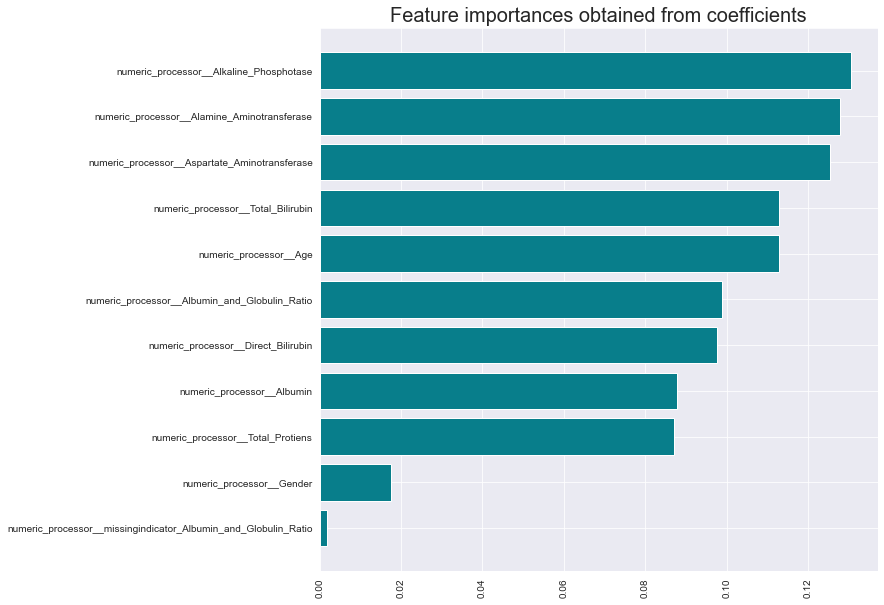

In [776]:
plt.figure(figsize = (10,10))
plt.barh(y=importances['Feature'], width=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [777]:
X_train_balanced.nunique().sort_values(ascending=False)

numeric_processor__Alkaline_Phosphotase                           411
numeric_processor__Aspartate_Aminotransferase                     340
numeric_processor__Alamine_Aminotransferase                       315
numeric_processor__Age                                            259
numeric_processor__Total_Bilirubin                                252
numeric_processor__Total_Protiens                                 247
numeric_processor__Albumin_and_Globulin_Ratio                     232
numeric_processor__Albumin                                        216
numeric_processor__Direct_Bilirubin                               174
numeric_processor__Gender                                           6
numeric_processor__missingindicator_Albumin_and_Globulin_Ratio      3
dtype: int64

#### From above we can see that 'numeric_processor__missingindicator_Albumin_and_Globulin_Ratio      ' and 'numeric_processor__Gender' are less important compared to other features

## Feature Selection

### Techniques for feature selection
1. Mutual Information - to get the feature importance 
2. Multicollinearity - to check and remove any highly correlated independent features
3. VarianceThreshold - To check and remove any low varinace continuous features

## Multicollinearity

### Correlation

In [778]:
train_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40,1
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50,1
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,1


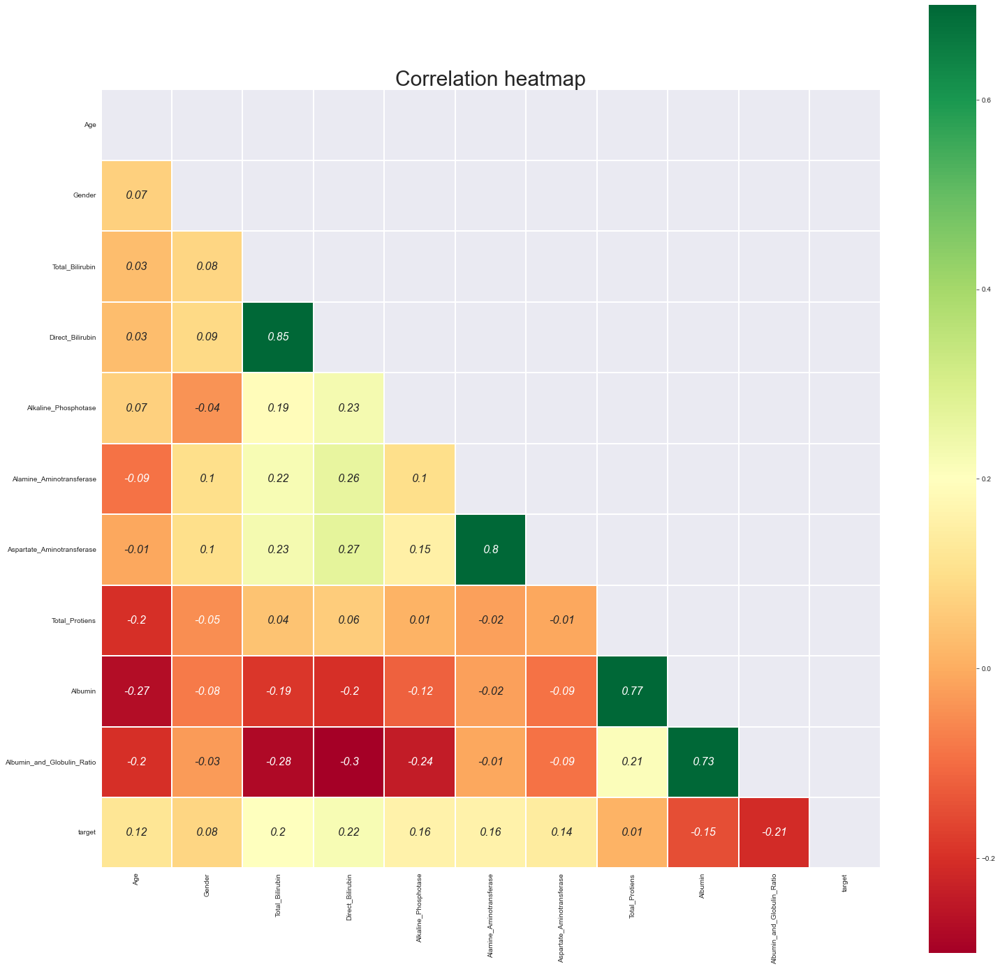

In [779]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df.corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df.corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

In [780]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [781]:
corr_features = correlation(X_train_balanced, 0.8)
print(len(set(corr_features)))
print(corr_features)

0
set()


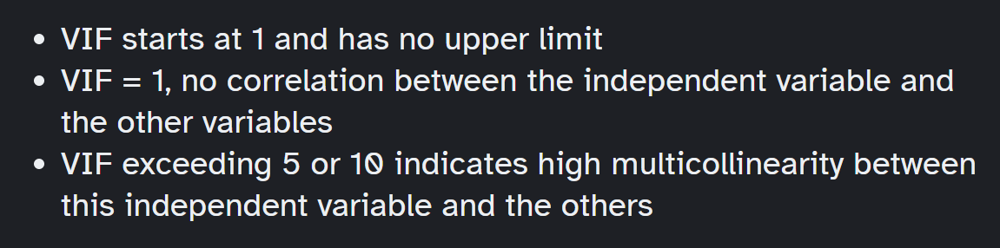

### Variance Inflation Factor (VIF)

https://www.analyticsvidhya.com/blog/2020/03/what-is-multicollinearity/

In [782]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.values, i) for i in range(len(X_train_balanced.columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
8,numeric_processor__Albumin,13.042296
7,numeric_processor__Total_Protiens,6.562941
9,numeric_processor__Albumin_and_Globulin_Ratio,5.215390
2,numeric_processor__Total_Bilirubin,2.980748
6,numeric_processor__Aspartate_Aminotransferase,2.954434
5,numeric_processor__Alamine_Aminotransferase,2.761370
3,numeric_processor__Direct_Bilirubin,2.454950
4,numeric_processor__Alkaline_Phosphotase,1.336244
0,numeric_processor__Age,1.110004
1,numeric_processor__Gender,1.098732


####  From above we can see 'numeric_processor__Albumin' have very high VIF value. so we can remove that feature

In [783]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.drop(['numeric_processor__Albumin'], axis = 1).columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.drop(['numeric_processor__Albumin'], axis = 1).values, i) for i in range(len(X_train_balanced.drop(['numeric_processor__Albumin'], axis = 1).columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
2,numeric_processor__Total_Bilirubin,2.973920
6,numeric_processor__Aspartate_Aminotransferase,2.827779
5,numeric_processor__Alamine_Aminotransferase,2.639849
3,numeric_processor__Direct_Bilirubin,2.454930
4,numeric_processor__Alkaline_Phosphotase,1.331932
8,numeric_processor__Albumin_and_Globulin_Ratio,1.246610
7,numeric_processor__Total_Protiens,1.151457
0,numeric_processor__Age,1.107848
1,numeric_processor__Gender,1.072307
9,numeric_processor__missingindicator_Albumin_an...,1.028154


In [784]:
vif_data.shape

(10, 2)

In [785]:
X_train_multi = X_train_balanced.drop(['numeric_processor__Albumin'], axis = 1)

In [786]:
X_val_multi = X_val_FE.drop(['numeric_processor__Albumin'], axis = 1)

In [787]:
X_test_multi = X_test_FE.drop(['numeric_processor__Albumin'], axis = 1)

In [788]:
X_train_multi

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,1.107900,-1.740279,-0.976668,-2.519903,-0.423727,-1.344496,-1.391813,0.172897,-0.117239,-0.084515
1,0.965753,0.574620,1.375701,0.957432,1.618286,0.638395,0.808109,0.957138,-0.569557,-0.084515
2,0.965753,0.574620,1.205014,0.893550,1.158251,0.576858,0.496143,0.411315,-0.222228,-0.084515
3,0.645567,0.574620,-0.005115,0.268249,-0.506761,-1.670444,-1.162848,0.172897,0.238671,-0.084515
4,1.513384,0.574620,0.845558,0.666881,-0.239786,-0.379802,0.376537,0.765636,-1.710359,-0.084515
...,...,...,...,...,...,...,...,...,...,...
619,-0.298871,0.574620,-0.224799,0.062595,-0.856115,-0.023073,-0.717368,0.049098,1.207116,-0.084515
620,-1.185204,0.574620,-0.443704,-0.050430,0.598726,0.563608,-0.018618,1.266530,-0.081095,-0.084515
621,-0.186493,0.574620,0.194891,0.315820,-0.226108,0.456405,0.339523,-0.652564,-0.122494,-0.084515
622,-1.446965,0.574620,0.205186,0.421895,-0.598599,-1.831066,-0.643402,1.419364,1.093018,-0.084515


In [789]:
model = RandomForestClassifier()
model.fit(X_train_multi,y_train_balanced)

RandomForestClassifier()

In [790]:
model.feature_names_in_

array(['numeric_processor__Age', 'numeric_processor__Gender',
       'numeric_processor__Total_Bilirubin',
       'numeric_processor__Direct_Bilirubin',
       'numeric_processor__Alkaline_Phosphotase',
       'numeric_processor__Alamine_Aminotransferase',
       'numeric_processor__Aspartate_Aminotransferase',
       'numeric_processor__Total_Protiens',
       'numeric_processor__Albumin_and_Globulin_Ratio',
       'numeric_processor__missingindicator_Albumin_and_Globulin_Ratio'],
      dtype=object)

In [791]:
y_train_pred = model.predict(X_train_multi)
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       312
           1       1.00      1.00      1.00       312

    accuracy                           1.00       624
   macro avg       1.00      1.00      1.00       624
weighted avg       1.00      1.00      1.00       624



In [792]:
y_val_pred = model.predict(X_val_multi)
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.60      0.83      0.70        29
           1       0.88      0.69      0.77        51

    accuracy                           0.74        80
   macro avg       0.74      0.76      0.73        80
weighted avg       0.78      0.74      0.74        80



#### From above we can observe that even though we removed 'numeric_processor__Albumin' feature there is no much impact on the validation accuracy. It went from 75 to 74.

### VarianceThreshold

In [793]:
continuous_features

['Age',
 'Total_Bilirubin',
 'Direct_Bilirubin',
 'Alkaline_Phosphotase',
 'Alamine_Aminotransferase',
 'Aspartate_Aminotransferase',
 'Total_Protiens',
 'Albumin',
 'Albumin_and_Globulin_Ratio']

In [794]:
# In this technique we will find the varince of all the features and we can remove the features which have low variance 
# by setting the threshold parameter

var_thres=VarianceThreshold()
var_thres.fit(X_train_balanced)

VarianceThreshold()

In [795]:
variances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'variance': var_thres.variances_
})
variances = variances.sort_values(by='variance', ascending=True)

In [796]:
variances

,Feature,variance
10,numeric_processor__missingindicator_Albumin_an...,0.802852
2,numeric_processor__Total_Bilirubin,0.826884
6,numeric_processor__Aspartate_Aminotransferase,0.857478
4,numeric_processor__Alkaline_Phosphotase,0.861311
5,numeric_processor__Alamine_Aminotransferase,0.882500
9,numeric_processor__Albumin_and_Globulin_Ratio,0.886030
7,numeric_processor__Total_Protiens,0.892169
8,numeric_processor__Albumin,0.908688
3,numeric_processor__Direct_Bilirubin,0.931862
0,numeric_processor__Age,0.993674


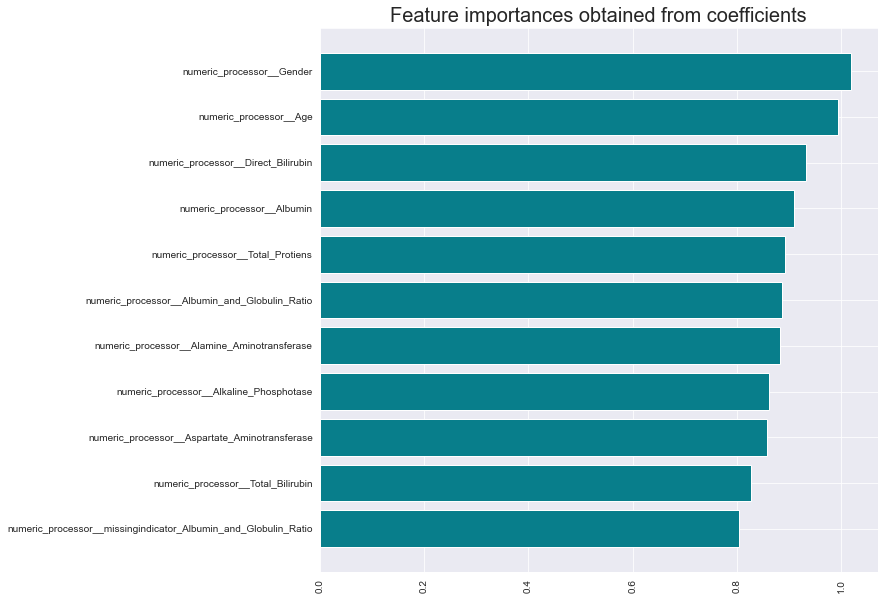

In [797]:
plt.figure(figsize = (10,10))
plt.barh(y=variances['Feature'], width=variances['variance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

### Mutual Information for Classification

In [798]:
mutual_info = mutual_info_classif(X_train_balanced, y_train_balanced)
mutual_info

array([0.16641397, 0.00880027, 0.24709919, 0.20079823, 0.08767138,
       0.16340663, 0.15954466, 0.1930031 , 0.17323235, 0.15740918,
       0.02546981])

In [799]:
mutual_info_df = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'MI': mutual_info
})
mutual_info_df = mutual_info_df.sort_values(by='MI', ascending=True)

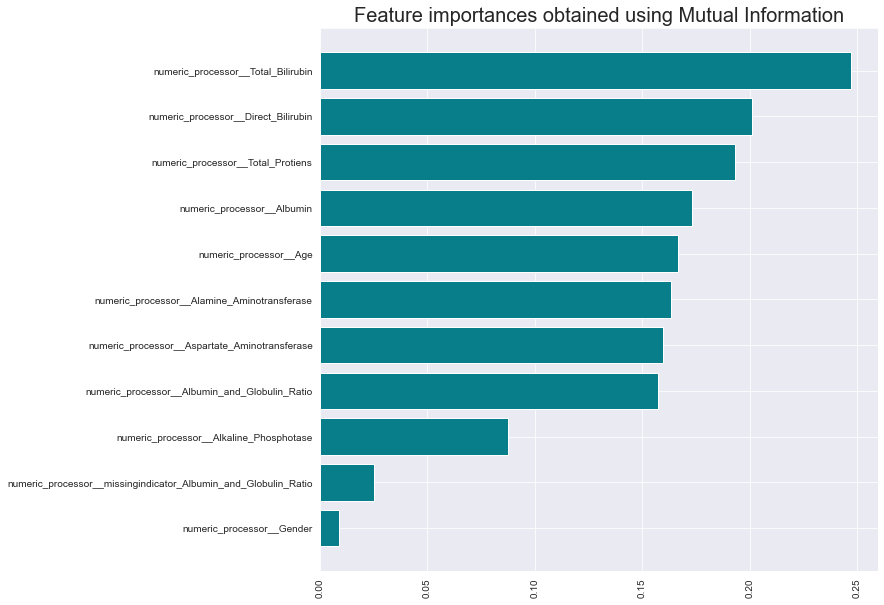

In [800]:
plt.figure(figsize = (10,10))
plt.barh(y=mutual_info_df['Feature'], width=mutual_info_df['MI'], color='#087E8B')
plt.title('Feature importances obtained using Mutual Information', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [801]:
mutual_info_df

,Feature,MI
1,numeric_processor__Gender,0.008800
10,numeric_processor__missingindicator_Albumin_an...,0.025470
4,numeric_processor__Alkaline_Phosphotase,0.087671
9,numeric_processor__Albumin_and_Globulin_Ratio,0.157409
6,numeric_processor__Aspartate_Aminotransferase,0.159545
5,numeric_processor__Alamine_Aminotransferase,0.163407
0,numeric_processor__Age,0.166414
8,numeric_processor__Albumin,0.173232
7,numeric_processor__Total_Protiens,0.193003
3,numeric_processor__Direct_Bilirubin,0.200798


In [802]:
mutual_info_df['Feature'].values[-7:].tolist()

['numeric_processor__Aspartate_Aminotransferase',
 'numeric_processor__Alamine_Aminotransferase',
 'numeric_processor__Age',
 'numeric_processor__Albumin',
 'numeric_processor__Total_Protiens',
 'numeric_processor__Direct_Bilirubin',
 'numeric_processor__Total_Bilirubin']

In [803]:
X_train_multi.columns.to_list()

['numeric_processor__Age',
 'numeric_processor__Gender',
 'numeric_processor__Total_Bilirubin',
 'numeric_processor__Direct_Bilirubin',
 'numeric_processor__Alkaline_Phosphotase',
 'numeric_processor__Alamine_Aminotransferase',
 'numeric_processor__Aspartate_Aminotransferase',
 'numeric_processor__Total_Protiens',
 'numeric_processor__Albumin_and_Globulin_Ratio',
 'numeric_processor__missingindicator_Albumin_and_Globulin_Ratio']

In [804]:
def find_common_elements(list1, list2):
    common_elements = []
    for item in list1:
        if item in list2:
            common_elements.append(item)
    return common_elements

In [805]:
find_common_elements(mutual_info_df['Feature'].values[-7:].tolist(),X_train_multi.columns.to_list())

['numeric_processor__Aspartate_Aminotransferase',
 'numeric_processor__Alamine_Aminotransferase',
 'numeric_processor__Age',
 'numeric_processor__Total_Protiens',
 'numeric_processor__Direct_Bilirubin',
 'numeric_processor__Total_Bilirubin']

#### From above we can see that 'numeric_processor__missingindicator_Albumin_and_Globulin_Ratio      ' and 'numeric_processor__Gender' are less important compared to other features. The same we found in Feature importance Section.

In [806]:
mutual_info_df['Feature'].values.tolist()

['numeric_processor__Gender',
 'numeric_processor__missingindicator_Albumin_and_Globulin_Ratio',
 'numeric_processor__Alkaline_Phosphotase',
 'numeric_processor__Albumin_and_Globulin_Ratio',
 'numeric_processor__Aspartate_Aminotransferase',
 'numeric_processor__Alamine_Aminotransferase',
 'numeric_processor__Age',
 'numeric_processor__Albumin',
 'numeric_processor__Total_Protiens',
 'numeric_processor__Direct_Bilirubin',
 'numeric_processor__Total_Bilirubin']

In [807]:
X_train_balanced.shape

(624, 11)

In [808]:
MI_Features = ['numeric_processor__Alkaline_Phosphotase','numeric_processor__Aspartate_Aminotransferase',
               'numeric_processor__Age','numeric_processor__Total_Protiens','numeric_processor__Alamine_Aminotransferase',
               'numeric_processor__Albumin_and_Globulin_Ratio','numeric_processor__Direct_Bilirubin',
               'numeric_processor__Total_Bilirubin']

In [809]:
X_train_balanced[MI_Features]

,numeric_processor__Alkaline_Phosphotase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Age,numeric_processor__Total_Protiens,numeric_processor__Alamine_Aminotransferase,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__Direct_Bilirubin,numeric_processor__Total_Bilirubin
0,-0.423727,-1.391813,1.107900,0.172897,-1.344496,-0.117239,-2.519903,-0.976668
1,1.618286,0.808109,0.965753,0.957138,0.638395,-0.569557,0.957432,1.375701
2,1.158251,0.496143,0.965753,0.411315,0.576858,-0.222228,0.893550,1.205014
3,-0.506761,-1.162848,0.645567,0.172897,-1.670444,0.238671,0.268249,-0.005115
4,-0.239786,0.376537,1.513384,0.765636,-0.379802,-1.710359,0.666881,0.845558
...,...,...,...,...,...,...,...,...
619,-0.856115,-0.717368,-0.298871,0.049098,-0.023073,1.207116,0.062595,-0.224799
620,0.598726,-0.018618,-1.185204,1.266530,0.563608,-0.081095,-0.050430,-0.443704
621,-0.226108,0.339523,-0.186493,-0.652564,0.456405,-0.122494,0.315820,0.194891
622,-0.598599,-0.643402,-1.446965,1.419364,-1.831066,1.093018,0.421895,0.205186


In [810]:
model = RandomForestClassifier()
model.fit(X_train_balanced[MI_Features],y_train_balanced)

RandomForestClassifier()

In [811]:
model.feature_names_in_

array(['numeric_processor__Alkaline_Phosphotase',
       'numeric_processor__Aspartate_Aminotransferase',
       'numeric_processor__Age', 'numeric_processor__Total_Protiens',
       'numeric_processor__Alamine_Aminotransferase',
       'numeric_processor__Albumin_and_Globulin_Ratio',
       'numeric_processor__Direct_Bilirubin',
       'numeric_processor__Total_Bilirubin'], dtype=object)

In [812]:
y_train_pred = model.predict(X_train_balanced[MI_Features])
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       312
           1       1.00      1.00      1.00       312

    accuracy                           1.00       624
   macro avg       1.00      1.00      1.00       624
weighted avg       1.00      1.00      1.00       624



In [813]:
y_val_pred = model.predict(X_val_FE[MI_Features])
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.63      0.76      0.69        29
           1       0.84      0.75      0.79        51

    accuracy                           0.75        80
   macro avg       0.74      0.75      0.74        80
weighted avg       0.77      0.75      0.75        80



#### From above we can observe that even though we removed 'numeric_processor__Albumin','numeric_processor__Gender' and 'numeric_processor__missingindicator_Albumin_and_Globulin_Ratio' feature there is no much impact on the validation accuracy. It went from 75 to 73.

## PCA

In [814]:
# PCA can effectively eliminate multicollinearity between features. So we don't need to worry about it.

In [815]:
X_train_balanced

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,1.107900,-1.740279,-0.976668,-2.519903,-0.423727,-1.344496,-1.391813,0.172897,0.219265,-0.117239,-0.084515
1,0.965753,0.574620,1.375701,0.957432,1.618286,0.638395,0.808109,0.957138,0.130220,-0.569557,-0.084515
2,0.965753,0.574620,1.205014,0.893550,1.158251,0.576858,0.496143,0.411315,0.219265,-0.222228,-0.084515
3,0.645567,0.574620,-0.005115,0.268249,-0.506761,-1.670444,-1.162848,0.172897,0.304627,0.238671,-0.084515
4,1.513384,0.574620,0.845558,0.666881,-0.239786,-0.379802,0.376537,0.765636,-0.874329,-1.710359,-0.084515
...,...,...,...,...,...,...,...,...,...,...,...
619,-0.298871,0.574620,-0.224799,0.062595,-0.856115,-0.023073,-0.717368,0.049098,0.707319,1.207116,-0.084515
620,-1.185204,0.574620,-0.443704,-0.050430,0.598726,0.563608,-0.018618,1.266530,0.677842,-0.081095,-0.084515
621,-0.186493,0.574620,0.194891,0.315820,-0.226108,0.456405,0.339523,-0.652564,-0.495911,-0.122494,-0.084515
622,-1.446965,0.574620,0.205186,0.421895,-0.598599,-1.831066,-0.643402,1.419364,1.864177,1.093018,-0.084515


In [816]:
# Use components such that 95% of variance is retained

pca = PCA(0.95)
X_train_PCA = pca.fit_transform(X_train_balanced)
X_train_PCA.shape

(624, 8)

In [817]:
pca.explained_variance_ratio_

array([0.26364707, 0.20005234, 0.11409518, 0.10590016, 0.08068134,
       0.0732074 , 0.06877691, 0.05157816])

In [818]:
pca.n_components_

8

In [819]:
X_train_PCA

array([[-2.59034509,  1.55653397,  0.14955477, ...,  0.87607058,
        -0.5881125 ,  0.26980998],
       [ 2.5615359 , -0.9977715 , -0.93641637, ...,  0.63816129,
        -1.18108822, -0.14508345],
       [ 2.0886238 , -0.72673344, -0.99963695, ...,  0.59325544,
        -0.66951866, -0.32125684],
       ...,
       [ 1.13156673,  0.35157228,  0.22096044, ..., -0.2014046 ,
         0.42808187,  0.02868676],
       [-1.67315926, -2.19249602, -0.75913416, ..., -1.37676264,
        -0.51610004, -0.11655049],
       [-0.94733891,  0.61682859, -1.64408364, ...,  0.08897076,
         0.91862365, -0.41513059]])

In [820]:
model = RandomForestClassifier()
model.fit(X_train_PCA,y_train_balanced)

RandomForestClassifier()

In [821]:
y_train_pred = model.predict(X_train_PCA)
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       312
           1       1.00      1.00      1.00       312

    accuracy                           1.00       624
   macro avg       1.00      1.00      1.00       624
weighted avg       1.00      1.00      1.00       624



In [822]:
X_val_PCA = pca.transform(X_val_FE)

In [823]:
y_val_pred = model.predict(X_val_PCA)
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.62      0.62      0.62        29
           1       0.78      0.78      0.78        51

    accuracy                           0.73        80
   macro avg       0.70      0.70      0.70        80
weighted avg       0.72      0.72      0.72        80



## Feature Extraction for better performance

#### From above we can see that the max validation accuracy that we acheived is 75%
#### By Feature selection techniques we got rid of 3 non-important features and the validation accuracy reduced to 73%

#### So we will extract few features from existing data to get better performace

In [824]:
train_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40,1
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50,1
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,1


Target :  1


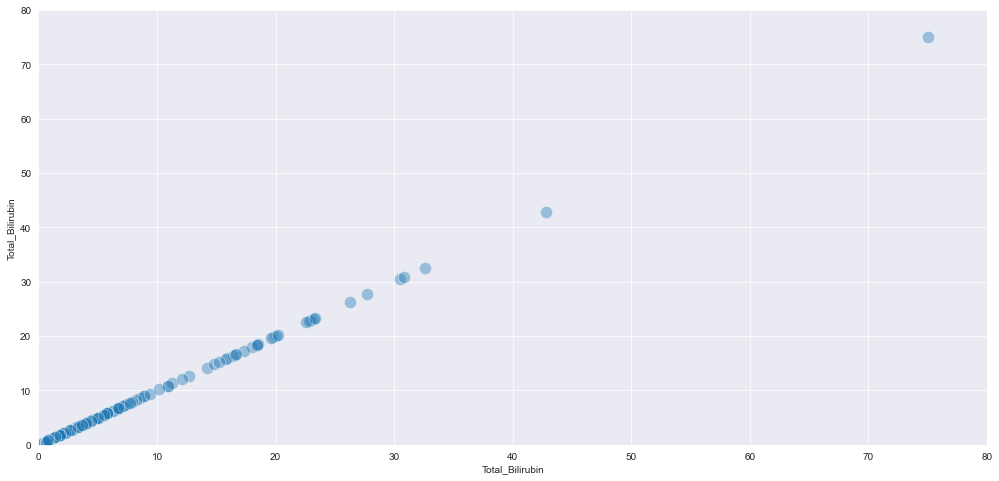

Target :  0


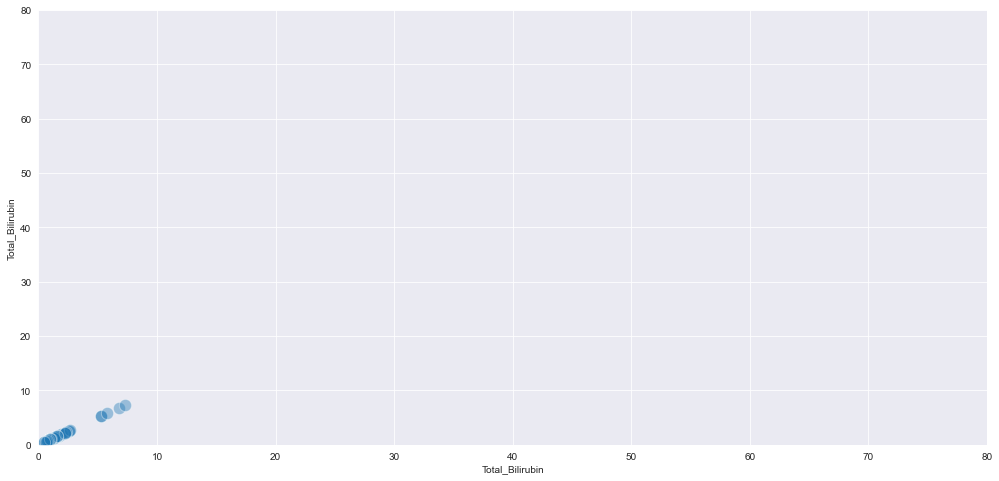

In [825]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Total_Bilirubin',y='Total_Bilirubin',alpha=0.4,s=150)
    plt.xlabel('Total_Bilirubin')
    plt.ylabel('Total_Bilirubin')
    plt.xlim(0,80)
    plt.ylim(0,80)
    plt.show()

In [826]:
# From above we can see that if the Total 'Total_Bilirubin' values is less than 10 then there is a very high chance of not a having Liver dease
# So we will create new binary feature form 'Total_Bilirubin' 1 if value is less than 10 else 0
# similarly we will extract features as much as posssible becoz we are unable to get the good accuracy with default features

Target :  1


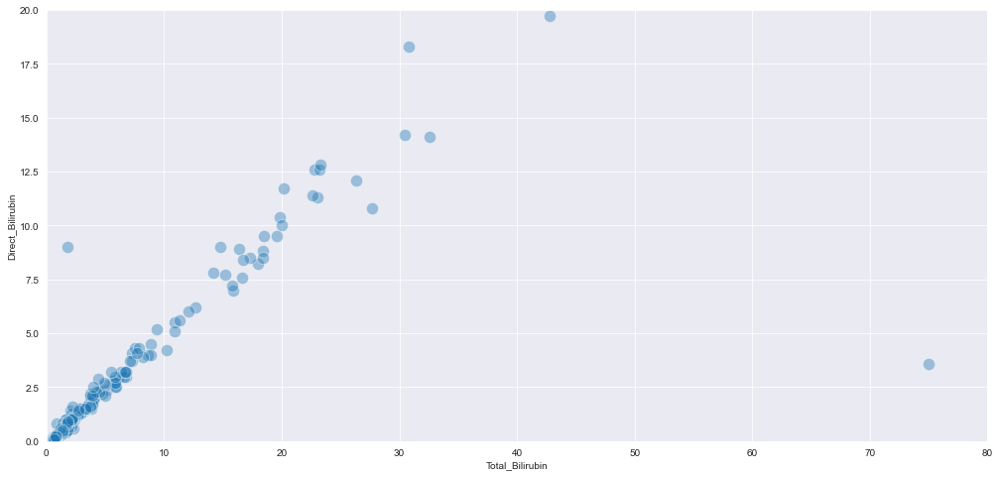

Target :  0


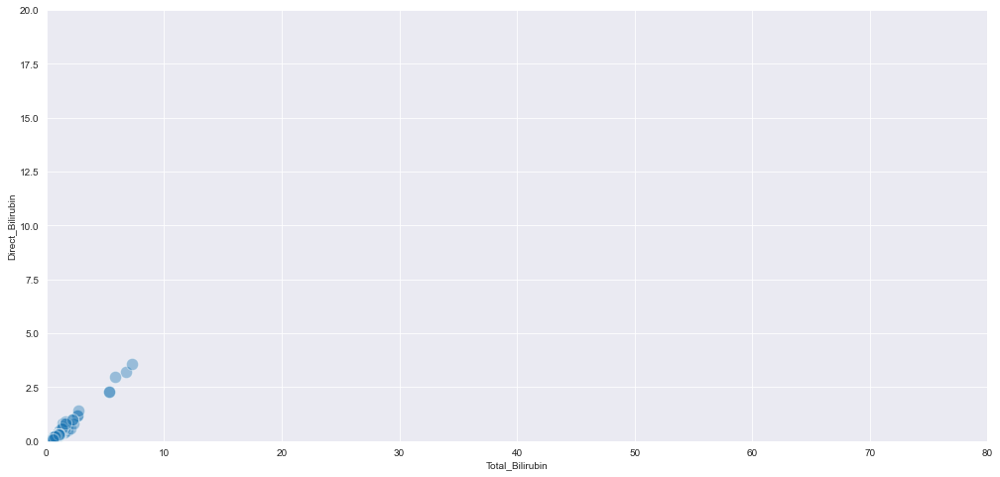

In [827]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Total_Bilirubin',y='Direct_Bilirubin',alpha=0.4,s=150)
    plt.xlabel('Total_Bilirubin')
    plt.ylabel('Direct_Bilirubin')
    plt.xlim(0,80)
    plt.ylim(0,20)
    plt.show()

In [828]:
# From above we can see that if the Total 'Total_Bilirubin' values is less than 10 and 'Direct_Bilirubin' is less than 5 
# then there is a very high chance of not having a Liver dease

Target :  1


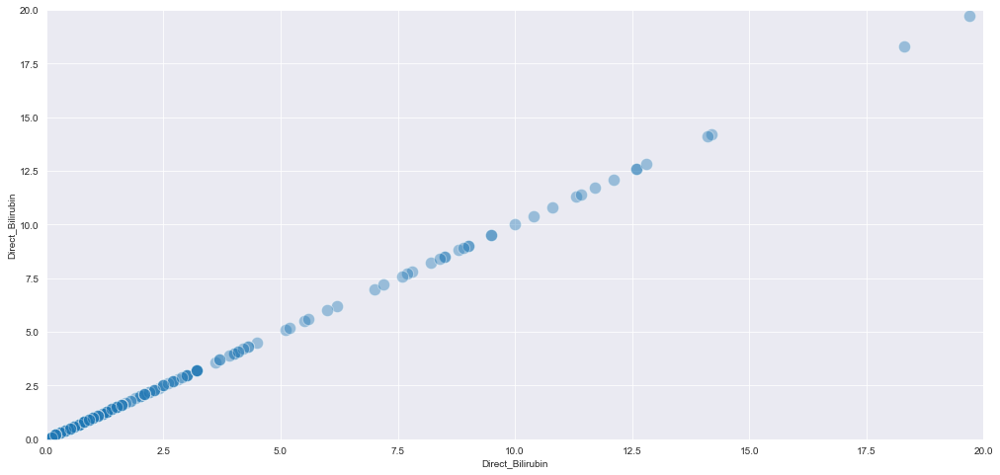

Target :  0


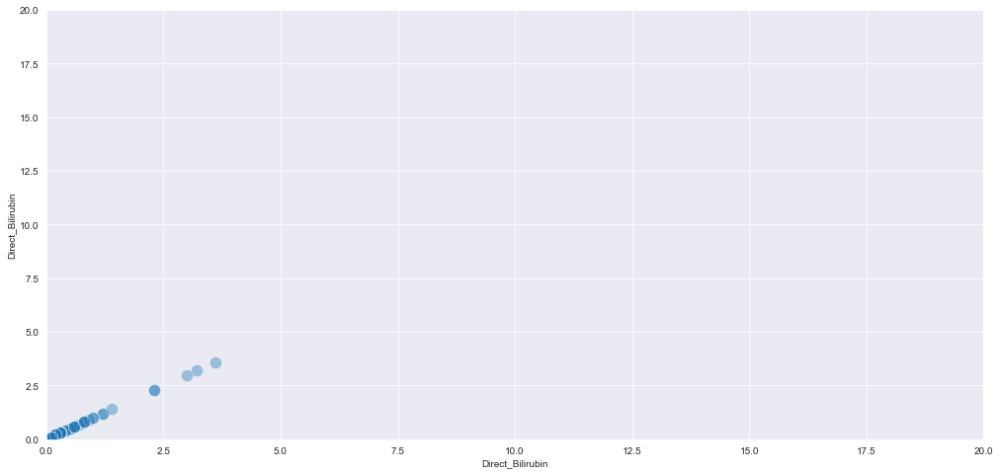

In [829]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Direct_Bilirubin',y='Direct_Bilirubin',alpha=0.4,s=150)
    plt.xlabel('Direct_Bilirubin')
    plt.ylabel('Direct_Bilirubin')
    plt.xlim(0,20)
    plt.ylim(0,20)
    plt.show()

In [830]:
# From above we can see that if the 'Direct_Bilirubin' is less than 5 then there is a very high chance of not having a Liver dease

Target :  1


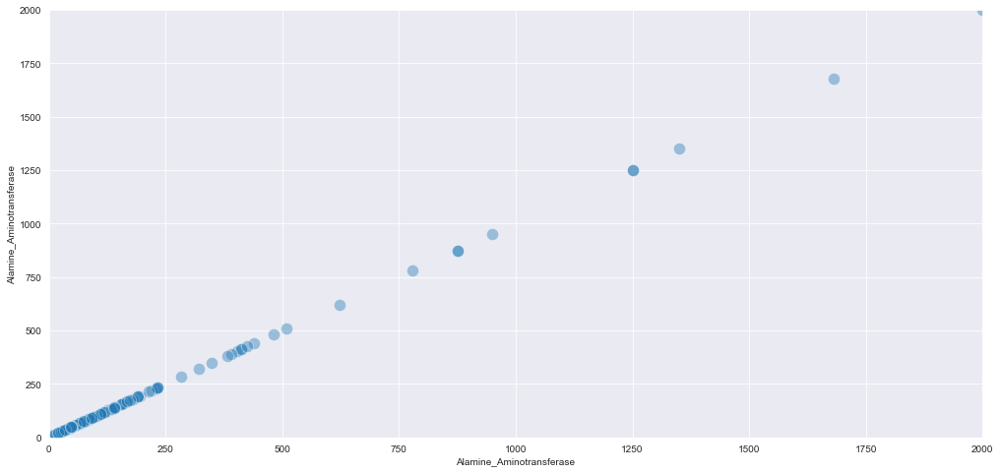

Target :  0


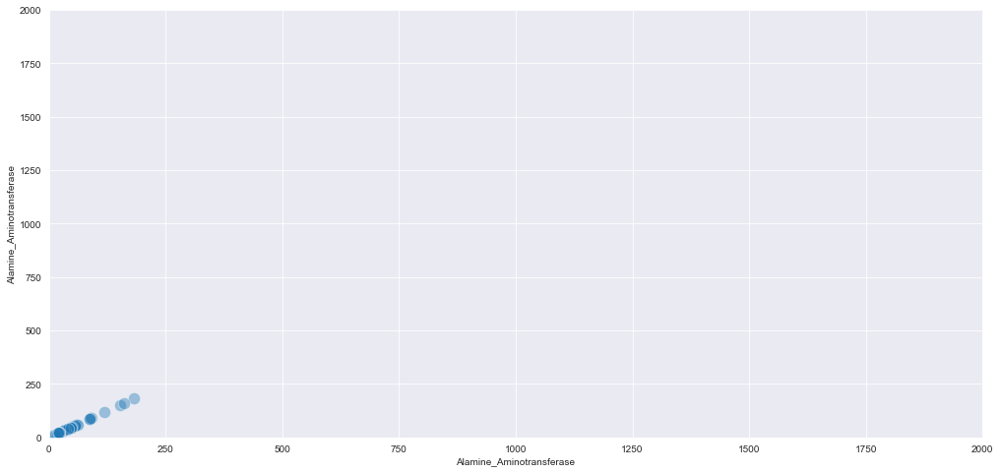

In [831]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Alamine_Aminotransferase',y='Alamine_Aminotransferase',alpha=0.4,s=150)
    plt.xlabel('Alamine_Aminotransferase')
    plt.ylabel('Alamine_Aminotransferase')
    plt.xlim(0,2000)
    plt.ylim(0,2000)
    plt.show()

In [832]:
# From above we can see that if the 'Alamine_Aminotransferase' is less than 250 then there is a very high chance of not having a Liver dease

Target :  1


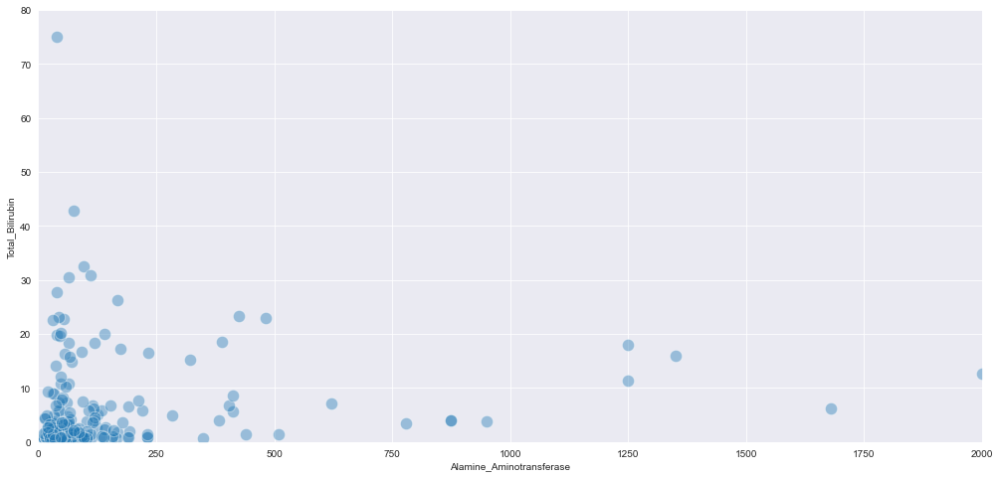

Target :  0


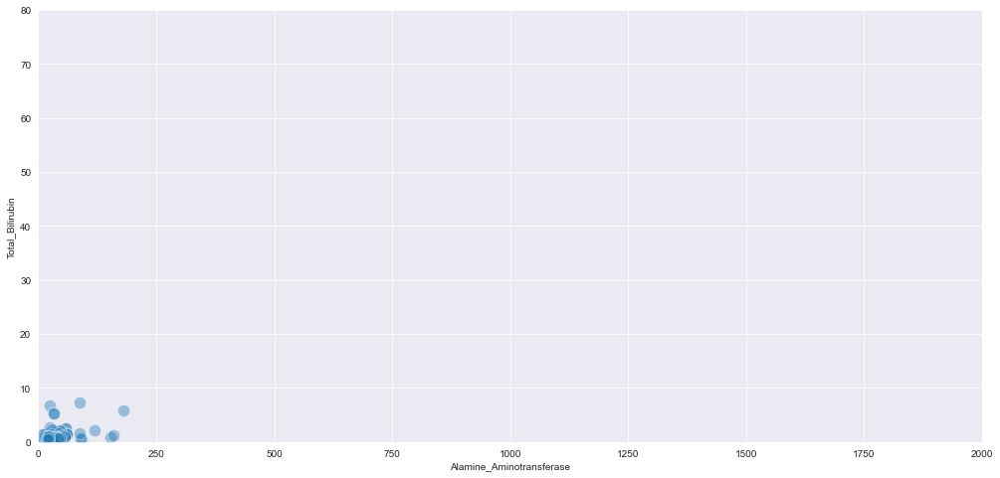

In [833]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Alamine_Aminotransferase',y='Total_Bilirubin',alpha=0.4,s=150)
    plt.xlabel('Alamine_Aminotransferase')
    plt.ylabel('Total_Bilirubin')
    plt.xlim(0,2000)
    plt.ylim(0,80)
    plt.show()

In [834]:
# From above we can see that if the Total 'Alamine_Aminotransferase' values is less than 250 and 'Total_Bilirubin' is less than 10 
# then there is a very high chance of not having a Liver dease

Target :  1


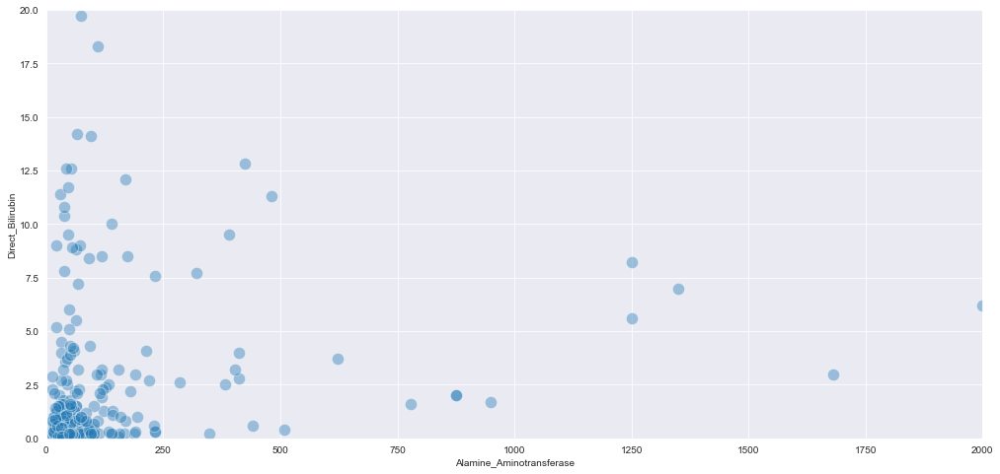

Target :  0


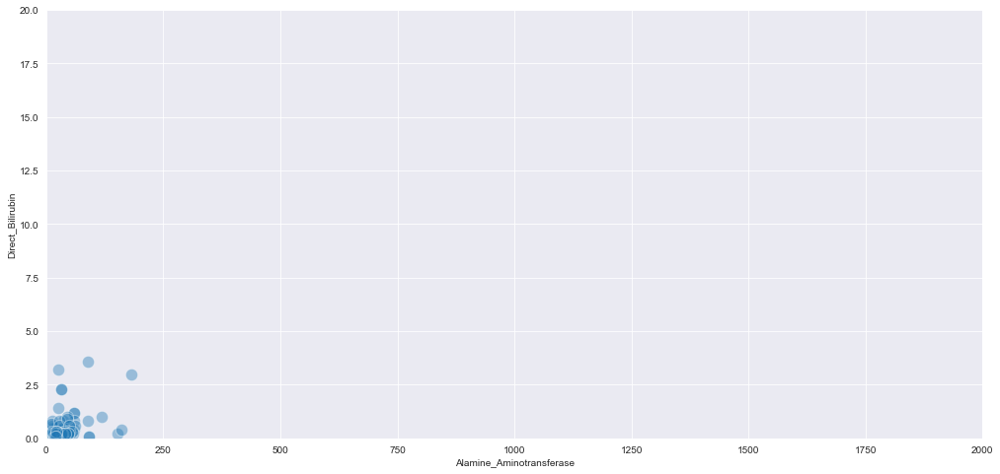

In [835]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Alamine_Aminotransferase',y='Direct_Bilirubin',alpha=0.4,s=150)
    plt.xlabel('Alamine_Aminotransferase')
    plt.ylabel('Direct_Bilirubin')
    plt.xlim(0,2000)
    plt.ylim(0,20)
    plt.show()

In [836]:
# From above we can see that if the Total 'Alamine_Aminotransferase' values is less than 250 and 'Direct_Bilirubin' is less than 5 
# then there is a very high chance of not having a Liver dease

Target :  1


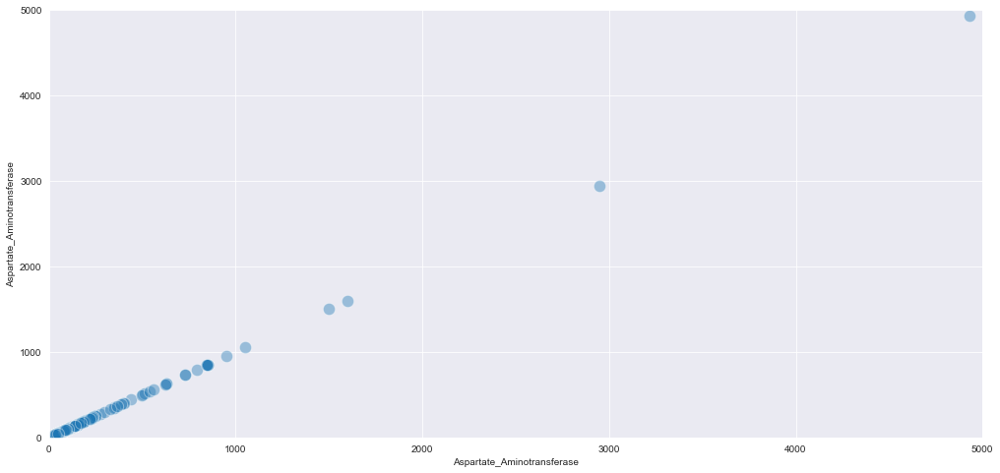

Target :  0


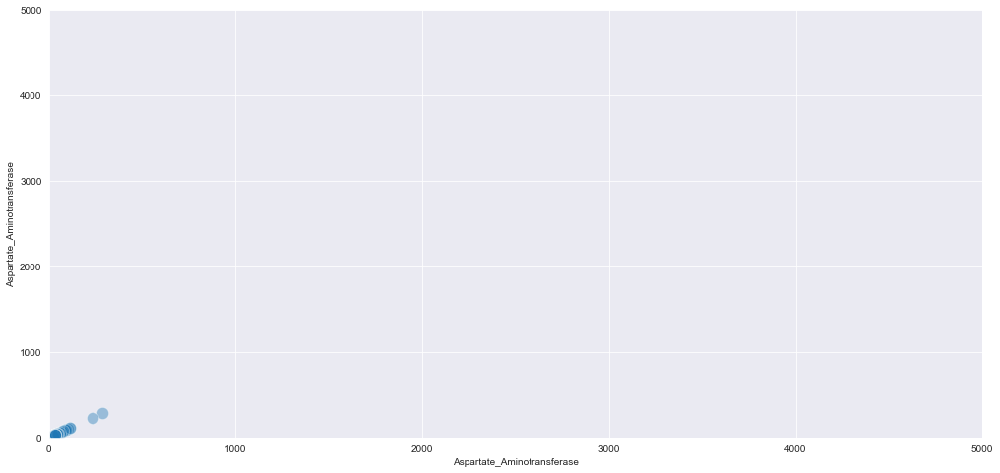

In [837]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Aspartate_Aminotransferase',y='Aspartate_Aminotransferase',alpha=0.4,s=150)
    plt.xlabel('Aspartate_Aminotransferase')
    plt.ylabel('Aspartate_Aminotransferase')
    plt.xlim(0,5000)
    plt.ylim(0,5000)
    plt.show()

In [838]:
# From above we can see that if the 'Aspartate_Aminotransferase' is less than 500 then there is a very high chance of not having a Liver dease

Target :  1


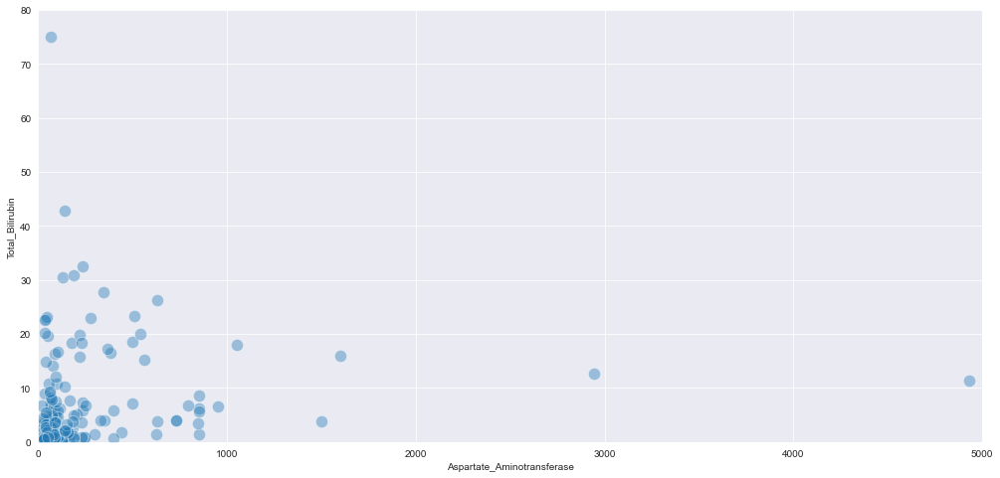

Target :  0


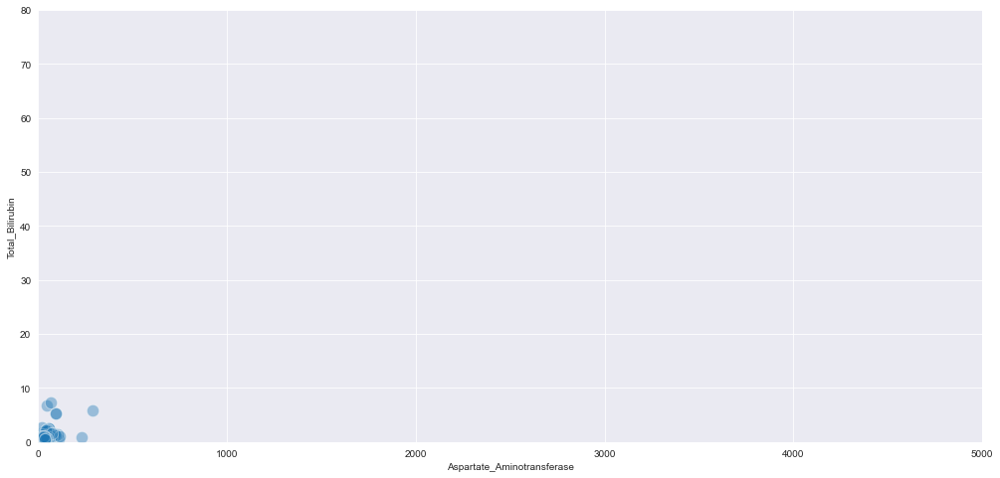

In [839]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Aspartate_Aminotransferase',y='Total_Bilirubin',alpha=0.4,s=150)
    plt.xlabel('Aspartate_Aminotransferase')
    plt.ylabel('Total_Bilirubin')
    plt.xlim(0,5000)
    plt.ylim(0,80)
    plt.show()

In [840]:
# From above we can see that if the Total 'Aspartate_Aminotransferase' values is less than 500 and 'Total_Bilirubin' is less than 10 
# then there is a very high chance of not having a Liver dease

Target :  1


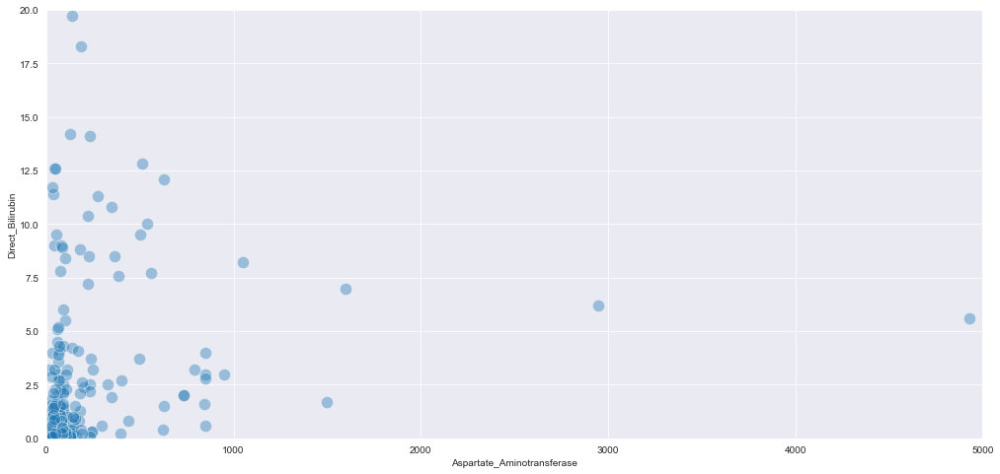

Target :  0


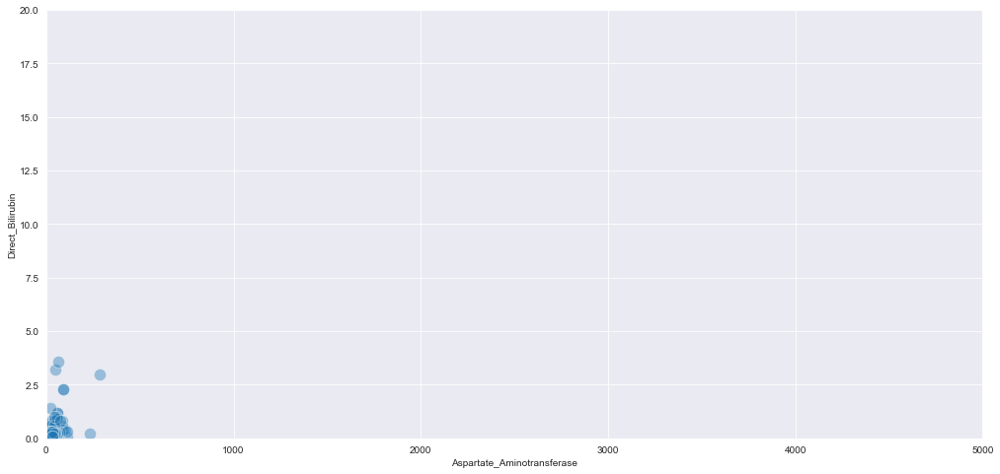

In [841]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Aspartate_Aminotransferase',y='Direct_Bilirubin',alpha=0.4,s=150)
    plt.xlabel('Aspartate_Aminotransferase')
    plt.ylabel('Direct_Bilirubin')
    plt.xlim(0,5000)
    plt.ylim(0,20)
    plt.show()

In [842]:
# From above we can see that if the Total 'Aspartate_Aminotransferase' values is less than 500 and 'Direct_Bilirubin' is less than 5 
# then there is a very high chance of not having a Liver dease

Target :  1


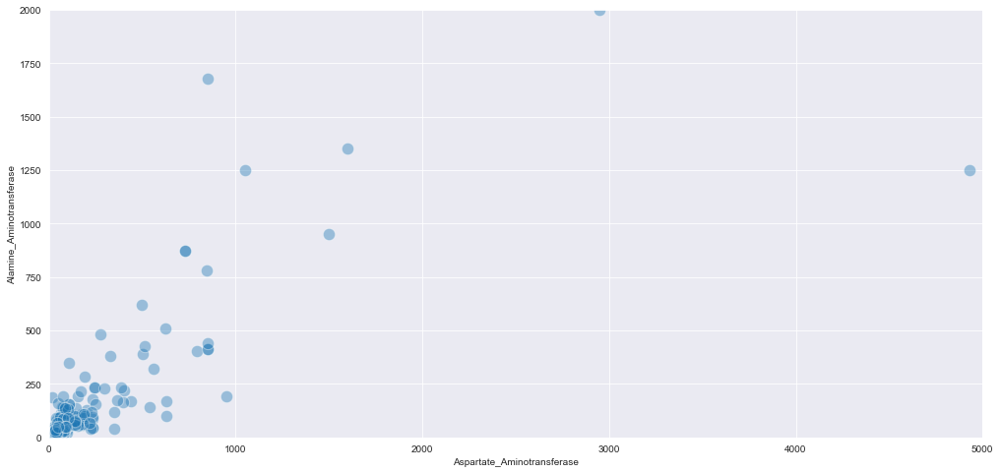

Target :  0


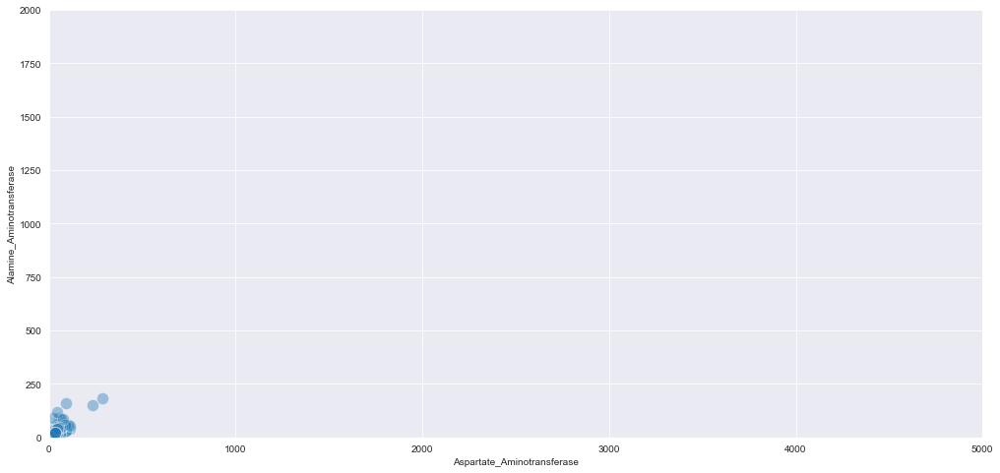

In [843]:
for i in train_df['target'].unique():
    print('Target : ',i)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df[train_df['target']==i], x='Aspartate_Aminotransferase',y='Alamine_Aminotransferase',alpha=0.4,s=150)
    plt.xlabel('Aspartate_Aminotransferase')
    plt.ylabel('Alamine_Aminotransferase')
    plt.xlim(0,5000)
    plt.ylim(0,2000)
    plt.show()

In [844]:
# From above we can see that if the Total 'Aspartate_Aminotransferase' values is less than 500 and 'Alamine_Aminotransferase' is less than 250 
# then there is a very high chance of not having a Liver dease

In [845]:
train_df = pd.read_csv('../Data/Liver/train_df.csv')
val_df = pd.read_csv('../Data/Liver/val_df.csv')
test_df = pd.read_csv('../Data/Liver/test_df.csv')

In [846]:
train_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40,1
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50,1
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,1


In [847]:
train_df['Total_Bilirubin_morethan_10'] = [1 if x > 10 else 0 for x in train_df['Total_Bilirubin']]
train_df['Direct_Bilirubin_morethan_5'] = [1 if x > 10 else 0 for x in train_df['Direct_Bilirubin']]
train_df['Alamine_Aminotransferase_morethan_250'] = [1 if x > 10 else 0 for x in train_df['Alamine_Aminotransferase']]
train_df['Aspartate_Aminotransferase_morethan_500'] = [1 if x > 10 else 0 for x in train_df['Aspartate_Aminotransferase']]

In [848]:
train_df['Total_Direct_Bilirubin'] = [1 if row['Total_Bilirubin'] > 10 and row['Direct_Bilirubin'] > 5 else 0 for index, row in train_df.iterrows()]
train_df['Alamine_Total'] = [1 if row['Alamine_Aminotransferase'] > 250 and row['Total_Bilirubin'] > 10 else 0 for index, row in train_df.iterrows()]
train_df['Alamine_Direct'] = [1 if row['Alamine_Aminotransferase'] > 250 and row['Direct_Bilirubin'] > 5 else 0 for index, row in train_df.iterrows()]
train_df['Aspartate_Total'] = [1 if row['Aspartate_Aminotransferase'] > 500 and row['Total_Bilirubin'] > 10 else 0 for index, row in train_df.iterrows()]
train_df['Aspartate_Direct'] = [1 if row['Aspartate_Aminotransferase'] > 500 and row['Direct_Bilirubin'] > 5 else 0 for index, row in train_df.iterrows()]
train_df['Aspartate_Alamine'] = [1 if row['Aspartate_Aminotransferase'] > 500 and row['Alamine_Aminotransferase'] > 250 else 0 for index, row in train_df.iterrows()]

In [849]:
val_df['Total_Bilirubin_morethan_10'] = [1 if x > 10 else 0 for x in val_df['Total_Bilirubin']]
val_df['Direct_Bilirubin_morethan_5'] = [1 if x > 10 else 0 for x in val_df['Direct_Bilirubin']]
val_df['Alamine_Aminotransferase_morethan_250'] = [1 if x > 10 else 0 for x in val_df['Alamine_Aminotransferase']]
val_df['Aspartate_Aminotransferase_morethan_500'] = [1 if x > 10 else 0 for x in val_df['Aspartate_Aminotransferase']]
val_df['Total_Direct_Bilirubin'] = [1 if row['Total_Bilirubin'] > 10 and row['Direct_Bilirubin'] > 5 else 0 for index, row in val_df.iterrows()]
val_df['Alamine_Total'] = [1 if row['Alamine_Aminotransferase'] > 250 and row['Total_Bilirubin'] > 10 else 0 for index, row in val_df.iterrows()]
val_df['Alamine_Direct'] = [1 if row['Alamine_Aminotransferase'] > 250 and row['Direct_Bilirubin'] > 5 else 0 for index, row in val_df.iterrows()]
val_df['Aspartate_Total'] = [1 if row['Aspartate_Aminotransferase'] > 500 and row['Total_Bilirubin'] > 10 else 0 for index, row in val_df.iterrows()]
val_df['Aspartate_Direct'] = [1 if row['Aspartate_Aminotransferase'] > 500 and row['Direct_Bilirubin'] > 5 else 0 for index, row in val_df.iterrows()]
val_df['Aspartate_Alamine'] = [1 if row['Aspartate_Aminotransferase'] > 500 and row['Alamine_Aminotransferase'] > 250 else 0 for index, row in val_df.iterrows()]

In [850]:
train_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target,Total_Bilirubin_morethan_10,Direct_Bilirubin_morethan_5,Alamine_Aminotransferase_morethan_250,Aspartate_Aminotransferase_morethan_500,Total_Direct_Bilirubin,Alamine_Total,Alamine_Direct,Aspartate_Total,Aspartate_Direct,Aspartate_Alamine
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1,0,0,1,1,0,0,0,0,0,0
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1,1,0,1,1,1,0,0,0,0,0
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1,0,0,1,1,0,0,0,0,0,0
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1,0,0,1,1,0,0,0,0,0,0
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,1,0,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40,1,0,0,1,1,0,0,0,0,0,0
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50,1,1,0,1,1,1,0,0,0,0,0
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0,0,0,1,1,0,0,0,0,0,0
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,1,0,0,1,1,0,0,0,0,0,0


In [851]:
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [852]:
X_val = val_df.drop('target',axis=1)
y_val = val_df['target']

In [853]:
X_test = test_df.drop('target',axis=1)
y_test = test_df['target']

In [854]:
X_train

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Total_Bilirubin_morethan_10,Direct_Bilirubin_morethan_5,Alamine_Aminotransferase_morethan_250,Aspartate_Aminotransferase_morethan_500,Total_Direct_Bilirubin,Alamine_Total,Alamine_Direct,Aspartate_Total,Aspartate_Direct,Aspartate_Alamine
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,0,0,1,1,0,0,0,0,0,0
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1,0,1,1,1,0,0,0,0,0
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,0,0,1,1,0,0,0,0,0,0
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,0,0,1,1,0,0,0,0,0,0
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,0,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40,0,0,1,1,0,0,0,0,0,0
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50,1,0,1,1,1,0,0,0,0,0
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37,0,0,1,1,0,0,0,0,0,0
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10,0,0,1,1,0,0,0,0,0,0


In [855]:
numerical_features = ['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin','Alkaline_Phosphotase', 'Alamine_Aminotransferase',
                      'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin','Albumin_and_Globulin_Ratio', 
                      'Total_Bilirubin_morethan_10','Direct_Bilirubin_morethan_5', 'Alamine_Aminotransferase_morethan_250',
                      'Aspartate_Aminotransferase_morethan_500', 'Total_Direct_Bilirubin','Alamine_Total', 'Alamine_Direct', 
                      'Aspartate_Total','Aspartate_Direct', 'Aspartate_Alamine']

numerical_features

['Age',
 'Gender',
 'Total_Bilirubin',
 'Direct_Bilirubin',
 'Alkaline_Phosphotase',
 'Alamine_Aminotransferase',
 'Aspartate_Aminotransferase',
 'Total_Protiens',
 'Albumin',
 'Albumin_and_Globulin_Ratio',
 'Total_Bilirubin_morethan_10',
 'Direct_Bilirubin_morethan_5',
 'Alamine_Aminotransferase_morethan_250',
 'Aspartate_Aminotransferase_morethan_500',
 'Total_Direct_Bilirubin',
 'Alamine_Total',
 'Alamine_Direct',
 'Aspartate_Total',
 'Aspartate_Direct',
 'Aspartate_Alamine']

In [856]:
categorical_features

Index([], dtype='object')

In [857]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False,min_frequency=0.01,max_categories=15))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",StandardScaler())])

In [858]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Age', 'Gender',
                                                   'Total_Bilirubin',
                                                   'Direct_Bilirubin',
                                                   'Alkaline_Phosphotase',
                                                   'Alamine_Aminotransferase...
                                                   'Aspartate_Total',
                                                   'Aspartate_Direct',
                                                   'Aspartate_Alamine']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  Index([], dtype='object'))])),
                ('scaler', StandardScaler())])

In [859]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [860]:
X_train_FE

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__Total_Bilirubin_morethan_10,numeric_processor__Direct_Bilirubin_morethan_5,numeric_processor__Alamine_Aminotransferase_morethan_250,numeric_processor__Aspartate_Aminotransferase_morethan_500,numeric_processor__Total_Direct_Bilirubin,numeric_processor__Alamine_Total,numeric_processor__Alamine_Direct,numeric_processor__Aspartate_Total,numeric_processor__Aspartate_Direct,numeric_processor__Aspartate_Alamine,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,1.107900,-1.740279,-0.976668,-2.519903,-0.423727,-1.344496,-1.391813,0.172897,0.219265,-0.117239,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
1,0.965753,0.574620,1.375701,0.957432,1.618286,0.638395,0.808109,0.957138,0.130220,-0.569557,3.329522,-0.178065,0.068925,0.0,3.437758,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
2,0.965753,0.574620,1.205014,0.893550,1.158251,0.576858,0.496143,0.411315,0.219265,-0.222228,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
3,0.645567,0.574620,-0.005115,0.268249,-0.506761,-1.670444,-1.162848,0.172897,0.304627,0.238671,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
4,1.513384,0.574620,0.845558,0.666881,-0.239786,-0.379802,0.376537,0.765636,-0.874329,-1.710359,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,-0.760683,0.574620,0.812229,0.633431,1.418135,0.401899,0.699758,-0.251114,-1.463483,-1.710359,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
419,-0.760683,0.574620,1.414548,0.975268,1.226216,0.332960,0.752723,0.015836,-0.874329,-1.337936,3.329522,-0.178065,0.068925,0.0,3.437758,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
420,0.782391,0.574620,-2.439343,-2.519903,1.188398,-0.957853,-0.265873,-0.563348,-1.932781,-2.069019,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
421,-0.256669,0.574620,-1.587288,-2.519903,-2.157611,-0.029685,-0.398587,-0.445706,0.130220,0.600725,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515


In [861]:
y_train.value_counts()

1    312
0    111
Name: target, dtype: int64

In [862]:
X_val

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Total_Bilirubin_morethan_10,Direct_Bilirubin_morethan_5,Alamine_Aminotransferase_morethan_250,Aspartate_Aminotransferase_morethan_500,Total_Direct_Bilirubin,Alamine_Total,Alamine_Direct,Aspartate_Total,Aspartate_Direct,Aspartate_Alamine
0,23,1,1.0,0.3,212,41,80,6.2,3.1,1.0,0,0,1,1,0,0,0,0,0,0
1,42,1,0.7,0.2,197,64,33,5.8,2.4,0.7,0,0,1,1,0,0,0,0,0,0
2,27,1,0.7,0.2,243,21,23,5.3,2.3,0.7,0,0,1,1,0,0,0,0,0,0
3,35,1,2.0,1.1,226,33,135,6.0,2.7,0.8,0,0,1,1,0,0,0,0,0,0
4,49,1,1.0,0.3,230,48,58,8.4,4.2,1.0,0,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,28,0,1.0,0.3,90,18,108,6.8,3.1,0.8,0,0,1,1,0,0,0,0,0,0
76,38,1,1.0,0.3,216,21,24,7.3,4.4,1.5,0,0,1,1,0,0,0,0,0,0
77,44,0,1.9,0.6,298,378,602,6.6,3.3,1.0,0,0,1,1,0,0,0,0,0,1
78,50,0,1.7,0.6,430,28,32,6.8,3.5,1.0,0,0,1,1,0,0,0,0,0,0


In [863]:
y_val

0     1
1     0
2     0
3     0
4     1
     ..
75    0
76    0
77    1
78    1
79    1
Name: target, Length: 80, dtype: int64

In [864]:
X_val_FE = pd.DataFrame(final_pipe.fit_transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [865]:
X_val_FE

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__Total_Bilirubin_morethan_10,numeric_processor__Direct_Bilirubin_morethan_5,numeric_processor__Alamine_Aminotransferase_morethan_250,numeric_processor__Aspartate_Aminotransferase_morethan_500,numeric_processor__Total_Direct_Bilirubin,numeric_processor__Alamine_Total,numeric_processor__Alamine_Direct,numeric_processor__Aspartate_Total,numeric_processor__Aspartate_Direct,numeric_processor__Aspartate_Alamine,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,-1.025498,0.5,-0.169928,-0.089458,-0.063163,0.177562,0.368205,-0.193059,-0.081357,0.102169,-0.420084,-0.229416,-8.881784e-16,0.112509,-0.356034,-0.112509,-0.112509,-8.881784e-16,-8.881784e-16,-0.197386,-0.112509
1,-0.086546,0.5,-0.945878,-0.476471,-0.271667,0.665754,-0.258817,-0.456285,-0.590563,-0.629264,-0.420084,-0.229416,-8.881784e-16,0.112509,-0.356034,-0.112509,-0.112509,-8.881784e-16,-8.881784e-16,-0.197386,-0.112509
2,-0.712495,0.5,-0.945878,-0.476471,0.166952,-0.634562,-0.802699,-0.941384,-0.641774,-0.629264,-0.420084,-0.229416,-8.881784e-16,0.112509,-0.356034,-0.112509,-0.112509,-8.881784e-16,-8.881784e-16,-0.197386,-0.112509
3,-0.303899,0.5,0.283237,0.300391,0.038633,-0.040267,0.741583,-0.397668,-0.395549,-0.369234,-0.420084,-0.229416,-8.881784e-16,0.112509,-0.356034,-0.112509,-0.112509,-8.881784e-16,-8.881784e-16,-0.197386,-0.112509
4,0.113779,0.5,-0.169928,-0.089458,0.089660,0.311100,0.140289,1.792516,1.051178,0.102169,-0.420084,-0.229416,-8.881784e-16,0.112509,-0.356034,-0.112509,-0.112509,-8.881784e-16,-8.881784e-16,-0.197386,-0.112509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,-0.643427,-2.0,-0.169928,-0.089458,-4.166396,-0.918626,0.564264,0.205281,-0.081357,-0.369234,-0.420084,-0.229416,-8.881784e-16,0.112509,-0.356034,-0.112509,-0.112509,-8.881784e-16,-8.881784e-16,-0.197386,-0.112509
76,-0.241923,0.5,-0.169928,-0.089458,-0.012239,-0.634562,-0.722731,0.631702,1.396316,1.105555,-0.420084,-0.229416,-8.881784e-16,0.112509,-0.356034,-0.112509,-0.112509,-8.881784e-16,-8.881784e-16,-0.197386,-0.112509
77,0.019113,-2.0,0.229524,0.171609,0.549036,1.565674,1.791379,0.037722,0.142161,0.102169,-0.420084,-0.229416,-8.881784e-16,0.112509,-0.356034,-0.112509,-0.112509,-8.881784e-16,-8.881784e-16,5.066228,-0.112509
78,0.210836,-2.0,0.189924,0.171609,0.869009,-0.247635,-0.299328,0.205281,0.262933,0.102169,-0.420084,-0.229416,-8.881784e-16,0.112509,-0.356034,-0.112509,-0.112509,-8.881784e-16,-8.881784e-16,-0.197386,-0.112509


In [866]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [867]:
results4 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results4 = results4.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.53      0.17      0.26       111
           1       0.76      0.95      0.84       312

    accuracy                           0.74       423
   macro avg       0.65      0.56      0.55       423
weighted avg       0.70      0.74      0.69       423

              precision    recall  f1-score   support

           0       0.67      0.14      0.23        29
           1       0.66      0.96      0.78        51

    accuracy                           0.66        80
   macro avg       0.66      0.55      0.51        80
weighted avg       0.66      0.66      0.58        80

train_score :  0.7423167848699763
val_score :  0.6625
RidgeClassifier
              precision    recall  f1-score   support

           0       0.48      0.11      0.18       111
           1       0.75      0.96      0.84       312

    accuracy                           0.74       423
   macro avg       0.62      0.53      

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       111
           1       1.00      1.00      1.00       312

    accuracy                           1.00       423
   macro avg       1.00      1.00      1.00       423
weighted avg       1.00      1.00      1.00       423

              precision    recall  f1-score   support

           0       0.52      0.38      0.44        29
           1       0.69      0.80      0.75        51

    accuracy                           0.65        80
   macro avg       0.61      0.59      0.59        80
weighted avg       0.63      0.65      0.63        80

train_score :  1.0
val_score :  0.65


In [868]:
results4.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.529485,0.742317,0.645026,0.558342,0.551283,0.662500
1,RidgeClassifier,0.533272,0.735225,0.615628,0.533221,0.509362,0.650000
2,SGDClassifier,0.608504,0.699764,0.628632,0.642672,0.633376,0.775000
3,SVC,0.424490,0.742317,0.870546,0.509009,0.443347,0.637500
4,GaussianNB,0.350585,0.368794,0.646825,0.572115,0.353044,0.637500
5,KNeighborsClassifier,0.532763,0.813239,0.771405,0.710889,0.730884,0.625000
6,DecisionTreeClassifier,0.579966,1.000000,1.000000,1.000000,1.000000,0.575000
7,RandomForestClassifier,0.602569,1.000000,1.000000,1.000000,1.000000,0.725000
8,AdaBoostClassifier,0.574913,0.855792,0.833913,0.774558,0.796739,0.650000
9,ExtraTreesClassifier,0.569433,1.000000,1.000000,1.000000,1.000000,0.675000


In [869]:
results4.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
2,SGDClassifier,0.608504,0.699764,0.628632,0.642672,0.633376,0.775
7,RandomForestClassifier,0.602569,1.0,1.0,1.0,1.0,0.725
6,DecisionTreeClassifier,0.579966,1.0,1.0,1.0,1.0,0.575
8,AdaBoostClassifier,0.574913,0.855792,0.833913,0.774558,0.796739,0.65
9,ExtraTreesClassifier,0.569433,1.0,1.0,1.0,1.0,0.675
11,XGBClassifier,0.556819,1.0,1.0,1.0,1.0,0.65
10,GradientBoostingClassifier,0.54817,0.93617,0.95561,0.88128,0.910671,0.675
1,RidgeClassifier,0.533272,0.735225,0.615628,0.533221,0.509362,0.65
5,KNeighborsClassifier,0.532763,0.813239,0.771405,0.710889,0.730884,0.625
0,LogisticRegression,0.529485,0.742317,0.645026,0.558342,0.551283,0.6625


In [870]:
results4.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
2,SGDClassifier,0.608504,0.699764,0.628632,0.642672,0.633376,0.775
7,RandomForestClassifier,0.602569,1.0,1.0,1.0,1.0,0.725
9,ExtraTreesClassifier,0.569433,1.0,1.0,1.0,1.0,0.675
10,GradientBoostingClassifier,0.54817,0.93617,0.95561,0.88128,0.910671,0.675
0,LogisticRegression,0.529485,0.742317,0.645026,0.558342,0.551283,0.6625
1,RidgeClassifier,0.533272,0.735225,0.615628,0.533221,0.509362,0.65
8,AdaBoostClassifier,0.574913,0.855792,0.833913,0.774558,0.796739,0.65
11,XGBClassifier,0.556819,1.0,1.0,1.0,1.0,0.65
3,SVC,0.42449,0.742317,0.870546,0.509009,0.443347,0.6375
4,GaussianNB,0.350585,0.368794,0.646825,0.572115,0.353044,0.6375


In [871]:
# writing results to a file

results4.to_csv('../Data/Liver/results4.csv',index=False)

## Handling Imbalanced dataset

In [872]:
X_train_FE

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__Total_Bilirubin_morethan_10,numeric_processor__Direct_Bilirubin_morethan_5,numeric_processor__Alamine_Aminotransferase_morethan_250,numeric_processor__Aspartate_Aminotransferase_morethan_500,numeric_processor__Total_Direct_Bilirubin,numeric_processor__Alamine_Total,numeric_processor__Alamine_Direct,numeric_processor__Aspartate_Total,numeric_processor__Aspartate_Direct,numeric_processor__Aspartate_Alamine,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,1.107900,-1.740279,-0.976668,-2.519903,-0.423727,-1.344496,-1.391813,0.172897,0.219265,-0.117239,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
1,0.965753,0.574620,1.375701,0.957432,1.618286,0.638395,0.808109,0.957138,0.130220,-0.569557,3.329522,-0.178065,0.068925,0.0,3.437758,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
2,0.965753,0.574620,1.205014,0.893550,1.158251,0.576858,0.496143,0.411315,0.219265,-0.222228,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
3,0.645567,0.574620,-0.005115,0.268249,-0.506761,-1.670444,-1.162848,0.172897,0.304627,0.238671,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
4,1.513384,0.574620,0.845558,0.666881,-0.239786,-0.379802,0.376537,0.765636,-0.874329,-1.710359,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,-0.760683,0.574620,0.812229,0.633431,1.418135,0.401899,0.699758,-0.251114,-1.463483,-1.710359,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
419,-0.760683,0.574620,1.414548,0.975268,1.226216,0.332960,0.752723,0.015836,-0.874329,-1.337936,3.329522,-0.178065,0.068925,0.0,3.437758,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
420,0.782391,0.574620,-2.439343,-2.519903,1.188398,-0.957853,-0.265873,-0.563348,-1.932781,-2.069019,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
421,-0.256669,0.574620,-1.587288,-2.519903,-2.157611,-0.029685,-0.398587,-0.445706,0.130220,0.600725,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515


In [873]:
y_train

0      1
1      1
2      1
3      1
4      1
      ..
418    1
419    1
420    0
421    1
422    1
Name: target, Length: 423, dtype: int64

In [874]:
y_train.value_counts()

1    312
0    111
Name: target, dtype: int64

In [875]:
y_train.value_counts(normalize=True)

1    0.737589
0    0.262411
Name: target, dtype: float64

In [876]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_FE, y_train)

In [877]:
X_train_balanced

,numeric_processor__Age,numeric_processor__Gender,numeric_processor__Total_Bilirubin,numeric_processor__Direct_Bilirubin,numeric_processor__Alkaline_Phosphotase,numeric_processor__Alamine_Aminotransferase,numeric_processor__Aspartate_Aminotransferase,numeric_processor__Total_Protiens,numeric_processor__Albumin,numeric_processor__Albumin_and_Globulin_Ratio,numeric_processor__Total_Bilirubin_morethan_10,numeric_processor__Direct_Bilirubin_morethan_5,numeric_processor__Alamine_Aminotransferase_morethan_250,numeric_processor__Aspartate_Aminotransferase_morethan_500,numeric_processor__Total_Direct_Bilirubin,numeric_processor__Alamine_Total,numeric_processor__Alamine_Direct,numeric_processor__Aspartate_Total,numeric_processor__Aspartate_Direct,numeric_processor__Aspartate_Alamine,numeric_processor__missingindicator_Albumin_and_Globulin_Ratio
0,1.107900,-1.740279,-0.976668,-2.519903,-0.423727,-1.344496,-1.391813,0.172897,0.219265,-0.117239,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
1,0.965753,0.574620,1.375701,0.957432,1.618286,0.638395,0.808109,0.957138,0.130220,-0.569557,3.329522,-0.178065,0.068925,0.0,3.437758,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
2,0.965753,0.574620,1.205014,0.893550,1.158251,0.576858,0.496143,0.411315,0.219265,-0.222228,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
3,0.645567,0.574620,-0.005115,0.268249,-0.506761,-1.670444,-1.162848,0.172897,0.304627,0.238671,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
4,1.513384,0.574620,0.845558,0.666881,-0.239786,-0.379802,0.376537,0.765636,-0.874329,-1.710359,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
619,-0.298871,0.574620,-0.224799,0.062595,-0.856115,-0.023073,-0.717368,0.049098,0.707319,1.207116,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
620,-1.185204,0.574620,-0.443704,-0.050430,0.598726,0.563608,-0.018618,1.266530,0.677842,-0.081095,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
621,-0.186493,0.574620,0.194891,0.315820,-0.226108,0.456405,0.339523,-0.652564,-0.495911,-0.122494,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515
622,-1.446965,0.574620,0.205186,0.421895,-0.598599,-1.831066,-0.643402,1.419364,1.864177,1.093018,-0.300343,-0.178065,0.068925,0.0,-0.290887,-0.138842,-0.138842,-0.138842,-0.138842,-0.198273,-0.084515


In [878]:
y_train_balanced

0      1
1      1
2      1
3      1
4      1
      ..
619    0
620    0
621    0
622    0
623    0
Name: target, Length: 624, dtype: int64

In [879]:
y_train_balanced.value_counts()

1    312
0    312
Name: target, dtype: int64

In [880]:
results5 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_balanced, y_train_balanced, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_balanced, y_train_balanced)
    y_train_pred = model.predict(X_train_balanced)
    train_score = accuracy_score(y_train_balanced,y_train_pred)
    
    precision = precision_score(y_train_balanced,y_train_pred,average='macro')
    recall = recall_score(y_train_balanced,y_train_pred,average='macro')
    f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train_balanced,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results5 = results5.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.69      0.78      0.73       312
           1       0.75      0.66      0.70       312

    accuracy                           0.72       624
   macro avg       0.72      0.72      0.72       624
weighted avg       0.72      0.72      0.72       624

              precision    recall  f1-score   support

           0       0.63      0.76      0.69        29
           1       0.84      0.75      0.79        51

    accuracy                           0.75        80
   macro avg       0.74      0.75      0.74        80
weighted avg       0.77      0.75      0.75        80

train_score :  0.717948717948718
val_score :  0.75
RidgeClassifier
              precision    recall  f1-score   support

           0       0.69      0.80      0.74       312
           1       0.76      0.64      0.70       312

    accuracy                           0.72       624
   macro avg       0.73      0.72      0.7

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       312
           1       1.00      1.00      1.00       312

    accuracy                           1.00       624
   macro avg       1.00      1.00      1.00       624
weighted avg       1.00      1.00      1.00       624

              precision    recall  f1-score   support

           0       0.56      0.76      0.65        29
           1       0.83      0.67      0.74        51

    accuracy                           0.70        80
   macro avg       0.70      0.71      0.69        80
weighted avg       0.73      0.70      0.71        80

train_score :  1.0
val_score :  0.7


In [881]:
results5.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.674558,0.717949,0.721230,0.717949,0.716899,0.750000
1,RidgeClassifier,0.671691,0.721154,0.726515,0.721154,0.719494,0.725000
2,SGDClassifier,0.646207,0.605769,0.617879,0.605769,0.595378,0.650000
3,SVC,0.690507,0.766026,0.783761,0.766026,0.762312,0.712500
4,GaussianNB,0.472441,0.572115,0.769430,0.572115,0.476219,0.637500
5,KNeighborsClassifier,0.705940,0.834936,0.861788,0.834936,0.831815,0.625000
6,DecisionTreeClassifier,0.727563,1.000000,1.000000,1.000000,1.000000,0.675000
7,RandomForestClassifier,0.774353,1.000000,1.000000,1.000000,1.000000,0.725000
8,AdaBoostClassifier,0.669686,0.812500,0.816483,0.812500,0.811908,0.737500
9,ExtraTreesClassifier,0.789392,1.000000,1.000000,1.000000,1.000000,0.737500


In [882]:
results5.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
9,ExtraTreesClassifier,0.789392,1.0,1.0,1.0,1.0,0.7375
7,RandomForestClassifier,0.774353,1.0,1.0,1.0,1.0,0.725
11,XGBClassifier,0.749401,1.0,1.0,1.0,1.0,0.7
6,DecisionTreeClassifier,0.727563,1.0,1.0,1.0,1.0,0.675
10,GradientBoostingClassifier,0.716449,0.955128,0.956046,0.955128,0.955106,0.6875
5,KNeighborsClassifier,0.70594,0.834936,0.861788,0.834936,0.831815,0.625
3,SVC,0.690507,0.766026,0.783761,0.766026,0.762312,0.7125
0,LogisticRegression,0.674558,0.717949,0.72123,0.717949,0.716899,0.75
1,RidgeClassifier,0.671691,0.721154,0.726515,0.721154,0.719494,0.725
8,AdaBoostClassifier,0.669686,0.8125,0.816483,0.8125,0.811908,0.7375


In [883]:
results5.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.674558,0.717949,0.72123,0.717949,0.716899,0.75
8,AdaBoostClassifier,0.669686,0.8125,0.816483,0.8125,0.811908,0.7375
9,ExtraTreesClassifier,0.789392,1.0,1.0,1.0,1.0,0.7375
1,RidgeClassifier,0.671691,0.721154,0.726515,0.721154,0.719494,0.725
7,RandomForestClassifier,0.774353,1.0,1.0,1.0,1.0,0.725
3,SVC,0.690507,0.766026,0.783761,0.766026,0.762312,0.7125
11,XGBClassifier,0.749401,1.0,1.0,1.0,1.0,0.7
10,GradientBoostingClassifier,0.716449,0.955128,0.956046,0.955128,0.955106,0.6875
6,DecisionTreeClassifier,0.727563,1.0,1.0,1.0,1.0,0.675
2,SGDClassifier,0.646207,0.605769,0.617879,0.605769,0.595378,0.65


In [884]:
# writing results to a file

results5.to_csv('../Data/Liver/results5.csv',index=False)

## Building the final Model

In [885]:
# ofcource the test accuracy is not that good. we can try ANN techniques and see the results but for now we will leave as it is

In [886]:
train_df = pd.read_csv('../Data/Liver/train_df.csv')
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [887]:
val_df = pd.read_csv('../Data/Liver/val_df.csv')
X_val = val_df.drop('target',axis=1)
y_val = val_df['target']

In [888]:
test_df = pd.read_csv('../Data/Liver/test_df.csv')
X_test = test_df.drop('target',axis=1)
y_test = test_df['target']

In [889]:
X_train

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40
...,...,...,...,...,...,...,...,...,...,...
418,32,1,3.7,1.6,612,50,88,6.2,1.9,0.40
419,32,1,12.1,6.0,515,48,92,6.6,2.4,0.50
420,60,1,0.5,0.1,500,20,34,5.9,1.6,0.37
421,40,1,0.6,0.1,98,35,31,6.0,3.2,1.10


In [890]:
y_train

0      1
1      1
2      1
3      1
4      1
      ..
418    1
419    1
420    0
421    1
422    1
Name: target, Length: 423, dtype: int64

In [891]:
X_train.isna().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    3
dtype: int64

In [892]:
X_train.iloc[[152,187,179]]

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
152,45,0,0.9,0.3,189,23,33,6.6,3.9,NaN
187,35,0,0.6,0.2,180,12,15,5.2,2.7,NaN
179,51,1,0.8,0.2,230,24,46,6.5,3.1,NaN


In [893]:
X_train['Albumin_and_Globulin_Ratio'].mean()

0.9410476190476192

In [894]:
X_train['Albumin_and_Globulin_Ratio'].fillna(0.94,inplace=True)

In [895]:
X_train.iloc[[152,187,179]]

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
152,45,0,0.9,0.3,189,23,33,6.6,3.9,0.94
187,35,0,0.6,0.2,180,12,15,5.2,2.7,0.94
179,51,1,0.8,0.2,230,24,46,6.5,3.1,0.94


In [896]:
X_train.isna().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    0
dtype: int64

In [897]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

In [898]:
X_train_balanced

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,65,0,0.700000,0.100000,187,16,18,6.800000,3.300000,0.900000
1,62,1,10.900000,5.500000,699,64,100,7.500000,3.200000,0.740000
2,62,1,7.300000,4.100000,490,60,68,7.000000,3.300000,0.890000
3,58,1,1.000000,0.400000,182,14,20,6.800000,3.400000,1.000000
4,72,1,3.900000,2.000000,195,27,59,7.300000,2.400000,0.400000
...,...,...,...,...,...,...,...,...,...,...
619,44,1,0.873533,0.257844,158,35,24,7.305867,3.942156,1.173533
620,47,1,1.959379,0.620310,211,52,36,5.933571,3.101552,1.089845
621,23,1,0.971630,0.223877,310,41,75,6.704493,3.352247,1.000000
622,17,0,0.500678,0.100339,206,27,21,7.100678,4.498644,1.698306


In [899]:
y_train_balanced

0      1
1      1
2      1
3      1
4      1
      ..
619    0
620    0
621    0
622    0
623    0
Name: target, Length: 624, dtype: int64

In [900]:
numerical_features = X_train.columns

### Building preprocessing pipeline

In [901]:
numerical_features

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio'],
      dtype='object')

In [902]:
categorical_features

Index([], dtype='object')

In [903]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False,min_frequency=0.01,max_categories=15))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",StandardScaler())])

In [904]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotrans...
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio'],
      dtype='object')),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  Index([], dtype='object'))])),
                ('scaler', StandardScaler())])

In [905]:
model=Pipeline([("final_pipe",final_pipe),
              ("clf",RandomForestClassifier())])

In [906]:
model.fit(X_train_balanced,y_train_balanced)

Pipeline(steps=[('final_pipe',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(transformers=[('numeric_processor',
                                                                   Pipeline(steps=[('imputation_mean',
                                                                                    SimpleImputer(add_indicator=True,
                                                                                                  strategy='median')),
                                                                                   ('quantiletransformer',
                                                                                    QuantileTransformer(output_distribution='normal'))]),
                                                                   Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Ph...
       'Albumin_and_Globulin_Ratio'],
      dtype='object')),
                                                                  ('categorical_processor',
                                                                   Pipeline(steps=[('imputation_consatnt',
                                                                                    SimpleImputer(fill_value='missing',
                                                                                                  strategy='constant')),
                                                                                   ('onehotencoder',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  max_categories=15,
                                                                                                  min_frequency=0.01,
                                                                                                  sparse_output=False))]),
                                                                   Index([], dtype='object'))])),
                                 ('scaler', StandardScaler())])),
                ('clf', RandomForestClassifier())])

In [907]:
y_train_pred = model.predict(X_train_balanced)
train_score = accuracy_score(y_train_balanced,y_train_pred)
    
precision = precision_score(y_train_balanced,y_train_pred,average='macro')
recall = recall_score(y_train_balanced,y_train_pred,average='macro')
f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
print(classification_report(y_train_balanced,y_train_pred))
    
y_val_pred = model.predict(X_val)

print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       312
           1       1.00      1.00      1.00       312

    accuracy                           1.00       624
   macro avg       1.00      1.00      1.00       624
weighted avg       1.00      1.00      1.00       624

              precision    recall  f1-score   support

           0       0.64      0.55      0.59        29
           1       0.76      0.82      0.79        51

    accuracy                           0.73        80
   macro avg       0.70      0.69      0.69        80
weighted avg       0.72      0.72      0.72        80



In [908]:
y_test_pred = model.predict(X_test)

print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.55      0.44      0.49        27
           1       0.74      0.81      0.77        53

    accuracy                           0.69        80
   macro avg       0.64      0.63      0.63        80
weighted avg       0.68      0.69      0.68        80



In [909]:
# So Finally 70% Accuracy on test dataset

In [919]:
# 1. We can improve the accuracy by collecting more data and train the model on it. becoz the model is unable to learn the complete information from the existing data.
# 2. use Neural Networks techniques Ex : 'https://www.kaggle.com/code/swe2010/introduction-to-cnn-keras-with-100-accuracy'

### Save Trained Model Using joblib

In [910]:
import joblib

In [911]:
joblib.dump(model, '../Models/liver_model')

['../Models/liver_model']

### Load Saved Model

In [912]:
model = joblib.load('../Models/liver_model')

In [913]:
X_test.columns

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio'],
      dtype='object')

In [914]:
X_test.head(2)

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,65,1,0.8,0.2,162,30,90,3.8,1.4,0.5
1,29,1,0.8,0.2,156,12,15,6.8,3.7,1.1


In [915]:
y_test[:2]

0    1
1    0
Name: target, dtype: int64

In [916]:
model.predict(X_test.head(5))

array([1, 0, 1, 1, 0], dtype=int64)

In [917]:
y_test[:5]

0    1
1    0
2    1
3    1
4    1
Name: target, dtype: int64

In [ ]:
# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs and deploy it.

In [209]:
X_train.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [ ]:
1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

In [ ]:
train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

In [ ]:
import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

In [ ]:
demo.close()

In [211]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
663,9,89,62,0,0,22.5,0.142,33
664,10,101,76,48,180,32.9,0.171,63
665,2,122,70,27,0,36.8,0.340,27
666,1,126,60,0,0,30.1,0.349,47


In [213]:
zeros_count = {}

for col in X_train.columns:
    if col == 'target':
        continue
    count = (X_train[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(X_train))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

,zeros,Percent
Insulin,316,47.305389
SkinThickness,194,29.041916
Pregnancies,97,14.520958
BloodPressure,31,4.640719
BMI,11,1.646707
Glucose,3,0.449102
DiabetesPedigreeFunction,0,0.000000
Age,0,0.000000


In [216]:
X_train[['Glucose','BloodPressure','SkinThickness','BMI','Age']] = X_train[['Glucose','BloodPressure','SkinThickness','BMI','Age']].replace({0:np.nan})

In [217]:
zeros_count = {}

for col in X_train.columns:
    if col == 'target':
        continue
    count = (X_train[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(X_train))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

,zeros,Percent
Insulin,316,47.305389
Pregnancies,97,14.520958
Glucose,0,0.000000
BloodPressure,0,0.000000
SkinThickness,0,0.000000
BMI,0,0.000000
DiabetesPedigreeFunction,0,0.000000
Age,0,0.000000


In [218]:
X_train.isna().sum()

Pregnancies                   0
Glucose                       3
BloodPressure                31
SkinThickness               194
Insulin                       0
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
dtype: int64

In [219]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.0,0,33.6,0.627,50
1,1,85.0,66.0,29.0,0,26.6,0.351,31
2,8,183.0,64.0,NaN,0,23.3,0.672,32
3,1,89.0,66.0,23.0,94,28.1,0.167,21
4,0,137.0,40.0,35.0,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
663,9,89.0,62.0,NaN,0,22.5,0.142,33
664,10,101.0,76.0,48.0,180,32.9,0.171,63
665,2,122.0,70.0,27.0,0,36.8,0.340,27
666,1,126.0,60.0,NaN,0,30.1,0.349,47


In [220]:
y_train

0      1
1      0
2      1
3      0
4      1
      ..
663    0
664    0
665    0
666    1
667    0
Name: target, Length: 668, dtype: int64

In [221]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_res, y_res = smote.fit_resample(X_train, y_train)

ValueError: Input X contains NaN.
SMOTE does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values